# combining data

In [2]:
import os
from PIL import Image, ImageOps

# -----------------------------
# CONFIG
# -----------------------------
batik_path = "/kaggle/input/indonesian-batik-motifs"   # root containing many batik subfolders
embroidery_path = "/kaggle/input/guizhou-embroidery/newdata_en"  # contains subfolders byx, dx, ...
african_path = "/kaggle/input/african-fabric/africa_fabric"  # images inside this folder

output_path = "/kaggle/working/dataset_combined"  # writeable location in Kaggle kernel

# NOTE: augmentation removed. min_images now unused.
min_images = 100
target_size = 256         # output square size

# -----------------------------
# UTILITIES
# -----------------------------

def is_image_file(fname):
    fname = fname.lower()
    return fname.endswith('.jpg') or fname.endswith('.jpeg') or fname.endswith('.png') or fname.endswith('.bmp')

def ensure_dir(path):
    os.makedirs(path, exist_ok=True)

# crop/center/resize to square target size; optionally make tileable by mirroring edges
def prepare_patch(img, size=256, make_seamless=False):
    # center crop to square shape based on shortest side
    w, h = img.size
    min_side = min(w, h)
    left = (w - min_side) // 2
    top = (h - min_side) // 2
    img = img.crop((left, top, left + min_side, top + min_side))
    img = img.resize((size, size), Image.LANCZOS)

    if make_seamless:
        # mirror a small band on edges to reduce seam artifacts
        pad = max(8, size // 64)
        img = ImageOps.expand(img, border=pad, fill=None)
        # mirror horizontally so edges become more continuous
        img = ImageOps.mirror(img)
        # return center crop to target size
        img = img.crop((pad, pad, pad + size, pad + size))

    return img

# -----------------------------
# COPY LOGIC (no augmentation)
# -----------------------------

def copy_images_from_folder(src_folder, dest_folder, do_prepare_patch=True, make_seamless=False):
    ensure_dir(dest_folder)
    images = [f for f in os.listdir(src_folder) if is_image_file(f)]
    images = sorted(images)

    if len(images) == 0:
        print(f"Warning: no images found in {src_folder}")
        return

    # copy originals (prepare each)
    for img_name in images:
        src = os.path.join(src_folder, img_name)
        dst = os.path.join(dest_folder, img_name)
        try:
            img = Image.open(src).convert('RGB')
            if do_prepare_patch:
                img = prepare_patch(img, size=target_size, make_seamless=make_seamless)
            img.save(dst)
        except Exception as e:
            print(f"Skipping {src} (error: {e})")

# -----------------------------
# MAIN PROCESS
# -----------------------------

ensure_dir(output_path)

# 1) process batik classes (each subfolder is a class)
if os.path.exists(batik_path):
    for cls in sorted(os.listdir(batik_path)):
        cls_folder = os.path.join(batik_path, cls)
        if not os.path.isdir(cls_folder):
            continue
        dest = os.path.join(output_path, cls)
        print(f"Processing Batik class: {cls}")
        copy_images_from_folder(cls_folder, dest)

# 2) process embroidery classes (nested subfolders inside newdata_en)
if os.path.exists(embroidery_path):
    for cls in sorted(os.listdir(embroidery_path)):
        cls_folder = os.path.join(embroidery_path, cls)
        if not os.path.isdir(cls_folder):
            continue
        dest = os.path.join(output_path, cls)
        print(f"Processing Embroidery class: {cls}")
        copy_images_from_folder(cls_folder, dest)

# 3) process african fabric as a single class
if os.path.exists(african_path):
    print("Processing African fabric folder as class: african-fabric")
    dest = os.path.join(output_path, "african-fabric")
    copy_images_from_folder(african_path, dest)

print("\nDone. Combined dataset created at:", output_path)


Processing Batik class: batik-bali
Processing Batik class: batik-betawi
Processing Batik class: batik-celup
Processing Batik class: batik-cendrawasih
Skipping /kaggle/input/indonesian-batik-motifs/batik-cendrawasih/18.jpg (error: cannot identify image file '/kaggle/input/indonesian-batik-motifs/batik-cendrawasih/18.jpg')
Processing Batik class: batik-ceplok
Processing Batik class: batik-ciamis
Processing Batik class: batik-garutan
Processing Batik class: batik-gentongan
Processing Batik class: batik-kawung
Processing Batik class: batik-keraton
Processing Batik class: batik-lasem
Processing Batik class: batik-megamendung
Skipping /kaggle/input/indonesian-batik-motifs/batik-megamendung/49.jpg (error: cannot identify image file '/kaggle/input/indonesian-batik-motifs/batik-megamendung/49.jpg')
Processing Batik class: batik-parang
Processing Batik class: batik-pekalongan
Processing Batik class: batik-priangan
Processing Batik class: batik-sekar
Processing Batik class: batik-sidoluhur
Proces

In [ ]:
import os

dataset_path = "/kaggle/working/dataset_combined"

for class_name in sorted(os.listdir(dataset_path)):
    class_folder = os.path.join(dataset_path, class_name)
    if os.path.isdir(class_folder):
        num_images = len([f for f in os.listdir(class_folder) 
                          if f.lower().endswith(('.jpg', '.jpeg', '.png'))])
        print(f"{class_name}: {num_images} images")


# Annotating data

In [1]:
import os
import json
from PIL import Image
import torch
from tqdm import tqdm
from glob import glob
from pathlib import Path

from transformers import AutoProcessor, LlavaForConditionalGeneration

# ============================================================
# CONFIG
# ============================================================
MODEL_ID = "llava-hf/llava-1.5-7b-hf"


# Detect device count
gpu_count = torch.cuda.device_count()
print("GPUs available:", gpu_count)

# ============================================================
# LOAD MODEL ON MULTI-GPU (T4 ×2)
# ============================================================
print("\nLoading LLaVA 1.5 7B across BOTH GPUs…")

processor = AutoProcessor.from_pretrained(MODEL_ID)

model = LlavaForConditionalGeneration.from_pretrained(
    MODEL_ID,
    torch_dtype=torch.float16,
    low_cpu_mem_usage=True,
    device_map="balanced"   # <-- BEST for T4 ×2
)

model.eval()
print("✔ Model loaded across both GPUs.\n")


2025-12-06 16:15:32.753601: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1765037732.974959      47 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1765037733.035462      47 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

GPUs available: 2

Loading LLaVA 1.5 7B across BOTH GPUs…


processor_config.json:   0%|          | 0.00/173 [00:00<?, ?B/s]

chat_template.json:   0%|          | 0.00/701 [00:00<?, ?B/s]

chat_template.jinja:   0%|          | 0.00/674 [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/505 [00:00<?, ?B/s]

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


tokenizer_config.json: 0.00B [00:00, ?B/s]

tokenizer.model:   0%|          | 0.00/500k [00:00<?, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

added_tokens.json:   0%|          | 0.00/41.0 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/552 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/950 [00:00<?, ?B/s]

model.safetensors.index.json: 0.00B [00:00, ?B/s]

Fetching 3 files:   0%|          | 0/3 [00:00<?, ?it/s]

model-00001-of-00003.safetensors:   0%|          | 0.00/4.99G [00:00<?, ?B/s]

model-00002-of-00003.safetensors:   0%|          | 0.00/4.96G [00:00<?, ?B/s]

model-00003-of-00003.safetensors:   0%|          | 0.00/4.18G [00:00<?, ?B/s]

/usr/local/lib/python3.11/dist-packages/pydantic/_internal/_generate_schema.py:2249: UnsupportedFieldAttributeWarning: The 'repr' attribute with value False was provided to the `Field()` function, which has no effect in the context it was used. 'repr' is field-specific metadata, and can only be attached to a model field using `Annotated` metadata or by assignment. This may have happened because an `Annotated` type alias using the `type` statement was used, or if the `Field()` function was attached to a single member of a union type.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/pydantic/_internal/_generate_schema.py:2249: UnsupportedFieldAttributeWarning: The 'frozen' attribute with value True was provided to the `Field()` function, which has no effect in the context it was used. 'frozen' is field-specific metadata, and can only be attached to a model field using `Annotated` metadata or by assignment. This may have happened because an `Annotated` type alias using the `type` 

Loading checkpoint shards:   0%|          | 0/3 [00:00<?, ?it/s]

generation_config.json:   0%|          | 0.00/141 [00:00<?, ?B/s]

✔ Model loaded across both GPUs.



In [2]:

ROOT_DATA_DIR = "/kaggle/input/combineed/kaggle/working/dataset_combined"
OUTPUT_ROOT_DIR = "./caption_jsons_multiGPU/"
BATCH_SIZE = 16   # try 24 or 32 since you have 2xT4 GPUs!

PROMPT_TEMPLATE = "Generate a single, highly detailed, descriptive caption suitable for training a text-to-image AI model. Focus on the colors, patterns, texture, and cultural origin (e.g., Guizhou, Indonesian Batik) of the fabric or embroidery. Do not include any introductory or concluding phrases."


os.makedirs(OUTPUT_ROOT_DIR, exist_ok=True)

# ============================================================
# FIND IMAGES
# ============================================================
def find_images(root):
    exts = ("jpg", "jpeg", "png", "bmp")
    return sorted(
        [p for p in glob(os.path.join(root, "**", "*.*"), recursive=True)
         if p.lower().endswith(exts)]
    )

# ============================================================
# CHUNKING
# ============================================================
def chunked(seq, size):
    for i in range(0, len(seq), size):
        yield seq[i:i+size]

# ============================================================
# BATCH CAPTIONING
# ============================================================
def generate_batch_captions(root_dir, out_dir, batch_size=BATCH_SIZE):
    image_paths = find_images(root_dir)
    print(f"Found {len(image_paths)} images.\n")

    for batch in tqdm(list(chunked(image_paths, batch_size)), desc="Batches"):
        images = []
        metas = []

        for p in batch:
            try:
                img = Image.open(p).convert("RGB")
                images.append(img)
                metas.append(Path(p))
            except:
                continue

        if not images:
            continue

        # Create prompts
        prompts = [
            f"A chat between a curious user and an AI assistant.\nUSER: <image>\n{PROMPT_TEMPLATE}\nASSISTANT:"
            for _ in images
        ]

        # Encode batch
        inputs = processor(
            text=prompts,
            images=images,
            return_tensors="pt",
            padding=True
        )

        # Send pixel_values to whichever GPU(s) Accelerate chooses
        inputs["pixel_values"] = inputs["pixel_values"].to(torch.float16)

        # Generate captions
        with torch.no_grad():
            generated = model.generate(
                **inputs,
                max_new_tokens=150,
                do_sample=False
            )

        # Decode & save one JSON per image
        for gen_ids, meta in zip(generated, metas):
            decoded = processor.tokenizer.decode(gen_ids, skip_special_tokens=True)
            caption = decoded.split("ASSISTANT:")[-1].strip()

            out_json = Path(out_dir) / (meta.stem + ".json")
            out_json.parent.mkdir(parents=True, exist_ok=True)

            with open(out_json, "w", encoding="utf-8") as f:
                json.dump({
                    "image_filename": meta.name,
                    "image_path": str(meta),
                    "caption": caption
                }, f, indent=4, ensure_ascii=False)

    print("\n🔥 FINISHED — Captions saved:", OUTPUT_ROOT_DIR)

# ============================================================
# RUN
# ============================================================
generate_batch_captions(ROOT_DATA_DIR, OUTPUT_ROOT_DIR)


Found 7040 images.



Batches:   0%|          | 0/440 [00:00<?, ?it/s]/usr/local/lib/python3.11/dist-packages/transformers/generation/utils.py:2497: UserWarning: You are calling .generate() with the `input_ids` being on a device type different than your model's device. `input_ids` is on cpu, whereas the model is on cuda. You may experience unexpected behaviors or slower generation. Please make sure that you have put `input_ids` to the correct device by calling for example input_ids = input_ids.to('cuda') before running `.generate()`.
  warnings.warn(
Batches: 100%|██████████| 440/440 [3:04:29<00:00, 25.16s/it]  


🔥 FINISHED — Captions saved: ./caption_jsons_multiGPU/


In [3]:
import os
from IPython.display import FileLink

# The path to your output folder
OUTPUT_FOLDER = "/kaggle/working/caption_jsons_multiGPU" 
ZIP_NAME = "caption_dataset.zip"

# Use the shell command 'zip -r' to recursively zip the output folder
# The '!' prefix runs a shell command
print(f"Zipping folder '{OUTPUT_FOLDER}'...")
! zip -r $ZIP_NAME $OUTPUT_FOLDER

print("Zip file created in /kaggle/working/")

# Step 2: Generate the Download Link
# Create a direct link to the generated zip file
FileLink(ZIP_NAME)

Zipping folder '/kaggle/working/caption_jsons_multiGPU'...
  adding: kaggle/working/caption_jsons_multiGPU/ (stored 0%)
  adding: kaggle/working/caption_jsons_multiGPU/basic_176.json (deflated 32%)
  adding: kaggle/working/caption_jsons_multiGPU/color_198.json (deflated 38%)
  adding: kaggle/working/caption_jsons_multiGPU/basic_408.json (deflated 36%)
  adding: kaggle/working/caption_jsons_multiGPU/0904.json (deflated 41%)
  adding: kaggle/working/caption_jsons_multiGPU/0110.json (deflated 31%)
  adding: kaggle/working/caption_jsons_multiGPU/texture_753.json (deflated 35%)
  adding: kaggle/working/caption_jsons_multiGPU/color_910.json (deflated 38%)
  adding: kaggle/working/caption_jsons_multiGPU/0995.json (deflated 39%)
  adding: kaggle/working/caption_jsons_multiGPU/0897.json (deflated 35%)
  adding: kaggle/working/caption_jsons_multiGPU/0436.json (deflated 33%)
  adding: kaggle/working/caption_jsons_multiGPU/0656.json (deflated 37%)
  adding: kaggle/working/caption_jsons_multiGPU/08

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


 (deflated 40%)
  adding: kaggle/working/caption_jsons_multiGPU/texture_969.json (deflated 40%)
  adding: kaggle/working/caption_jsons_multiGPU/basic_12.json (deflated 33%)
  adding: kaggle/working/caption_jsons_multiGPU/mixup_807.json (deflated 38%)
  adding: kaggle/working/caption_jsons_multiGPU/texture_129.json (deflated 38%)
  adding: kaggle/working/caption_jsons_multiGPU/color_478.json (deflated 37%)
  adding: kaggle/working/caption_jsons_multiGPU/0967.json (deflated 35%)
  adding: kaggle/working/caption_jsons_multiGPU/0556.json (deflated 43%)
  adding: kaggle/working/caption_jsons_multiGPU/basic_560.json (deflated 33%)
  adding: kaggle/working/caption_jsons_multiGPU/0881.json (deflated 42%)
  adding: kaggle/working/caption_jsons_multiGPU/color_594.json (deflated 39%)
  adding: kaggle/working/caption_jsons_multiGPU/0935.json (deflated 33%)
  adding: kaggle/working/caption_jsons_multiGPU/mixup_423.json (deflated 36%)
  adding: kaggle/working/caption_jsons_multiGPU/0060.json (deflat

/kaggle/working/caption_dataset.zip

# Model

Loading dataset...
Dataset sizes: train 5632 val 704 test 704
Param counts VAE 1377571 TextEnc 665216 PTC 1230912 LDM 10989328

=== Stage 1: Train VAE ===



[VAE Train] epoch 1: 100%|██████████| 352/352 [00:37<00:00,  9.45it/s]

[VAE] epoch 1 loss 0.342267 rec 0.308694 kld 0.178906 seam 0.031365 acc 0.1191


[VAE] val   1 loss 0.305022 rec 0.277980 kld 0.197810 seam 0.014522 acc 0.1465
Saved best VAE checkpoint at epoch 1


[VAE Train] epoch 2: 100%|██████████| 352/352 [00:36<00:00,  9.57it/s]

[VAE] epoch 2 loss 0.298716 rec 0.272462 kld 0.202093 seam 0.012089 acc 0.1534


[VAE] val   2 loss 0.289338 rec 0.264282 kld 0.200387 seam 0.010035 acc 0.1587
Saved best VAE checkpoint at epoch 2


[VAE Train] epoch 3: 100%|██████████| 352/352 [00:37<00:00,  9.50it/s]

[VAE] epoch 3 loss 0.286181 rec 0.260305 kld 0.206975 seam 0.010356 acc 0.1700


[VAE] val   3 loss 0.282641 rec 0.257288 kld 0.202253 seam 0.010256 acc 0.1713
Saved best VAE checkpoint at epoch 3


[VAE Train] epoch 4: 100%|██████████| 352/352 [00:36<00:00,  9.53it/s]

[VAE] epoch 4 loss 0.279038 rec 0.253151 kld 0.209969 seam 0.009781 acc 0.1769


[VAE] val   4 loss 0.276030 rec 0.251192 kld 0.203615 seam 0.008952 acc 0.1802
Saved best VAE checkpoint at epoch 4


[VAE Train] epoch 5: 100%|██████████| 352/352 [00:36<00:00,  9.52it/s]

[VAE] epoch 5 loss 0.274621 rec 0.249420 kld 0.210739 seam 0.008254 acc 0.1824


[VAE] val   5 loss 0.271302 rec 0.246988 kld 0.206666 seam 0.007294 acc 0.1868
Saved best VAE checkpoint at epoch 5
Saved VAE sample to ./pcld_multimodal_checkpoints/samples/vae_epoch_5.png


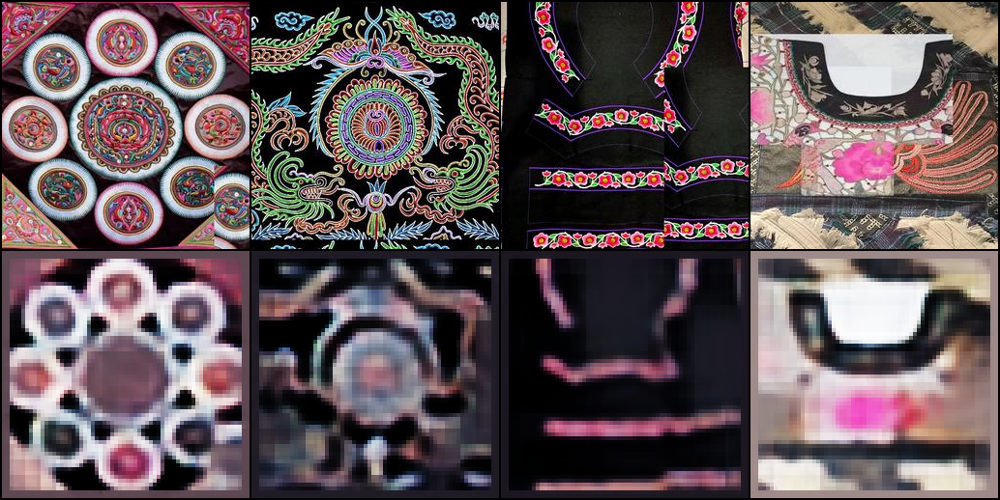

[VAE Train] epoch 6: 100%|██████████| 352/352 [00:36<00:00,  9.53it/s]

[VAE] epoch 6 loss 0.271125 rec 0.246229 kld 0.211516 seam 0.007490 acc 0.1886


[VAE] val   6 loss 0.270043 rec 0.246542 kld 0.204467 seam 0.006110 acc 0.1862
Saved best VAE checkpoint at epoch 6


[VAE Train] epoch 7: 100%|██████████| 352/352 [00:37<00:00,  9.49it/s]

[VAE] epoch 7 loss 0.268698 rec 0.244141 kld 0.212512 seam 0.006613 acc 0.1925


[VAE] val   7 loss 0.267463 rec 0.243138 kld 0.209771 seam 0.006696 acc 0.1960
Saved best VAE checkpoint at epoch 7


[VAE Train] epoch 8: 100%|██████████| 352/352 [00:37<00:00,  9.51it/s]

[VAE] epoch 8 loss 0.266657 rec 0.242334 kld 0.212618 seam 0.006122 acc 0.1954


[VAE] val   8 loss 0.265433 rec 0.241888 kld 0.206239 seam 0.005843 acc 0.1959
Saved best VAE checkpoint at epoch 8


[VAE Train] epoch 9: 100%|██████████| 352/352 [00:36<00:00,  9.52it/s]

[VAE] epoch 9 loss 0.264570 rec 0.240318 kld 0.212970 seam 0.005910 acc 0.2001


[VAE] val   9 loss 0.264375 rec 0.240346 kld 0.209509 seam 0.006156 acc 0.1982
Saved best VAE checkpoint at epoch 9


[VAE Train] epoch 10: 100%|██████████| 352/352 [00:36<00:00,  9.52it/s]

[VAE] epoch 10 loss 0.262878 rec 0.238745 kld 0.213519 seam 0.005561 acc 0.2034


[VAE] val   10 loss 0.262445 rec 0.239461 kld 0.207153 seam 0.004539 acc 0.2056
Saved best VAE checkpoint at epoch 10
Saved VAE sample to ./pcld_multimodal_checkpoints/samples/vae_epoch_10.png


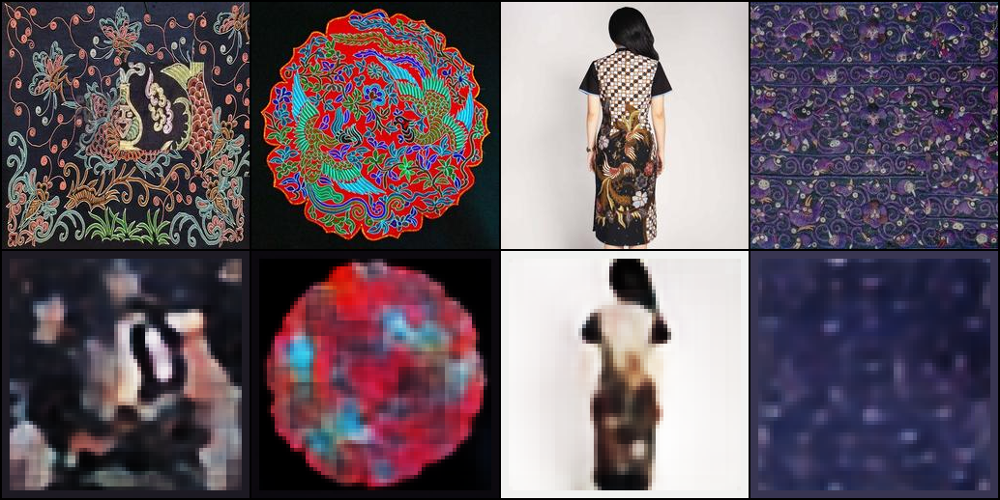

[VAE Train] epoch 11: 100%|██████████| 352/352 [00:36<00:00,  9.51it/s]

[VAE] epoch 11 loss 0.262133 rec 0.238141 kld 0.213550 seam 0.005274 acc 0.2041


[VAE] val   11 loss 0.263618 rec 0.239478 kld 0.209781 seam 0.006323 acc 0.1989
No improvement for 1/10 epochs


[VAE Train] epoch 12: 100%|██████████| 352/352 [00:36<00:00,  9.53it/s]

[VAE] epoch 12 loss 0.260801 rec 0.236867 kld 0.214234 seam 0.005021 acc 0.2073


[VAE] val   12 loss 0.261919 rec 0.238786 kld 0.209080 seam 0.004449 acc 0.2034
Saved best VAE checkpoint at epoch 12


[VAE Train] epoch 13: 100%|██████████| 352/352 [00:37<00:00,  9.50it/s]

[VAE] epoch 13 loss 0.259611 rec 0.235854 kld 0.214505 seam 0.004612 acc 0.2098


[VAE] val   13 loss 0.260435 rec 0.237030 kld 0.210782 seam 0.004654 acc 0.2040
Saved best VAE checkpoint at epoch 13


[VAE Train] epoch 14: 100%|██████████| 352/352 [00:37<00:00,  9.50it/s]

[VAE] epoch 14 loss 0.259085 rec 0.235370 kld 0.214981 seam 0.004434 acc 0.2105


[VAE] val   14 loss 0.259569 rec 0.236236 kld 0.213043 seam 0.004057 acc 0.2073
Saved best VAE checkpoint at epoch 14


[VAE Train] epoch 15: 100%|██████████| 352/352 [00:36<00:00,  9.52it/s]

[VAE] epoch 15 loss 0.258294 rec 0.234550 kld 0.215110 seam 0.004466 acc 0.2126


[VAE] val   15 loss 0.258949 rec 0.235936 kld 0.209306 seam 0.004165 acc 0.2079
Saved best VAE checkpoint at epoch 15
Saved VAE sample to ./pcld_multimodal_checkpoints/samples/vae_epoch_15.png


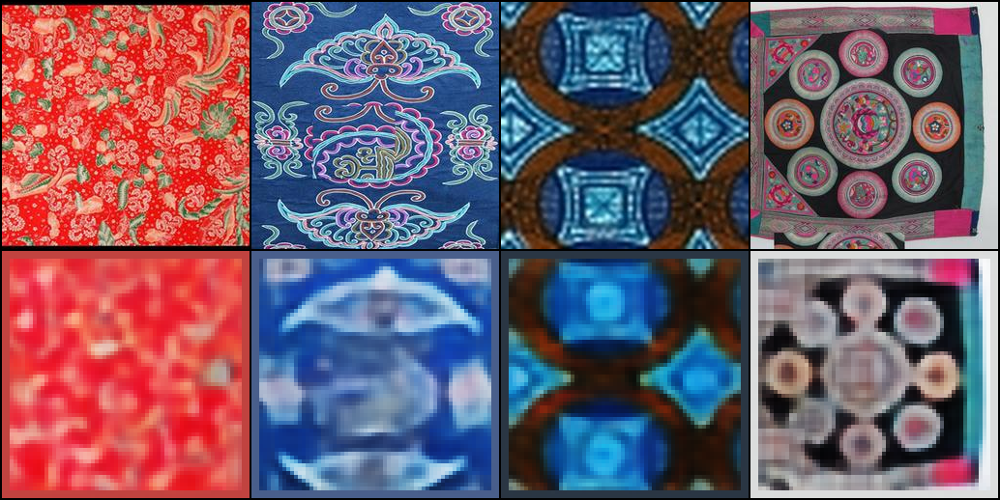

[VAE Train] epoch 16: 100%|██████████| 352/352 [00:36<00:00,  9.52it/s]

[VAE] epoch 16 loss 0.257819 rec 0.234179 kld 0.215399 seam 0.004199 acc 0.2137


[VAE] val   16 loss 0.257447 rec 0.234445 kld 0.211900 seam 0.003624 acc 0.2129
Saved best VAE checkpoint at epoch 16


[VAE Train] epoch 17: 100%|██████████| 352/352 [00:36<00:00,  9.53it/s]

[VAE] epoch 17 loss 0.256723 rec 0.233165 kld 0.216255 seam 0.003866 acc 0.2156


[VAE] val   17 loss 0.258468 rec 0.235099 kld 0.212568 seam 0.004223 acc 0.2143
No improvement for 1/10 epochs


[VAE Train] epoch 18: 100%|██████████| 352/352 [00:37<00:00,  9.51it/s]

[VAE] epoch 18 loss 0.256523 rec 0.232894 kld 0.216669 seam 0.003924 acc 0.2160


[VAE] val   18 loss 0.257840 rec 0.233921 kld 0.212516 seam 0.005335 acc 0.2168
No improvement for 2/10 epochs


[VAE Train] epoch 19: 100%|██████████| 352/352 [00:36<00:00,  9.53it/s]

[VAE] epoch 19 loss 0.255996 rec 0.232359 kld 0.216868 seam 0.003902 acc 0.2177


[VAE] val   19 loss 0.258128 rec 0.234990 kld 0.212437 seam 0.003790 acc 0.2153
No improvement for 3/10 epochs


[VAE Train] epoch 20: 100%|██████████| 352/352 [00:36<00:00,  9.52it/s]

[VAE] epoch 20 loss 0.255905 rec 0.232293 kld 0.217426 seam 0.003739 acc 0.2176


[VAE] val   20 loss 0.255720 rec 0.232610 kld 0.215518 seam 0.003117 acc 0.2194
Saved best VAE checkpoint at epoch 20
Saved VAE sample to ./pcld_multimodal_checkpoints/samples/vae_epoch_20.png


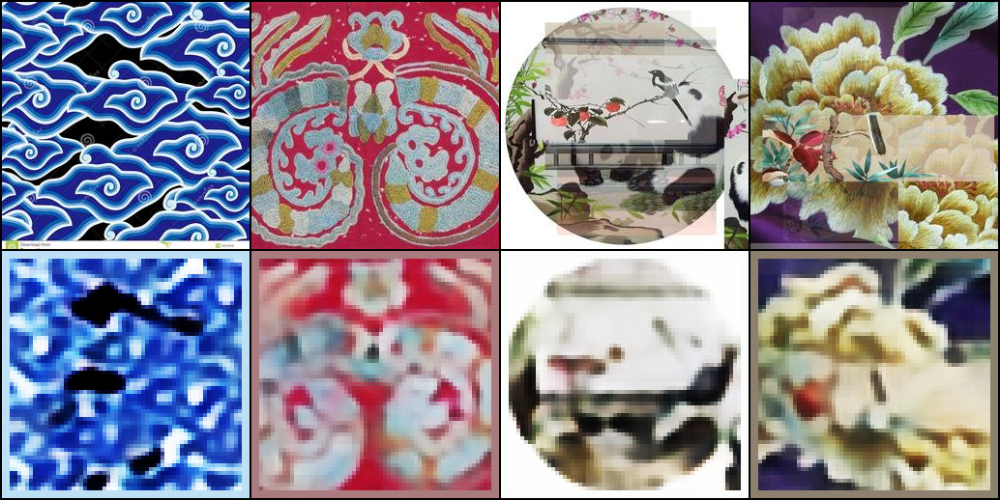

[VAE Train] epoch 21: 100%|██████████| 352/352 [00:37<00:00,  9.50it/s]

[VAE] epoch 21 loss 0.254777 rec 0.231106 kld 0.218061 seam 0.003730 acc 0.2210


[VAE] val   21 loss 0.255567 rec 0.232442 kld 0.215515 seam 0.003147 acc 0.2180
Saved best VAE checkpoint at epoch 21


[VAE Train] epoch 22: 100%|██████████| 352/352 [00:36<00:00,  9.52it/s]

[VAE] epoch 22 loss 0.254664 rec 0.231081 kld 0.218315 seam 0.003504 acc 0.2208


[VAE] val   22 loss 0.255829 rec 0.232519 kld 0.213335 seam 0.003952 acc 0.2184
No improvement for 1/10 epochs


[VAE Train] epoch 23: 100%|██████████| 352/352 [00:37<00:00,  9.50it/s]

[VAE] epoch 23 loss 0.254257 rec 0.230784 kld 0.218412 seam 0.003265 acc 0.2211


[VAE] val   23 loss 0.255269 rec 0.232527 kld 0.213033 seam 0.002878 acc 0.2165
Saved best VAE checkpoint at epoch 23


[VAE Train] epoch 24: 100%|██████████| 352/352 [00:36<00:00,  9.53it/s]

[VAE] epoch 24 loss 0.253923 rec 0.230338 kld 0.218717 seam 0.003428 acc 0.2225


[VAE] val   24 loss 0.254515 rec 0.230792 kld 0.217444 seam 0.003958 acc 0.2203
Saved best VAE checkpoint at epoch 24


[VAE Train] epoch 25: 100%|██████████| 352/352 [00:36<00:00,  9.53it/s]

[VAE] epoch 25 loss 0.253487 rec 0.229891 kld 0.219299 seam 0.003334 acc 0.2235


[VAE] val   25 loss 0.254198 rec 0.230717 kld 0.220842 seam 0.002793 acc 0.2183
Saved best VAE checkpoint at epoch 25
Saved VAE sample to ./pcld_multimodal_checkpoints/samples/vae_epoch_25.png


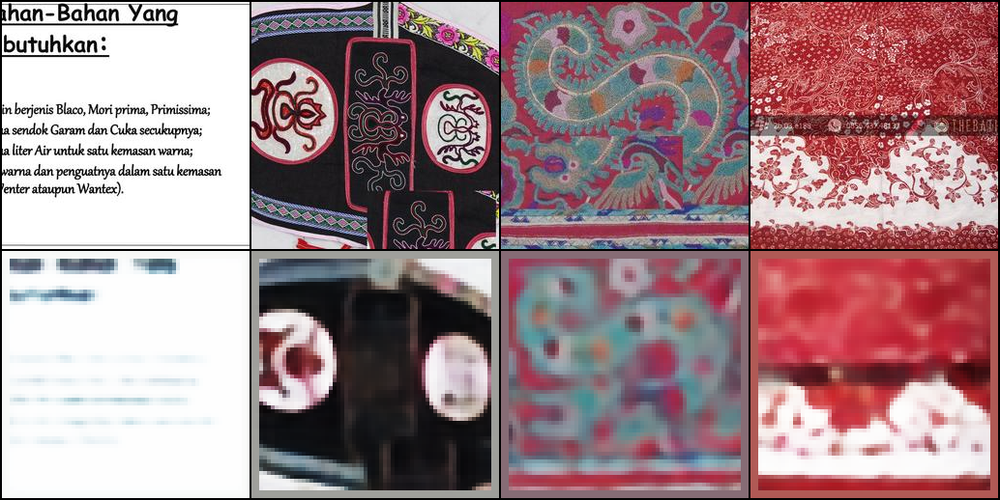

[VAE Train] epoch 26: 100%|██████████| 352/352 [00:36<00:00,  9.53it/s]

[VAE] epoch 26 loss 0.253858 rec 0.230354 kld 0.219055 seam 0.003198 acc 0.2215


[VAE] val   26 loss 0.255391 rec 0.232699 kld 0.211150 seam 0.003154 acc 0.2212
No improvement for 1/10 epochs


[VAE Train] epoch 27: 100%|██████████| 352/352 [00:37<00:00,  9.51it/s]

[VAE] epoch 27 loss 0.253190 rec 0.229661 kld 0.219592 seam 0.003140 acc 0.2233


[VAE] val   27 loss 0.255870 rec 0.231246 kld 0.216294 seam 0.005991 acc 0.2234
No improvement for 2/10 epochs


[VAE Train] epoch 28: 100%|██████████| 352/352 [00:37<00:00,  9.51it/s]

[VAE] epoch 28 loss 0.252940 rec 0.229392 kld 0.219929 seam 0.003111 acc 0.2240


[VAE] val   28 loss 0.254533 rec 0.231681 kld 0.214743 seam 0.002757 acc 0.2187
No improvement for 3/10 epochs


[VAE Train] epoch 29: 100%|██████████| 352/352 [00:36<00:00,  9.53it/s]

[VAE] epoch 29 loss 0.252715 rec 0.229167 kld 0.220199 seam 0.003056 acc 0.2251


[VAE] val   29 loss 0.254937 rec 0.231723 kld 0.217315 seam 0.002964 acc 0.2131
No improvement for 4/10 epochs


[VAE Train] epoch 30: 100%|██████████| 352/352 [00:37<00:00,  9.51it/s]

[VAE] epoch 30 loss 0.252652 rec 0.229092 kld 0.220183 seam 0.003083 acc 0.2249


[VAE] val   30 loss 0.252627 rec 0.229571 kld 0.217425 seam 0.002627 acc 0.2254
Saved best VAE checkpoint at epoch 30
Saved VAE sample to ./pcld_multimodal_checkpoints/samples/vae_epoch_30.png


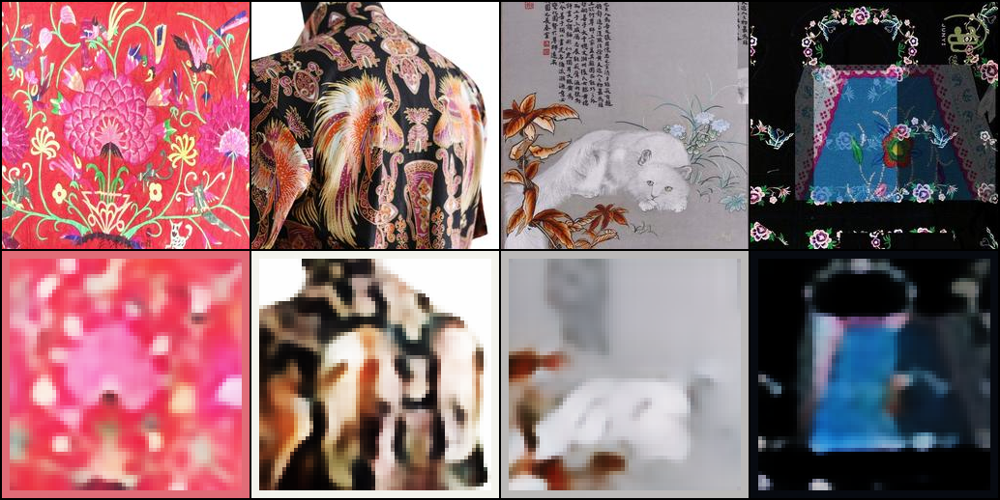

[VAE Train] epoch 31: 100%|██████████| 352/352 [00:36<00:00,  9.51it/s]

[VAE] epoch 31 loss 0.251755 rec 0.228333 kld 0.220334 seam 0.002776 acc 0.2275


[VAE] val   31 loss 0.253553 rec 0.229838 kld 0.221430 seam 0.003143 acc 0.2248
No improvement for 1/10 epochs


[VAE Train] epoch 32: 100%|██████████| 352/352 [00:37<00:00,  9.50it/s]

[VAE] epoch 32 loss 0.251984 rec 0.228483 kld 0.220510 seam 0.002900 acc 0.2266


[VAE] val   32 loss 0.255474 rec 0.232346 kld 0.215253 seam 0.003206 acc 0.2146
No improvement for 2/10 epochs


[VAE Train] epoch 33: 100%|██████████| 352/352 [00:36<00:00,  9.53it/s]

[VAE] epoch 33 loss 0.251884 rec 0.228247 kld 0.220764 seam 0.003121 acc 0.2271


[VAE] val   33 loss 0.253308 rec 0.230121 kld 0.219426 seam 0.002489 acc 0.2237
No improvement for 3/10 epochs


[VAE Train] epoch 34: 100%|██████████| 352/352 [00:36<00:00,  9.52it/s]

[VAE] epoch 34 loss 0.251854 rec 0.228401 kld 0.220558 seam 0.002793 acc 0.2265


[VAE] val   34 loss 0.254393 rec 0.231335 kld 0.214834 seam 0.003149 acc 0.2175
No improvement for 4/10 epochs


[VAE Train] epoch 35: 100%|██████████| 352/352 [00:36<00:00,  9.52it/s]

[VAE] epoch 35 loss 0.251310 rec 0.227849 kld 0.221079 seam 0.002706 acc 0.2279


[VAE] val   35 loss 0.253261 rec 0.230047 kld 0.216215 seam 0.003186 acc 0.2202
No improvement for 5/10 epochs
Saved VAE sample to ./pcld_multimodal_checkpoints/samples/vae_epoch_35.png


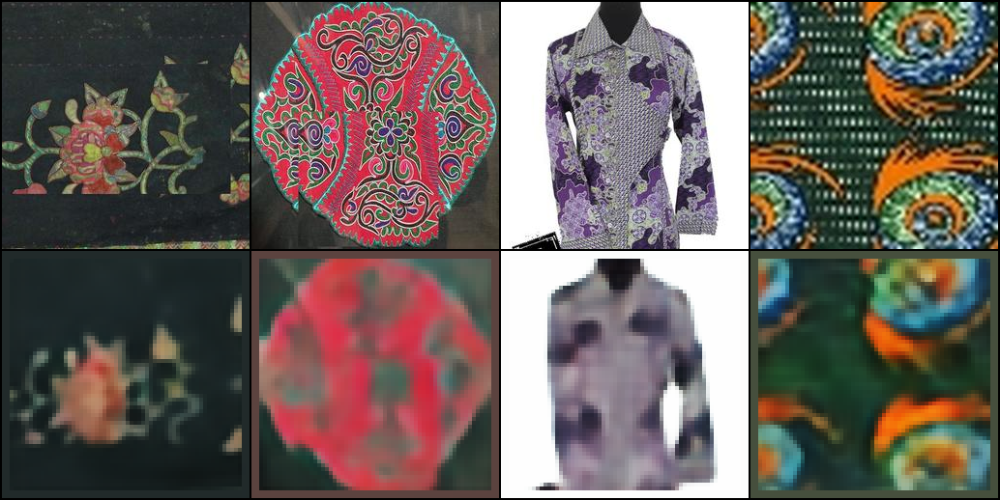

[VAE Train] epoch 36: 100%|██████████| 352/352 [00:36<00:00,  9.52it/s]

[VAE] epoch 36 loss 0.251240 rec 0.227767 kld 0.221083 seam 0.002729 acc 0.2281


[VAE] val   36 loss 0.253643 rec 0.231013 kld 0.213723 seam 0.002515 acc 0.2117
No improvement for 6/10 epochs


[VAE Train] epoch 37: 100%|██████████| 352/352 [00:36<00:00,  9.52it/s]

[VAE] epoch 37 loss 0.251080 rec 0.227544 kld 0.221434 seam 0.002784 acc 0.2290


[VAE] val   37 loss 0.254027 rec 0.230519 kld 0.222370 seam 0.002542 acc 0.2171
No improvement for 7/10 epochs


[VAE Train] epoch 38: 100%|██████████| 352/352 [00:36<00:00,  9.51it/s]

[VAE] epoch 38 loss 0.250922 rec 0.227521 kld 0.221125 seam 0.002577 acc 0.2289


[VAE] val   38 loss 0.251874 rec 0.228944 kld 0.217859 seam 0.002289 acc 0.2238
Saved best VAE checkpoint at epoch 38


[VAE Train] epoch 39: 100%|██████████| 352/352 [00:37<00:00,  9.50it/s]

[VAE] epoch 39 loss 0.250762 rec 0.227258 kld 0.221772 seam 0.002654 acc 0.2295


[VAE] val   39 loss 0.253499 rec 0.230398 kld 0.214494 seam 0.003302 acc 0.2219
No improvement for 1/10 epochs


[VAE Train] epoch 40: 100%|██████████| 352/352 [00:37<00:00,  9.50it/s]

[VAE] epoch 40 loss 0.251169 rec 0.227659 kld 0.221217 seam 0.002776 acc 0.2282


[VAE] val   40 loss 0.251921 rec 0.229178 kld 0.216198 seam 0.002246 acc 0.2204
No improvement for 2/10 epochs
Saved VAE sample to ./pcld_multimodal_checkpoints/samples/vae_epoch_40.png


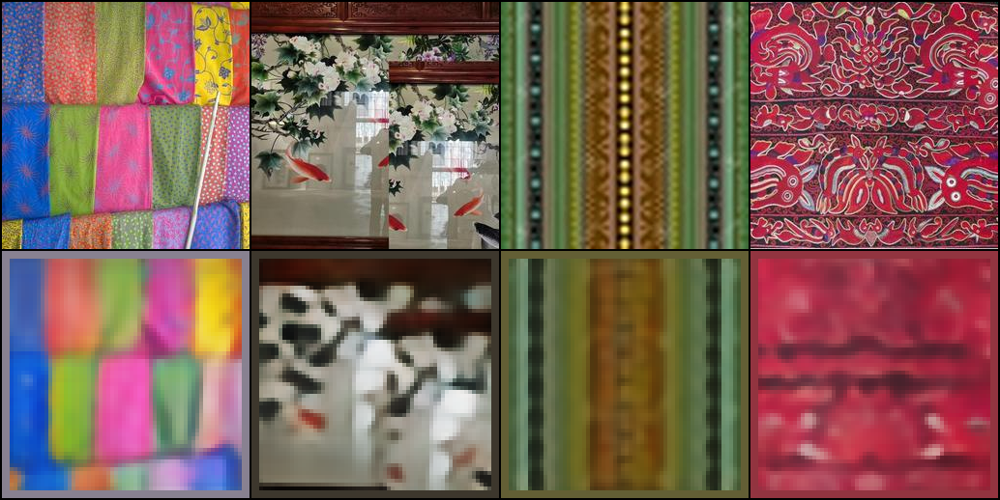

[VAE Train] epoch 41: 100%|██████████| 352/352 [00:37<00:00,  9.50it/s]

[VAE] epoch 41 loss 0.250227 rec 0.226765 kld 0.222063 seam 0.002510 acc 0.2309


[VAE] val   41 loss 0.252010 rec 0.229093 kld 0.217895 seam 0.002255 acc 0.2262
No improvement for 3/10 epochs


[VAE Train] epoch 42: 100%|██████████| 352/352 [00:37<00:00,  9.50it/s]

[VAE] epoch 42 loss 0.250615 rec 0.227155 kld 0.221669 seam 0.002585 acc 0.2297


[VAE] val   42 loss 0.253797 rec 0.230690 kld 0.218397 seam 0.002534 acc 0.2149
No improvement for 4/10 epochs


[VAE Train] epoch 43: 100%|██████████| 352/352 [00:37<00:00,  9.50it/s]

[VAE] epoch 43 loss 0.250250 rec 0.226839 kld 0.221657 seam 0.002491 acc 0.2309


[VAE] val   43 loss 0.251882 rec 0.228953 kld 0.215711 seam 0.002715 acc 0.2252
No improvement for 5/10 epochs


[VAE Train] epoch 44: 100%|██████████| 352/352 [00:37<00:00,  9.50it/s]

[VAE] epoch 44 loss 0.249953 rec 0.226562 kld 0.221596 seam 0.002462 acc 0.2319


[VAE] val   44 loss 0.251480 rec 0.229231 kld 0.210244 seam 0.002450 acc 0.2246
Saved best VAE checkpoint at epoch 44


[VAE Train] epoch 45: 100%|██████████| 352/352 [00:37<00:00,  9.51it/s]

[VAE] epoch 45 loss 0.250272 rec 0.226779 kld 0.222042 seam 0.002578 acc 0.2307


[VAE] val   45 loss 0.250706 rec 0.227842 kld 0.216125 seam 0.002504 acc 0.2290
Saved best VAE checkpoint at epoch 45
Saved VAE sample to ./pcld_multimodal_checkpoints/samples/vae_epoch_45.png


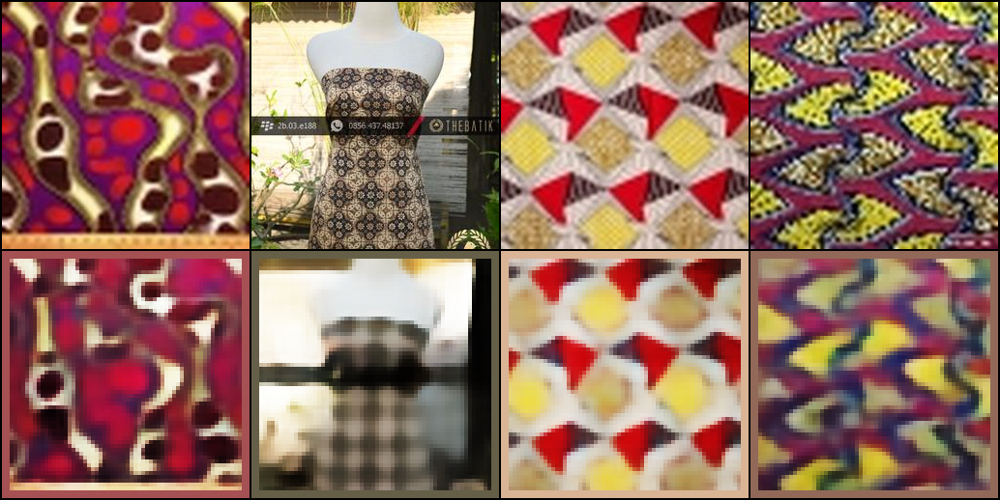

[VAE Train] epoch 46: 100%|██████████| 352/352 [00:37<00:00,  9.51it/s]

[VAE] epoch 46 loss 0.250056 rec 0.226642 kld 0.222009 seam 0.002426 acc 0.2307


[VAE] val   46 loss 0.250725 rec 0.227667 kld 0.218178 seam 0.002480 acc 0.2305
No improvement for 1/10 epochs


[VAE Train] epoch 47: 100%|██████████| 352/352 [00:37<00:00,  9.51it/s]

[VAE] epoch 47 loss 0.249741 rec 0.226272 kld 0.222144 seam 0.002509 acc 0.2321


[VAE] val   47 loss 0.253499 rec 0.230688 kld 0.217185 seam 0.002186 acc 0.2136
No improvement for 2/10 epochs


[VAE Train] epoch 48: 100%|██████████| 352/352 [00:37<00:00,  9.51it/s]

[VAE] epoch 48 loss 0.249946 rec 0.226540 kld 0.222190 seam 0.002374 acc 0.2306


[VAE] val   48 loss 0.251559 rec 0.228234 kld 0.217770 seam 0.003095 acc 0.2237
No improvement for 3/10 epochs


[VAE Train] epoch 49: 100%|██████████| 352/352 [00:37<00:00,  9.50it/s]

[VAE] epoch 49 loss 0.249705 rec 0.226221 kld 0.222124 seam 0.002544 acc 0.2321


[VAE] val   49 loss 0.251375 rec 0.227676 kld 0.222755 seam 0.002847 acc 0.2318
No improvement for 4/10 epochs


[VAE Train] epoch 50: 100%|██████████| 352/352 [00:37<00:00,  9.50it/s]

[VAE] epoch 50 loss 0.249383 rec 0.225940 kld 0.222820 seam 0.002323 acc 0.2329


[VAE] val   50 loss 0.251308 rec 0.228087 kld 0.218992 seam 0.002644 acc 0.2292
No improvement for 5/10 epochs
Saved VAE sample to ./pcld_multimodal_checkpoints/samples/vae_epoch_50.png


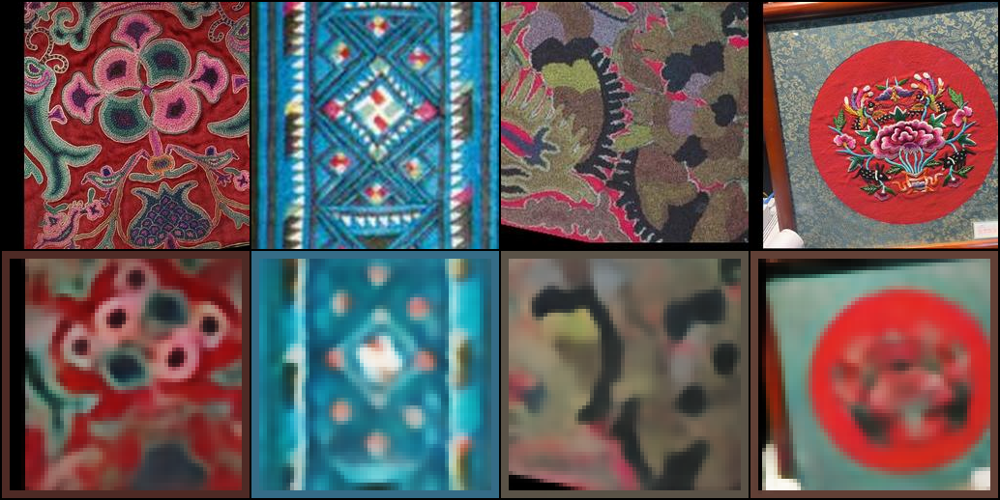

[VAE Train] epoch 51: 100%|██████████| 352/352 [00:37<00:00,  9.48it/s]

[VAE] epoch 51 loss 0.249181 rec 0.225776 kld 0.222435 seam 0.002323 acc 0.2338


[VAE] val   51 loss 0.250263 rec 0.227223 kld 0.220283 seam 0.002023 acc 0.2297
Saved best VAE checkpoint at epoch 51


[VAE Train] epoch 52: 100%|██████████| 352/352 [00:37<00:00,  9.50it/s]

[VAE] epoch 52 loss 0.249237 rec 0.225820 kld 0.222713 seam 0.002292 acc 0.2337


[VAE] val   52 loss 0.250081 rec 0.226930 kld 0.221693 seam 0.001964 acc 0.2322
Saved best VAE checkpoint at epoch 52


[VAE Train] epoch 53: 100%|██████████| 352/352 [00:37<00:00,  9.51it/s]

[VAE] epoch 53 loss 0.249051 rec 0.225577 kld 0.223090 seam 0.002331 acc 0.2342


[VAE] val   53 loss 0.250312 rec 0.227197 kld 0.221412 seam 0.001947 acc 0.2297
No improvement for 1/10 epochs


[VAE Train] epoch 54: 100%|██████████| 352/352 [00:37<00:00,  9.50it/s]

[VAE] epoch 54 loss 0.249368 rec 0.225960 kld 0.222531 seam 0.002309 acc 0.2324


[VAE] val   54 loss 0.250620 rec 0.227128 kld 0.221974 seam 0.002589 acc 0.2304
No improvement for 2/10 epochs


[VAE Train] epoch 55: 100%|██████████| 352/352 [00:37<00:00,  9.49it/s]

[VAE] epoch 55 loss 0.249032 rec 0.225604 kld 0.222702 seam 0.002315 acc 0.2340


[VAE] val   55 loss 0.250326 rec 0.227248 kld 0.220082 seam 0.002139 acc 0.2314
No improvement for 3/10 epochs
Saved VAE sample to ./pcld_multimodal_checkpoints/samples/vae_epoch_55.png


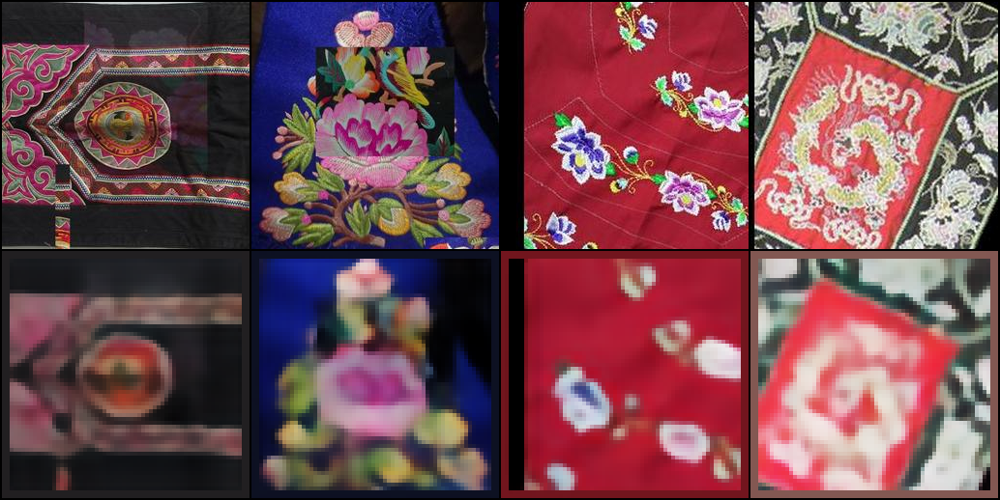

[VAE Train] epoch 56: 100%|██████████| 352/352 [00:37<00:00,  9.51it/s]

[VAE] epoch 56 loss 0.249120 rec 0.225710 kld 0.222975 seam 0.002225 acc 0.2335


[VAE] val   56 loss 0.250888 rec 0.227558 kld 0.221887 seam 0.002284 acc 0.2306
No improvement for 4/10 epochs


[VAE Train] epoch 57: 100%|██████████| 352/352 [00:36<00:00,  9.52it/s]

[VAE] epoch 57 loss 0.248753 rec 0.225369 kld 0.222823 seam 0.002204 acc 0.2344


[VAE] val   57 loss 0.250934 rec 0.228086 kld 0.217986 seam 0.002098 acc 0.2292
No improvement for 5/10 epochs


[VAE Train] epoch 58: 100%|██████████| 352/352 [00:37<00:00,  9.50it/s]

[VAE] epoch 58 loss 0.248690 rec 0.225246 kld 0.223142 seam 0.002260 acc 0.2350


[VAE] val   58 loss 0.249380 rec 0.226299 kld 0.221924 seam 0.001778 acc 0.2334
Saved best VAE checkpoint at epoch 58


[VAE Train] epoch 59: 100%|██████████| 352/352 [00:37<00:00,  9.50it/s]

[VAE] epoch 59 loss 0.248671 rec 0.225292 kld 0.223052 seam 0.002148 acc 0.2348


[VAE] val   59 loss 0.250942 rec 0.227972 kld 0.218501 seam 0.002241 acc 0.2275
No improvement for 1/10 epochs


[VAE Train] epoch 60: 100%|██████████| 352/352 [00:37<00:00,  9.51it/s]

[VAE] epoch 60 loss 0.248551 rec 0.225154 kld 0.223140 seam 0.002166 acc 0.2354


[VAE] val   60 loss 0.250487 rec 0.227329 kld 0.219575 seam 0.002402 acc 0.2313
No improvement for 2/10 epochs
Saved VAE sample to ./pcld_multimodal_checkpoints/samples/vae_epoch_60.png


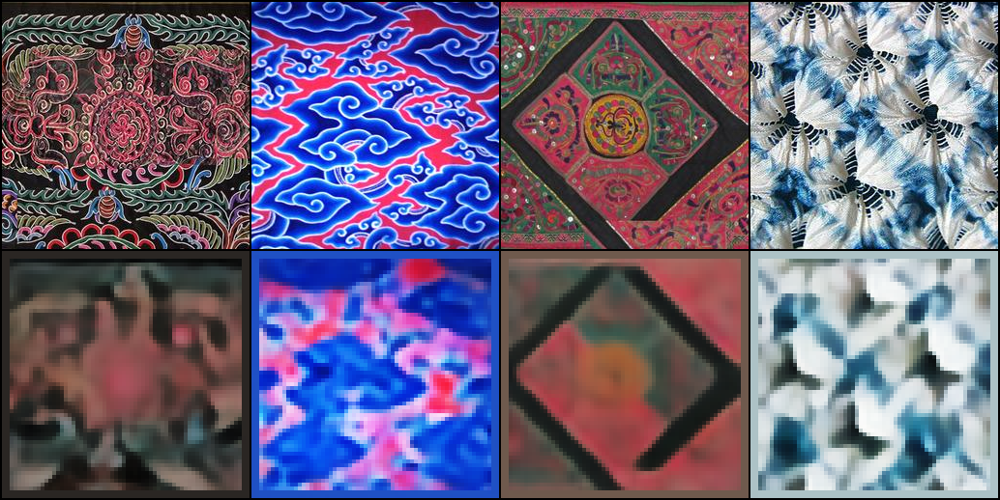

[VAE Train] epoch 61: 100%|██████████| 352/352 [00:37<00:00,  9.51it/s]

[VAE] epoch 61 loss 0.248588 rec 0.225202 kld 0.223074 seam 0.002158 acc 0.2351


[VAE] val   61 loss 0.249915 rec 0.226323 kld 0.225527 seam 0.002079 acc 0.2317
No improvement for 3/10 epochs


[VAE Train] epoch 62: 100%|██████████| 352/352 [00:37<00:00,  9.51it/s]

[VAE] epoch 62 loss 0.248496 rec 0.225039 kld 0.223486 seam 0.002218 acc 0.2353


[VAE] val   62 loss 0.250535 rec 0.227985 kld 0.215419 seam 0.002017 acc 0.2295
No improvement for 4/10 epochs


[VAE Train] epoch 63: 100%|██████████| 352/352 [00:37<00:00,  9.51it/s]

[VAE] epoch 63 loss 0.248615 rec 0.225136 kld 0.223375 seam 0.002283 acc 0.2352


[VAE] val   63 loss 0.250562 rec 0.226870 kld 0.227271 seam 0.001930 acc 0.2292
No improvement for 5/10 epochs


[VAE Train] epoch 64: 100%|██████████| 352/352 [00:37<00:00,  9.50it/s]

[VAE] epoch 64 loss 0.248383 rec 0.224950 kld 0.223762 seam 0.002115 acc 0.2356


[VAE] val   64 loss 0.251892 rec 0.228818 kld 0.220426 seam 0.002064 acc 0.2252
No improvement for 6/10 epochs


[VAE Train] epoch 65: 100%|██████████| 352/352 [00:37<00:00,  9.49it/s]

[VAE] epoch 65 loss 0.248120 rec 0.224718 kld 0.223673 seam 0.002070 acc 0.2367


[VAE] val   65 loss 0.249693 rec 0.226782 kld 0.220074 seam 0.001807 acc 0.2339
No improvement for 7/10 epochs
Saved VAE sample to ./pcld_multimodal_checkpoints/samples/vae_epoch_65.png


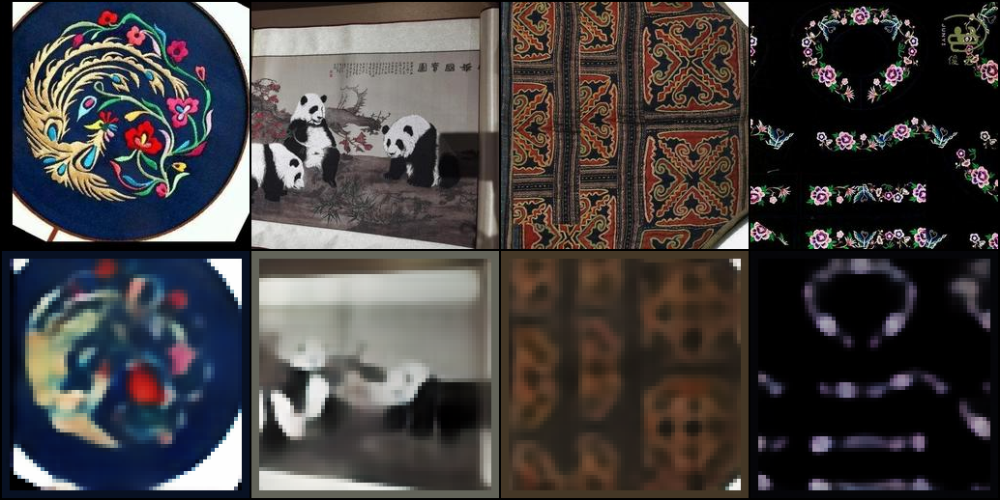

[VAE Train] epoch 66: 100%|██████████| 352/352 [00:36<00:00,  9.52it/s]

[VAE] epoch 66 loss 0.248176 rec 0.224748 kld 0.223454 seam 0.002165 acc 0.2362


[VAE] val   66 loss 0.249625 rec 0.227598 kld 0.211133 seam 0.001828 acc 0.2299
No improvement for 8/10 epochs


[VAE Train] epoch 67: 100%|██████████| 352/352 [00:37<00:00,  9.50it/s]

[VAE] epoch 67 loss 0.248114 rec 0.224742 kld 0.223628 seam 0.002019 acc 0.2361


[VAE] val   67 loss 0.248737 rec 0.225870 kld 0.220082 seam 0.001717 acc 0.2338
Saved best VAE checkpoint at epoch 67


[VAE Train] epoch 68: 100%|██████████| 352/352 [00:37<00:00,  9.50it/s]

[VAE] epoch 68 loss 0.247976 rec 0.224599 kld 0.223858 seam 0.001983 acc 0.2368


[VAE] val   68 loss 0.249897 rec 0.226984 kld 0.218479 seam 0.002131 acc 0.2308
No improvement for 1/10 epochs


[VAE Train] epoch 69: 100%|██████████| 352/352 [00:37<00:00,  9.50it/s]

[VAE] epoch 69 loss 0.248144 rec 0.224703 kld 0.223842 seam 0.002114 acc 0.2363


[VAE] val   69 loss 0.249301 rec 0.226096 kld 0.221256 seam 0.002158 acc 0.2336
No improvement for 2/10 epochs


[VAE Train] epoch 70: 100%|██████████| 352/352 [00:37<00:00,  9.50it/s]

[VAE] epoch 70 loss 0.247814 rec 0.224394 kld 0.223956 seam 0.002049 acc 0.2376


[VAE] val   70 loss 0.249490 rec 0.226560 kld 0.218098 seam 0.002240 acc 0.2313
No improvement for 3/10 epochs
Saved VAE sample to ./pcld_multimodal_checkpoints/samples/vae_epoch_70.png


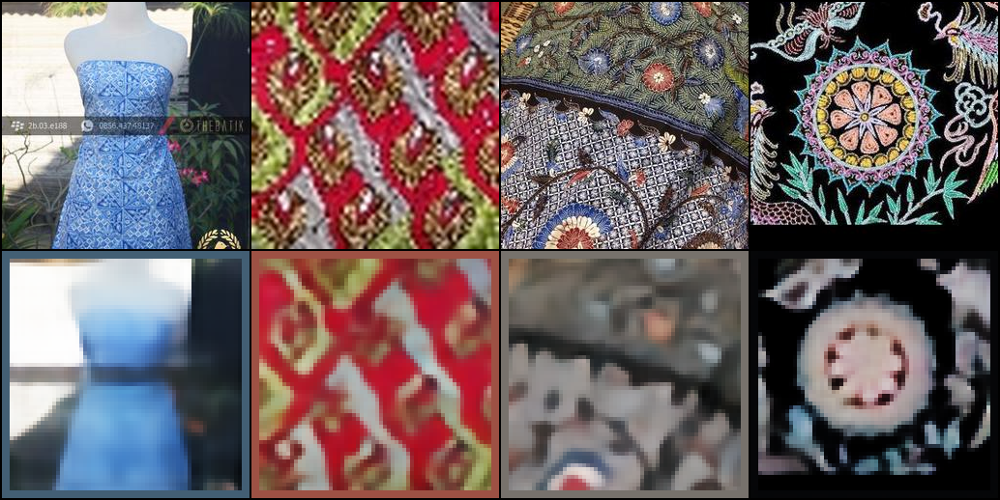

[VAE Train] epoch 71: 100%|██████████| 352/352 [00:36<00:00,  9.52it/s]

[VAE] epoch 71 loss 0.247823 rec 0.224444 kld 0.223814 seam 0.001997 acc 0.2372


[VAE] val   71 loss 0.249371 rec 0.226329 kld 0.219179 seam 0.002248 acc 0.2349
No improvement for 4/10 epochs


[VAE Train] epoch 72: 100%|██████████| 352/352 [00:37<00:00,  9.51it/s]

[VAE] epoch 72 loss 0.247797 rec 0.224412 kld 0.223795 seam 0.002010 acc 0.2368


[VAE] val   72 loss 0.249209 rec 0.226746 kld 0.216262 seam 0.001675 acc 0.2319
No improvement for 5/10 epochs


[VAE Train] epoch 73: 100%|██████████| 352/352 [00:36<00:00,  9.52it/s]

[VAE] epoch 73 loss 0.247632 rec 0.224252 kld 0.224016 seam 0.001956 acc 0.2377


[VAE] val   73 loss 0.249698 rec 0.226649 kld 0.221187 seam 0.001860 acc 0.2325
No improvement for 6/10 epochs


[VAE Train] epoch 74: 100%|██████████| 352/352 [00:36<00:00,  9.52it/s]

[VAE] epoch 74 loss 0.247781 rec 0.224389 kld 0.223940 seam 0.001996 acc 0.2370


[VAE] val   74 loss 0.249536 rec 0.226567 kld 0.220782 seam 0.001782 acc 0.2320
No improvement for 7/10 epochs


[VAE Train] epoch 75: 100%|██████████| 352/352 [00:37<00:00,  9.51it/s]

[VAE] epoch 75 loss 0.247687 rec 0.224274 kld 0.224134 seam 0.001999 acc 0.2376


[VAE] val   75 loss 0.249312 rec 0.226327 kld 0.220383 seam 0.001892 acc 0.2350
No improvement for 8/10 epochs
Saved VAE sample to ./pcld_multimodal_checkpoints/samples/vae_epoch_75.png


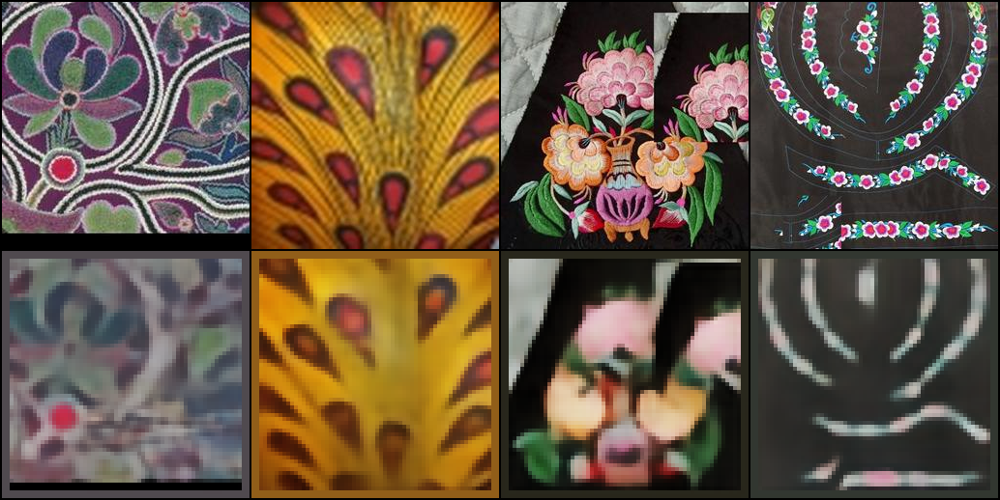

[VAE Train] epoch 76: 100%|██████████| 352/352 [00:36<00:00,  9.52it/s]

[VAE] epoch 76 loss 0.247567 rec 0.224187 kld 0.224191 seam 0.001922 acc 0.2377


[VAE] val   76 loss 0.248941 rec 0.225882 kld 0.220683 seam 0.001982 acc 0.2310
No improvement for 9/10 epochs


[VAE Train] epoch 77: 100%|██████████| 352/352 [00:36<00:00,  9.51it/s]

[VAE] epoch 77 loss 0.247430 rec 0.224013 kld 0.224292 seam 0.001977 acc 0.2385


[VAE] val   77 loss 0.249279 rec 0.225405 kld 0.228042 seam 0.002138 acc 0.2347
No improvement for 10/10 epochs
Early stopping VAE at epoch 77
Saved VAE component plot to ./pcld_multimodal_checkpoints/logs/vae_loss_components.png


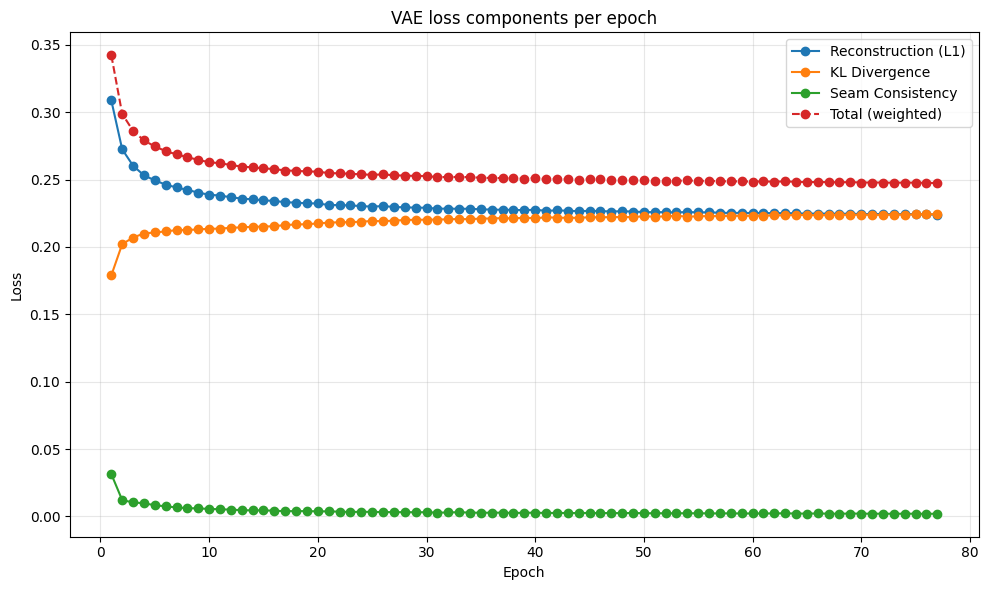

Saved VAE loss components json to ./pcld_multimodal_checkpoints/logs/vae_loss_components.json

=== Stage 2: Train LDM (multimodal) ===



[LDM Train] epoch 1: 100%|██████████| 352/352 [00:28<00:00, 12.24it/s]

[LDM] epoch 1 loss 0.356136 acc 0.0978


[LDM] val   1 loss 0.252986 acc 0.1214
Saved best LDM checkpoint at epoch 1


[LDM Train] epoch 2: 100%|██████████| 352/352 [00:28<00:00, 12.48it/s]

[LDM] epoch 2 loss 0.228891 acc 0.1334


[LDM] val   2 loss 0.218981 acc 0.1424
Saved best LDM checkpoint at epoch 2


[LDM Train] epoch 3: 100%|██████████| 352/352 [00:28<00:00, 12.43it/s]

[LDM] epoch 3 loss 0.213264 acc 0.1467


[LDM] val   3 loss 0.205830 acc 0.1514
Saved best LDM checkpoint at epoch 3


[LDM Train] epoch 4: 100%|██████████| 352/352 [01:10<00:00,  5.01it/s]

[LDM] epoch 4 loss 0.203854 acc 0.1563


[LDM] val   4 loss 0.200387 acc 0.1622
Saved best LDM checkpoint at epoch 4


[LDM Train] epoch 5: 100%|██████████| 352/352 [01:06<00:00,  5.28it/s]

[LDM] epoch 5 loss 0.193927 acc 0.1656


[LDM] val   5 loss 0.191733 acc 0.1687
Saved best LDM checkpoint at epoch 5
Saved sample to ./pcld_multimodal_checkpoints/samples/ldm_epoch_5.png


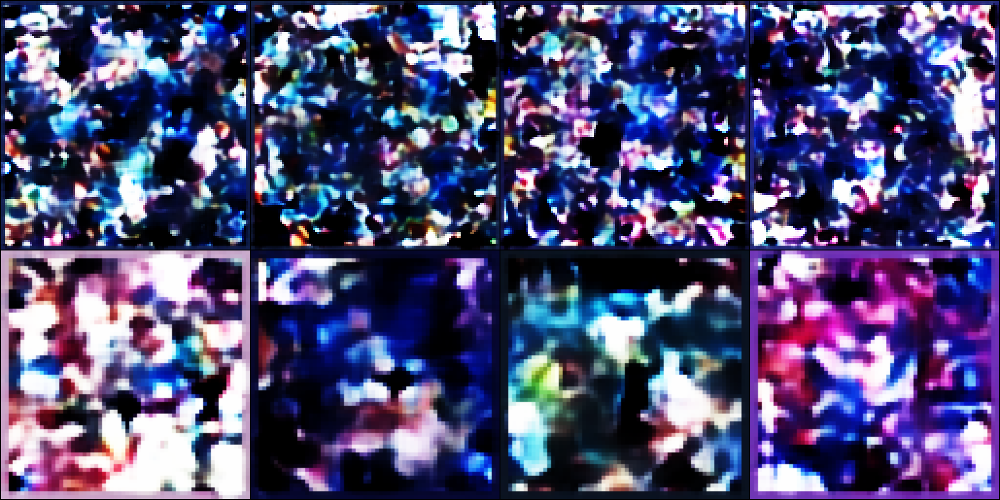

[LDM Train] epoch 6: 100%|██████████| 352/352 [00:28<00:00, 12.37it/s]

[LDM] epoch 6 loss 0.189876 acc 0.1723


[LDM] val   6 loss 0.192221 acc 0.1752
No improvement for 1/10 epochs


[LDM Train] epoch 7: 100%|██████████| 352/352 [00:28<00:00, 12.51it/s]

[LDM] epoch 7 loss 0.187641 acc 0.1779


[LDM] val   7 loss 0.189792 acc 0.1839
Saved best LDM checkpoint at epoch 7


[LDM Train] epoch 8: 100%|██████████| 352/352 [00:28<00:00, 12.43it/s]

[LDM] epoch 8 loss 0.185698 acc 0.1837


[LDM] val   8 loss 0.188468 acc 0.1885
Saved best LDM checkpoint at epoch 8


[LDM Train] epoch 9: 100%|██████████| 352/352 [00:28<00:00, 12.45it/s]

[LDM] epoch 9 loss 0.178087 acc 0.1924


[LDM] val   9 loss 0.167619 acc 0.1990
Saved best LDM checkpoint at epoch 9


[LDM Train] epoch 10: 100%|██████████| 352/352 [00:28<00:00, 12.43it/s]

[LDM] epoch 10 loss 0.178044 acc 0.1965


[LDM] val   10 loss 0.185163 acc 0.2001
No improvement for 1/10 epochs
Saved sample to ./pcld_multimodal_checkpoints/samples/ldm_epoch_10.png


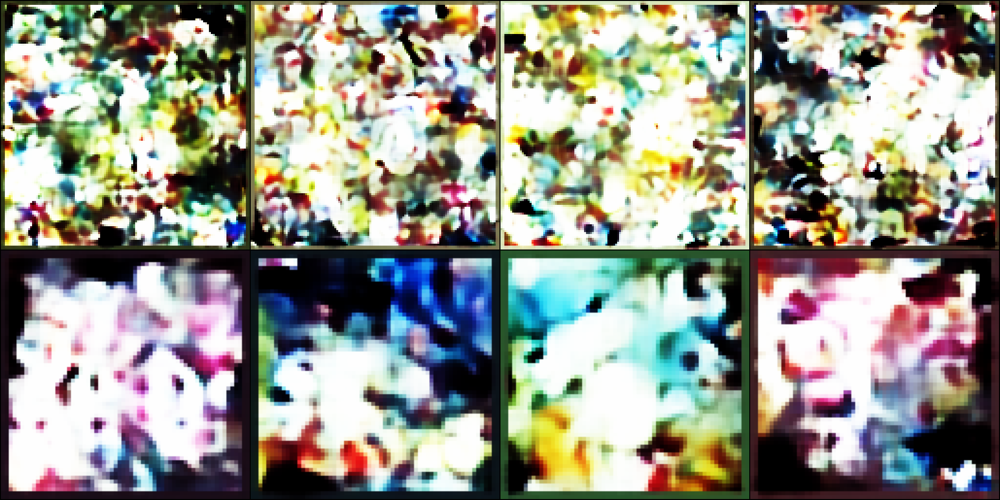

[LDM Train] epoch 11: 100%|██████████| 352/352 [00:28<00:00, 12.48it/s]

[LDM] epoch 11 loss 0.174042 acc 0.2026


[LDM] val   11 loss 0.183169 acc 0.2030
No improvement for 2/10 epochs


[LDM Train] epoch 12: 100%|██████████| 352/352 [00:28<00:00, 12.45it/s]

[LDM] epoch 12 loss 0.173939 acc 0.2072


[LDM] val   12 loss 0.171507 acc 0.2142
No improvement for 3/10 epochs


[LDM Train] epoch 13: 100%|██████████| 352/352 [00:28<00:00, 12.42it/s]

[LDM] epoch 13 loss 0.170740 acc 0.2132


[LDM] val   13 loss 0.181164 acc 0.2146
No improvement for 4/10 epochs


[LDM Train] epoch 14: 100%|██████████| 352/352 [00:28<00:00, 12.46it/s]

[LDM] epoch 14 loss 0.174998 acc 0.2142


[LDM] val   14 loss 0.174396 acc 0.2199
No improvement for 5/10 epochs


[LDM Train] epoch 15: 100%|██████████| 352/352 [00:28<00:00, 12.44it/s]

[LDM] epoch 15 loss 0.175839 acc 0.2185


[LDM] val   15 loss 0.176319 acc 0.2179
No improvement for 6/10 epochs
Saved sample to ./pcld_multimodal_checkpoints/samples/ldm_epoch_15.png


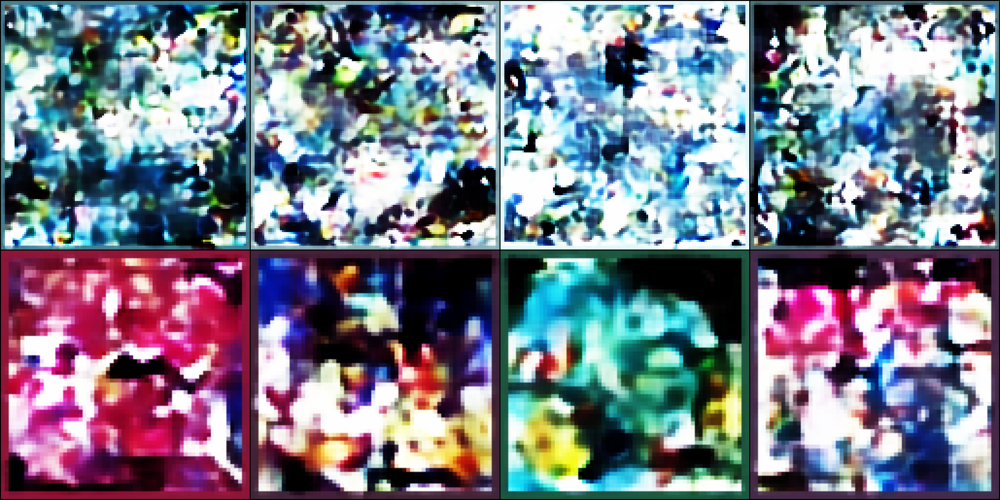

[LDM Train] epoch 16: 100%|██████████| 352/352 [00:28<00:00, 12.47it/s]

[LDM] epoch 16 loss 0.168061 acc 0.2256


[LDM] val   16 loss 0.159578 acc 0.2329
Saved best LDM checkpoint at epoch 16


[LDM Train] epoch 17: 100%|██████████| 352/352 [00:28<00:00, 12.44it/s]

[LDM] epoch 17 loss 0.167867 acc 0.2289


[LDM] val   17 loss 0.173767 acc 0.2260
No improvement for 1/10 epochs


[LDM Train] epoch 18: 100%|██████████| 352/352 [00:28<00:00, 12.43it/s]

[LDM] epoch 18 loss 0.168794 acc 0.2302


[LDM] val   18 loss 0.166165 acc 0.2348
No improvement for 2/10 epochs


[LDM Train] epoch 19: 100%|██████████| 352/352 [00:28<00:00, 12.45it/s]

[LDM] epoch 19 loss 0.168459 acc 0.2343


[LDM] val   19 loss 0.173287 acc 0.2342
No improvement for 3/10 epochs


[LDM Train] epoch 20: 100%|██████████| 352/352 [00:28<00:00, 12.46it/s]

[LDM] epoch 20 loss 0.166589 acc 0.2376


[LDM] val   20 loss 0.168022 acc 0.2365
No improvement for 4/10 epochs
Saved sample to ./pcld_multimodal_checkpoints/samples/ldm_epoch_20.png


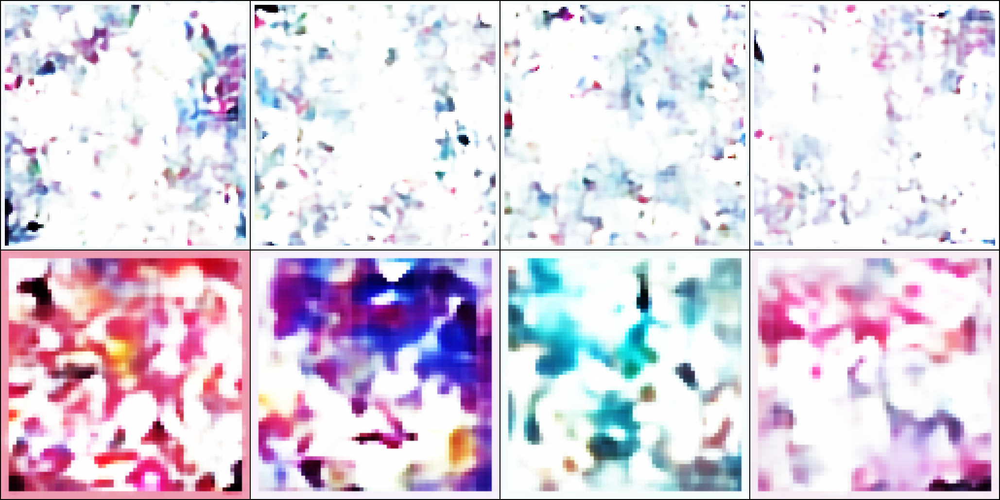

[LDM Train] epoch 21: 100%|██████████| 352/352 [00:28<00:00, 12.46it/s]

[LDM] epoch 21 loss 0.167242 acc 0.2374


[LDM] val   21 loss 0.160029 acc 0.2492
No improvement for 5/10 epochs


[LDM Train] epoch 22: 100%|██████████| 352/352 [00:28<00:00, 12.40it/s]

[LDM] epoch 22 loss 0.164246 acc 0.2429


[LDM] val   22 loss 0.161063 acc 0.2450
No improvement for 6/10 epochs


[LDM Train] epoch 23: 100%|██████████| 352/352 [00:28<00:00, 12.43it/s]

[LDM] epoch 23 loss 0.165467 acc 0.2445


[LDM] val   23 loss 0.158155 acc 0.2507
Saved best LDM checkpoint at epoch 23


[LDM Train] epoch 24: 100%|██████████| 352/352 [00:28<00:00, 12.45it/s]

[LDM] epoch 24 loss 0.163399 acc 0.2455


[LDM] val   24 loss 0.162841 acc 0.2476
No improvement for 1/10 epochs


[LDM Train] epoch 25: 100%|██████████| 352/352 [00:28<00:00, 12.42it/s]

[LDM] epoch 25 loss 0.161679 acc 0.2507


[LDM] val   25 loss 0.160838 acc 0.2529
No improvement for 2/10 epochs
Saved sample to ./pcld_multimodal_checkpoints/samples/ldm_epoch_25.png


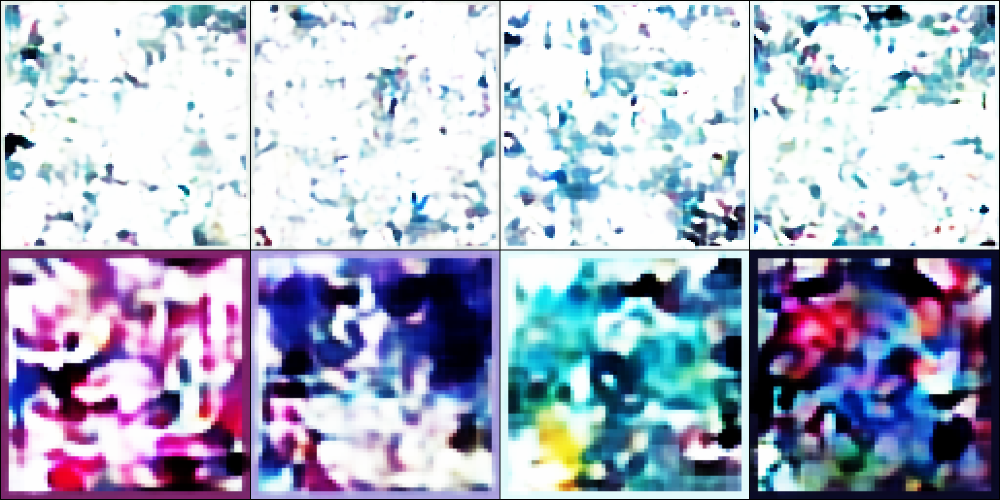

[LDM Train] epoch 26: 100%|██████████| 352/352 [00:28<00:00, 12.42it/s]

[LDM] epoch 26 loss 0.161842 acc 0.2523


[LDM] val   26 loss 0.155693 acc 0.2601
Saved best LDM checkpoint at epoch 26


[LDM Train] epoch 27: 100%|██████████| 352/352 [00:28<00:00, 12.43it/s]

[LDM] epoch 27 loss 0.160947 acc 0.2545


[LDM] val   27 loss 0.163009 acc 0.2363
No improvement for 1/10 epochs


[LDM Train] epoch 28:  60%|█████▉    | 210/352 [00:17<00:11, 12.29it/s]


KeyboardInterrupt: 

In [7]:
# Updated training script with 200 epochs and early stopping
# Save as train_with_early_stopping.py and run as before

import os, json, random, math, argparse, warnings
from pathlib import Path
from typing import List, Tuple, Dict
import torch, torch.nn as nn, torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, random_split
from torchvision import transforms, utils
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm

# Suppress warnings
warnings.filterwarnings('ignore')
os.environ["TOKENIZERS_PARALLELISM"] = "false"

# Notebook display (optional)
try:
    from IPython.display import display, clear_output
    _HAS_IPY = True
except Exception:
    _HAS_IPY = False

# ---------------------
# CONFIG (edit before running)
# ---------------------
CONFIG = {
    'device': 'cuda' if torch.cuda.is_available() else 'cpu',
    'img_size': 256,
    'latent_channels': 16,
    'latent_h': 32,
    'vae_channels': 128,
    'ptc_embed_dim': 192,
    'ptc_layers': 4,
    'ldm_base_channels': 128,
    'text_embed_dim': 192,
    'text_hidden_dim': 256,
    'max_text_len': 40,
    'batch_size': 16,
    'vae_lr': 2e-4,
    'ldm_lr': 2e-4,
    'timesteps': 200,
    'seam_band': 8,
    'save_dir': './pcld_multimodal_checkpoints',
    'sample_every': 5,
    'num_sample_images': 4,
    'cf_prob': 0.1,
    'use_amp': True,
    # early stopping params
    'early_stop_patience': 10,
    'early_stop_min_delta': 1e-4
}
os.makedirs(CONFIG['save_dir'], exist_ok=True)
os.makedirs(os.path.join(CONFIG['save_dir'],'samples'), exist_ok=True)
os.makedirs(os.path.join(CONFIG['save_dir'],'logs'), exist_ok=True)

# ---------------------
# Utilities
# ---------------------
def seam_consistency_loss(img: torch.Tensor, band:int=8) -> torch.Tensor:
    left  = img[:,:,:, :band]
    right = img[:,:,:, -band:]
    top   = img[:,:, :band, :]
    bottom= img[:,:, -band:, :]
    return F.l1_loss(left, right) + F.l1_loss(top, bottom)

def count_params(m: nn.Module):
    return sum(p.numel() for p in m.parameters() if p.requires_grad)

def save_image_grid(tensor, path, nrow=4):
    grid = utils.make_grid((tensor.clamp(-1,1)+1)/2.0, nrow=nrow)
    ndarr = grid.mul(255).permute(1,2,0).byte().cpu().numpy()
    Image.fromarray(ndarr).save(path)

def display_image_tensor_no_clear(tensor, nrow=4):
    grid = utils.make_grid((tensor.clamp(-1,1)+1)/2.0, nrow=nrow)
    ndarr = grid.mul(255).permute(1,2,0).byte().cpu().numpy()
    img = Image.fromarray(ndarr)
    if _HAS_IPY:
        display(img)  # No clear_output
    else:
        img.show()

def plot_metrics(losses, accs, stage_name, save_path):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
    epochs = list(range(1, len(losses) + 1))
    ax1.plot(epochs, losses, 'b-', linewidth=2, marker='o')
    ax1.set_xlabel('Epoch', fontsize=12)
    ax1.set_ylabel('Loss', fontsize=12)
    ax1.set_title(f'{stage_name} Training Loss', fontsize=14, fontweight='bold')
    ax1.grid(True, alpha=0.3)
    ax2.plot(epochs, accs, 'g-', linewidth=2, marker='s')
    ax2.set_xlabel('Epoch', fontsize=12)
    ax2.set_ylabel('Accuracy', fontsize=12)
    ax2.set_title(f'{stage_name} Training Accuracy', fontsize=14, fontweight='bold')
    ax2.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.savefig(save_path, dpi=150, bbox_inches='tight')
    print(f"Saved metrics plot to {save_path}")
    if _HAS_IPY:
        display(fig)
    plt.close()

# ---------------------
# Simple tokenizer and text embedding
# ---------------------
class SimpleTokenizer:
    def __init__(self, max_len=40):
        self.max_len = max_len
        self.word2idx = {'<pad>':0, '<unk>':1, '<bos>':2, '<eos>':3, '<empty>':4}
        self.idx2word = {v:k for k,v in self.word2idx.items()}
        self.vocab_size = len(self.word2idx)

    def build_vocab(self, captions: List[str], min_freq=1, max_words=20000):
        freq = {}
        for c in captions:
            for tok in self._tok(c):
                freq[tok] = freq.get(tok,0)+1
        items = [w for w, f in sorted(freq.items(), key=lambda x:-x[1]) if f>=min_freq]
        items = items[:max_words]
        for w in items:
            if w not in self.word2idx:
                idx = len(self.word2idx); self.word2idx[w]=idx; self.idx2word[idx]=w
        self.vocab_size = len(self.word2idx)

    def _tok(self, text: str):
        text = text.lower().strip()
        for ch in ['.',',',';','!','?','"',"'","(",")",":","/","\\"]:
            text = text.replace(ch, ' ')
        toks = [t for t in text.split() if t!='']
        return toks

    def encode(self, text: str):
        toks = self._tok(text)[:self.max_len-2]
        ids = [self.word2idx.get('<bos>')]
        for t in toks:
            ids.append(self.word2idx.get(t, self.word2idx['<unk>']))
        ids.append(self.word2idx.get('<eos>'))
        if len(ids) < self.max_len:
            ids += [self.word2idx['<pad>']]*(self.max_len - len(ids))
        else:
            ids = ids[:self.max_len]
        return torch.tensor(ids, dtype=torch.long)

# ---------------------
# Dataset
# ---------------------
class TextileCaptionDataset(Dataset):
    def __init__(self, root, json_folder=None, img_size=256, tokenizer:SimpleTokenizer=None):
        self.root = Path(root)
        self.files = [p for p in self.root.rglob("*") if p.suffix.lower() in (".jpg",".jpeg",".png")]
        self.files = sorted(self.files)
        self.caption_map = {}
        if json_folder:
            jpath = Path(json_folder)
            if jpath.is_dir():
                for jf in jpath.iterdir():
                    if jf.suffix.lower() in ('.json',):
                        self._load_json_file(jf)
            elif jpath.is_file():
                self._load_json_file(jpath)
        for p in self.files:
            key = p.name
            if key not in self.caption_map:
                self.caption_map[key] = " "
        self.img_tr = transforms.Compose([
            transforms.Resize((img_size, img_size), interpolation=Image.LANCZOS),  # FORCE 256×256
            transforms.ToTensor(),
            transforms.Normalize([0.5]*3, [0.5]*3)
        ])
        self.tokenizer = tokenizer

    def _load_json_file(self, jf: Path):
        try:
            data = json.load(open(jf,'r'))
            if isinstance(data, list):
                for obj in data:
                    fn = obj.get('image_filename') or (obj.get('image_path') and Path(obj.get('image_path')).name)
                    cap = obj.get('caption',' ')
                    if fn:
                        self.caption_map[fn] = cap
            elif isinstance(data, dict):
                if 'image_filename' in data and 'caption' in data:
                    fn = data.get('image_filename'); cap = data.get('caption',' '); self.caption_map[fn]=cap
                else:
                    for k,v in data.items():
                        if isinstance(v, str):
                            self.caption_map[k] = v
        except Exception:
            try:
                with open(jf,'r') as fh:
                    for line in fh:
                        line=line.strip()
                        if not line: continue
                        obj=json.loads(line)
                        fn = obj.get('image_filename') or (obj.get('image_path') and Path(obj.get('image_path')).name)
                        cap = obj.get('caption',' ')
                        if fn: self.caption_map[fn]=cap
            except Exception:
                pass

    def __len__(self):
        return len(self.files)

    def __getitem__(self, idx):
        p = self.files[idx]
        img = Image.open(p).convert('RGB')
        img_t = self.img_tr(img)
        fn = p.name
        caption = self.caption_map.get(fn, " ")
        if self.tokenizer is not None:
            tokens = self.tokenizer.encode(caption)
        else:
            tokens = torch.zeros(CONFIG['max_text_len'], dtype=torch.long)
        return img_t, tokens, str(p)

# ---------------------
# Model components
# ---------------------
class ConvBlock(nn.Module):
    def __init__(self, in_c, out_c):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv2d(in_c, out_c, 3, 1, 1),
            nn.GroupNorm(8, out_c),
            nn.GELU()
        )
    def forward(self,x): return self.net(x)

class TextureVAE(nn.Module):
    def __init__(self, img_ch=3, base=128, latent_ch=4):
        super().__init__()
        self.enc1 = ConvBlock(img_ch, base//2)
        self.enc2 = ConvBlock(base//2, base)
        self.enc3 = ConvBlock(base, base*2)
        self.enc4 = ConvBlock(base*2, base*2)
        self.pool = nn.AvgPool2d(2,2)
        self.to_mu = nn.Conv2d(base*2, latent_ch, 1)
        self.to_lv = nn.Conv2d(base*2, latent_ch, 1)
        self.dec1 = ConvBlock(latent_ch, base*2)
        self.dec2 = ConvBlock(base*2, base)
        self.dec3 = ConvBlock(base, base//2)
        self.out = nn.Conv2d(base//2, img_ch, 1)
    def encode(self, x):
        x = self.enc1(x); x = self.pool(x)
        x = self.enc2(x); x = self.pool(x)
        x = self.enc3(x); x = self.pool(x)
        x = self.enc4(x); x = self.pool(x)
        mu = self.to_mu(x); logvar = self.to_lv(x)
        return mu, logvar
    def reparam(self, mu, logvar):
        std = (0.5*logvar).exp()
        return mu + torch.randn_like(std) * std
    def decode(self, z):
        x = self.dec1(z)
        x = F.interpolate(x, scale_factor=2, mode='nearest')
        x = self.dec2(x)
        x = F.interpolate(x, scale_factor=2, mode='nearest')
        x = self.dec3(x)
        x = F.interpolate(x, scale_factor=2, mode='nearest')
        x = F.interpolate(x, scale_factor=2, mode='nearest')
        x = self.out(x)
        return torch.tanh(x)
    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparam(mu, logvar)
        recon = self.decode(z)
        return recon, mu, logvar, z

class SimpleTextEncoder(nn.Module):
    def __init__(self, vocab_size, emb_dim=192, hid_dim=256, n_layers=2, max_len=40):
        super().__init__()
        self.tok_emb = nn.Embedding(vocab_size, emb_dim, padding_idx=0)
        enc_layer = nn.TransformerEncoderLayer(d_model=emb_dim, nhead=4, dim_feedforward=hid_dim, activation='gelu')
        self.tr = nn.TransformerEncoder(enc_layer, num_layers=n_layers)
        self.max_len = max_len
    def forward(self, token_ids):
        x = self.tok_emb(token_ids) * math.sqrt(self.tok_emb.embedding_dim)
        x = x.permute(1,0,2)
        x = self.tr(x)
        x = x.permute(1,0,2)
        mask = (token_ids != 0).unsqueeze(-1).float()
        summed = (x * mask).sum(1)
        lengths = mask.sum(1).clamp(min=1.0)
        pooled = summed / lengths
        return pooled

class PatchTransformerConditioner(nn.Module):
    def __init__(self, in_c=3, img_embed=192, text_embed=192, embed_dim=192, n_layers=4, n_heads=4):
        super().__init__()
        self.proj = nn.Conv2d(in_c, embed_dim, 3, 1, 1)
        enc_layer = nn.TransformerEncoderLayer(d_model=embed_dim, nhead=n_heads, dim_feedforward=embed_dim*2, activation='gelu')
        self.tr = nn.TransformerEncoder(enc_layer, num_layers=n_layers)
        self.text_proj = nn.Linear(text_embed, embed_dim)
        self.norm = nn.LayerNorm(embed_dim)
    def forward(self, img_cond, text_emb=None, drop_text=False):
        b,c,h,w = img_cond.shape
        img_tokens = self.proj(img_cond)
        seq = img_tokens.flatten(2).permute(2,0,1)
        if text_emb is not None and not drop_text:
            t = self.text_proj(text_emb).unsqueeze(0)
            seq = torch.cat([t, seq], dim=0)
            seq = self.tr(seq)
            t_out = seq[0:1]
            spat = seq[1:]
        else:
            seq = self.tr(seq)
            t_out = None
            spat = seq
        spat = spat.permute(1,2,0).contiguous()
        spat = spat.view(b, -1, h, w)
        return spat, t_out

def conv3x3(in_c,out_c):
    return nn.Sequential(nn.Conv2d(in_c,out_c,3,1,1), nn.GroupNorm(8,out_c), nn.SiLU())

class LatentUNet(nn.Module):
    def __init__(self, in_ch, base=128, cond_dim=192):
        super().__init__()
        self.enc1 = conv3x3(in_ch, base)
        self.enc2 = conv3x3(base, base*2)
        self.enc3 = conv3x3(base*2, base*4)
        self.mid  = conv3x3(base*4, base*4)
        self.dec3 = conv3x3(base*8, base*4)
        self.dec2 = conv3x3(base*6, base*2)
        self.dec1 = conv3x3(base*3, base)
        self.out  = nn.Conv2d(base, in_ch, 1)
        self.cond_proj = nn.Conv2d(cond_dim, base*4, 1)
        self.text_proj = nn.Linear(cond_dim, base*4)
    def forward(self, z, cond_spatial, text_token=None):
        e1 = self.enc1(z)
        e2 = self.enc2(F.avg_pool2d(e1,2))
        e3 = self.enc3(F.avg_pool2d(e2,2))
        m  = self.mid(F.avg_pool2d(e3,2))
        cproj = self.cond_proj(cond_spatial)
        if cproj.shape[2:] != m.shape[2:]:
            cproj = F.interpolate(cproj, size=m.shape[2:], mode='bilinear', align_corners=False)
        m = m + cproj
        if text_token is not None:
            tproj = self.text_proj(text_token)
            tproj = tproj.view(tproj.shape[0], tproj.shape[1], 1, 1)
            m = m + tproj
        d3 = F.interpolate(m, scale_factor=2, mode='nearest'); d3 = torch.cat([d3, e3], dim=1); d3 = self.dec3(d3)
        d2 = F.interpolate(d3, scale_factor=2, mode='nearest'); d2 = torch.cat([d2, e2], dim=1); d2 = self.dec2(d2)
        d1 = F.interpolate(d2, scale_factor=2, mode='nearest'); d1 = torch.cat([d1, e1], dim=1); d1 = self.dec1(d1)
        return self.out(d1)

# ---------------------
# Scheduler and metrics
# ---------------------
class SimpleScheduler:
    def __init__(self, timesteps=1000, beta_start=1e-4, beta_end=0.02, device='cpu'):
        self.timesteps = timesteps
        betas = torch.linspace(beta_start, beta_end, timesteps, device=device)
        alphas = 1 - betas
        self.alphas_cumprod = torch.cumprod(alphas, dim=0)
    def q_sample(self, x0, t, noise):
        acp = self.alphas_cumprod[t].view(-1,1,1,1)
        return acp.sqrt() * x0 + (1. - acp).sqrt() * noise

def recon_accuracy(recon: torch.Tensor, target: torch.Tensor, tol:float=0.05):
    diff = (recon - target).abs()
    correct = (diff <= tol).float()
    return correct.mean().item()

def latent_accuracy(pred_noise: torch.Tensor, true_noise: torch.Tensor, tol:float=0.05):
    diff = (pred_noise - true_noise).abs()
    correct = (diff <= tol).float()
    return correct.mean().item()

# ---------------------
# Training loops with early stopping
# ---------------------
import json

def plot_vae_components(epoch_list, recs, klds, seams, totals, save_path):
    plt.figure(figsize=(10,6))
    plt.plot(epoch_list, recs, marker='o', label='Reconstruction (L1)')
    plt.plot(epoch_list, klds, marker='o', label='KL Divergence')
    plt.plot(epoch_list, seams, marker='o', label='Seam Consistency')
    plt.plot(epoch_list, totals, marker='o', linestyle='--', label='Total (weighted)')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('VAE loss components per epoch')
    plt.grid(True, alpha=0.3)
    plt.legend()
    plt.tight_layout()
    plt.savefig(save_path, dpi=150, bbox_inches='tight')
    print(f"Saved VAE component plot to {save_path}")
    if _HAS_IPY:
        display(plt.gcf())
    plt.close()

def validate_vae(vae: TextureVAE, dataloader: DataLoader, device='cpu'):
    vae.eval()
    running_loss=0.0; running_acc=0.0; n=0
    # component accumulators
    running_rec = 0.0; running_kld = 0.0; running_seam = 0.0
    with torch.no_grad():
        for imgs, tokens, paths in dataloader:
            imgs = imgs.to(device)
            recon, mu, logvar, z = vae(imgs)
            rec_loss = F.l1_loss(recon, imgs)
            kld = -0.5 * torch.mean(1 + logvar - mu.pow(2) - logvar.exp())
            seam = seam_consistency_loss(recon, band=CONFIG['seam_band'])
            loss = rec_loss + 0.1 * kld + 0.5 * seam
            b = imgs.shape[0]
            running_loss += loss.item() * b
            running_rec += rec_loss.item() * b
            running_kld += kld.item() * b
            running_seam += seam.item() * b
            running_acc += recon_accuracy(recon, imgs) * b
            n += b
    if n==0: return float('inf'), 0.0, {'rec':0.0,'kld':0.0,'seam':0.0}
    avg_loss = running_loss / n
    avg_acc  = running_acc / n
    avg_rec  = running_rec / n
    avg_kld  = running_kld / n
    avg_seam = running_seam / n
    return avg_loss, avg_acc, {'rec': avg_rec, 'kld': avg_kld, 'seam': avg_seam}


def train_vae_stage(vae: TextureVAE, dataloader: DataLoader, val_loader: DataLoader, optim, device='cpu', epochs=10,
                    patience=10, min_delta=1e-4):
    vae.train()
    scaler = torch.cuda.amp.GradScaler() if (CONFIG['use_amp'] and device.startswith('cuda')) else None

    # per-epoch lists
    epoch_ids = []
    rec_list = []
    kld_list = []
    seam_list = []
    total_list = []
    vae_accs = []

    best_val_loss = float('inf')
    epochs_without_improve = 0

    for epoch in range(epochs):
        running_loss=0.0; running_acc=0.0; n=0
        running_rec = 0.0; running_kld = 0.0; running_seam = 0.0

        for imgs, tokens, paths in tqdm(dataloader, desc=f"[VAE Train] epoch {epoch+1}"):
            imgs = imgs.to(device)
            if scaler is not None:
                with torch.cuda.amp.autocast():
                    recon, mu, logvar, z = vae(imgs)
                    rec_loss = F.l1_loss(recon, imgs)
                    kld = -0.5 * torch.mean(1 + logvar - mu.pow(2) - logvar.exp())
                    seam = seam_consistency_loss(recon, band=CONFIG['seam_band'])
                    loss = rec_loss + 0.1 * kld + 0.5 * seam
                optim.zero_grad()
                scaler.scale(loss).backward(); scaler.step(optim); scaler.update()
            else:
                recon, mu, logvar, z = vae(imgs)
                rec_loss = F.l1_loss(recon, imgs)
                kld = -0.5 * torch.mean(1 + logvar - mu.pow(2) - logvar.exp())
                seam = seam_consistency_loss(recon, band=CONFIG['seam_band'])
                loss = rec_loss + 0.1 * kld + 0.5 * seam
                optim.zero_grad(); loss.backward(); optim.step()

            b = imgs.shape[0]
            running_loss += loss.item() * b
            running_rec  += rec_loss.item() * b
            running_kld  += kld.item() * b
            running_seam += seam.item() * b
            running_acc += recon_accuracy(recon, imgs) * b
            n += b

        epoch_loss = running_loss / n if n>0 else float('inf')
        epoch_acc = running_acc / n if n>0 else 0.0
        epoch_rec = running_rec / n if n>0 else 0.0
        epoch_kld = running_kld / n if n>0 else 0.0
        epoch_seam= running_seam / n if n>0 else 0.0

        # append to lists
        epoch_ids.append(epoch+1)
        rec_list.append(epoch_rec)
        kld_list.append(epoch_kld)
        seam_list.append(epoch_seam)
        total_list.append(epoch_loss)
        vae_accs.append(epoch_acc)

        print(f"[VAE] epoch {epoch+1} loss {epoch_loss:.6f} rec {epoch_rec:.6f} kld {epoch_kld:.6f} seam {epoch_seam:.6f} acc {epoch_acc:.4f}")

        # Validation (returns component breakdown too)
        val_loss, val_acc, val_comps = validate_vae(vae, val_loader, device=device)
        print(f"[VAE] val   {epoch+1} loss {val_loss:.6f} rec {val_comps['rec']:.6f} kld {val_comps['kld']:.6f} seam {val_comps['seam']:.6f} acc {val_acc:.4f}")

        # Early stopping logic
        if val_loss + min_delta < best_val_loss:
            best_val_loss = val_loss
            epochs_without_improve = 0
            torch.save({'model': vae.state_dict(), 'optimizer': optim.state_dict(), 'epoch': epoch+1},
                       os.path.join(CONFIG['save_dir'], 'best_vae.pth'))
            print(f"Saved best VAE checkpoint at epoch {epoch+1}")
        else:
            epochs_without_improve += 1
            print(f"No improvement for {epochs_without_improve}/{patience} epochs")
            if epochs_without_improve >= patience:
                print(f"Early stopping VAE at epoch {epoch+1}")
                break

        # save occasional reconstruction samples
        if (epoch+1) % CONFIG['sample_every'] == 0:
            sample_path = os.path.join(CONFIG['save_dir'], 'samples', f'vae_epoch_{epoch+1}.png')
            imgs0 = next(iter(dataloader))[0][:CONFIG['num_sample_images']].to(device)
            with torch.no_grad():
                mu, lv = vae.encode(imgs0); recon = vae.decode(mu)
            combined = torch.cat([imgs0.cpu(), recon.cpu()], dim=0)
            save_image_grid(combined, sample_path, nrow=CONFIG['num_sample_images'])
            print(f"Saved VAE sample to {sample_path}")
            display_image_tensor_no_clear(combined, nrow=CONFIG['num_sample_images'])

    # finally plot and save the component curves and a json log
    plot_path = os.path.join(CONFIG['save_dir'], 'logs', 'vae_loss_components.png')
    plot_vae_components(epoch_ids, rec_list, kld_list, seam_list, total_list, plot_path)

    # save numeric logs
    log_path = os.path.join(CONFIG['save_dir'], 'logs', 'vae_loss_components.json')
    with open(log_path, 'w') as fh:
        json.dump({'epochs':epoch_ids, 'reconstruction':rec_list, 'kld':kld_list, 'seam':seam_list, 'total':total_list, 'accuracy': vae_accs}, fh, indent=2)
    print(f"Saved VAE loss components json to {log_path}")

    return total_list, vae_accs


# LDM validation
def validate_ldm(vae: TextureVAE, text_encoder: SimpleTextEncoder, ptc: PatchTransformerConditioner, denoiser: LatentUNet,
                 dataloader: DataLoader, scheduler: SimpleScheduler, device='cpu'):
    vae.eval(); ptc.eval(); denoiser.eval(); text_encoder.eval()
    running_loss=0.0; running_acc=0.0; n=0
    with torch.no_grad():
        for imgs, tokens, paths in dataloader:
            imgs = imgs.to(device); tokens = tokens.to(device)
            mu, lv = vae.encode(imgs); z0 = mu
            B = z0.shape[0]
            t = torch.randint(0, scheduler.timesteps, (B,), device=device)
            noise = torch.randn_like(z0)
            zt = scheduler.q_sample(z0, t, noise)
            cond_input = F.interpolate(imgs, size=(z0.shape[2], z0.shape[3]), mode='bilinear', align_corners=False)
            drop_mask = (torch.rand(B, device=device) < CONFIG['cf_prob']).float().view(B,1)
            text_emb = text_encoder(tokens)
            text_emb_cf = text_emb * (1.0 - drop_mask)
            cond_spatial, text_token_out = ptc(cond_input, text_emb_cf, drop_text=False)
            if text_token_out is not None:
                text_token = text_token_out.squeeze(0)
            else:
                text_token = None
            pred_noise = denoiser(zt, cond_spatial, text_token=text_token)
            loss = F.mse_loss(pred_noise, noise)
            running_loss += loss.item() * B
            running_acc += latent_accuracy(pred_noise, noise) * B
            n += B
    if n==0: return float('inf'), 0.0
    return running_loss / n, running_acc / n


def train_ldm_stage(vae: TextureVAE, text_encoder: SimpleTextEncoder, ptc: PatchTransformerConditioner, denoiser: LatentUNet,
                    dataloader: DataLoader, val_loader: DataLoader, scheduler: SimpleScheduler, ldm_opt, device='cpu', epochs=10,
                    patience=10, min_delta=1e-4):
    vae.eval()
    ptc.train(); denoiser.train(); text_encoder.train()
    scaler = torch.cuda.amp.GradScaler() if (CONFIG['use_amp'] and device.startswith('cuda')) else None
    ldm_losses = []
    ldm_accs = []

    best_val_loss = float('inf')
    epochs_without_improve = 0

    for epoch in range(epochs):
        running_loss=0.0; running_acc=0.0; n=0
        for imgs, tokens, paths in tqdm(dataloader, desc=f"[LDM Train] epoch {epoch+1}"):
            imgs = imgs.to(device); tokens = tokens.to(device)
            with torch.no_grad():
                mu, lv = vae.encode(imgs); z0 = mu
            B = z0.shape[0]
            t = torch.randint(0, scheduler.timesteps, (B,), device=device)
            noise = torch.randn_like(z0)
            zt = scheduler.q_sample(z0, t, noise)
            cond_input = F.interpolate(imgs, size=(z0.shape[2], z0.shape[3]), mode='bilinear', align_corners=False)
            drop_mask = (torch.rand(B, device=device) < CONFIG['cf_prob']).float().view(B,1)
            text_emb = text_encoder(tokens)
            text_emb_cf = text_emb * (1.0 - drop_mask)
            cond_spatial, text_token_out = ptc(cond_input, text_emb_cf, drop_text=False)
            if text_token_out is not None:
                text_token = text_token_out.squeeze(0)  # FIXED: Remove permute
            else:
                text_token = None
            if scaler is not None:
                with torch.cuda.amp.autocast():
                    pred_noise = denoiser(zt, cond_spatial, text_token=text_token)
                    loss = F.mse_loss(pred_noise, noise)
                ldm_opt.zero_grad()
                scaler.scale(loss).backward(); scaler.step(ldm_opt); scaler.update()
            else:
                pred_noise = denoiser(zt, cond_spatial, text_token=text_token)
                loss = F.mse_loss(pred_noise, noise)
                ldm_opt.zero_grad(); loss.backward(); ldm_opt.step()
            running_loss += loss.item() * B
            running_acc += latent_accuracy(pred_noise, noise) * B
            n += B
        epoch_loss = running_loss / n if n>0 else float('inf')
        epoch_acc = running_acc / n if n>0 else 0.0
        ldm_losses.append(epoch_loss)
        ldm_accs.append(epoch_acc)
        print(f"[LDM] epoch {epoch+1} loss {epoch_loss:.6f} acc {epoch_acc:.4f}")

        # Validation
        val_loss, val_acc = validate_ldm(vae, text_encoder, ptc, denoiser, val_loader, scheduler, device=device)
        print(f"[LDM] val   {epoch+1} loss {val_loss:.6f} acc {val_acc:.4f}")

        # Early stopping
        if val_loss + min_delta < best_val_loss:
            best_val_loss = val_loss
            epochs_without_improve = 0
            torch.save({'denoiser': denoiser.state_dict(), 'ptc': ptc.state_dict(), 'text_enc': text_encoder.state_dict(),
                        'optimizer': ldm_opt.state_dict(), 'epoch': epoch+1},
                       os.path.join(CONFIG['save_dir'], 'best_ldm.pth'))
            print(f"Saved best LDM checkpoint at epoch {epoch+1}")
        else:
            epochs_without_improve += 1
            print(f"No improvement for {epochs_without_improve}/{patience} epochs")
            if epochs_without_improve >= patience:
                print(f"Early stopping LDM at epoch {epoch+1}")
                break
        if (epoch+1) % CONFIG['sample_every'] == 0:
            sample_path = os.path.join(CONFIG['save_dir'], 'samples', f'ldm_epoch_{epoch+1}.png')
            sample_and_save(vae, text_encoder, ptc, denoiser, scheduler, dataloader.dataset, device, num=CONFIG['num_sample_images'], save_path=sample_path)

    plot_metrics(ldm_losses, ldm_accs, 'LDM', os.path.join(CONFIG['save_dir'], 'logs', 'ldm_metrics.png'))
    return ldm_losses, ldm_accs

# ---------------------
# Sampling helpers (unchanged)
# ---------------------
@torch.no_grad()
def ddim_sample_latent(denoiser: LatentUNet, scheduler: SimpleScheduler, shape, cond_spatial, text_token=None, steps=50, device='cpu'):
    B = shape[0]
    x = torch.randn(shape, device=device)
    T = scheduler.timesteps
    idxs = torch.linspace(T-1, 0, steps).long().to(device)
    for i, t in enumerate(idxs):
        noise_pred = denoiser(x, cond_spatial, text_token=text_token)
        alpha = scheduler.alphas_cumprod[t].sqrt()
        a = alpha.view(1,1,1,1)
        x = (x - (1 - a) * noise_pred) / a
        if i < len(idxs)-1:
            x = x + 0.0 * torch.randn_like(x)
    return x


def sample_and_save(vae, text_encoder, ptc, denoiser, scheduler, dataset, device, num=4, save_path=None):
    vae.eval(); ptc.eval(); denoiser.eval(); text_encoder.eval()

    # Handle Subset or full dataset
    actual_dataset = dataset.dataset if hasattr(dataset, 'dataset') else dataset
    indices = dataset.indices if hasattr(dataset, 'indices') else list(range(len(actual_dataset)))

    samples = []
    for i in range(min(num, len(indices))):
        idx = indices[i]
        img, tokens, path = actual_dataset[idx]
        samples.append((img.unsqueeze(0).to(device), tokens.unsqueeze(0).to(device), path))

    actual_num = len(samples)
    text_inputs = torch.cat([s[1] for s in samples], dim=0)

    # TEXT CONDITIONED SAMPLES
    text_emb = text_encoder(text_inputs)
    zeros_full = torch.zeros((actual_num,3,CONFIG['img_size'],CONFIG['img_size']), device=device)
    cond_spatial, text_tok_out = ptc(
        F.interpolate(zeros_full, size=(CONFIG['latent_h'],CONFIG['latent_h']), mode='bilinear'),
        text_emb,
        drop_text=False
    )
    text_tok = text_tok_out.squeeze(0) if text_tok_out is not None else None

    z_sample = ddim_sample_latent(
        denoiser, scheduler,
        (actual_num, CONFIG['latent_channels'], CONFIG['latent_h'], CONFIG['latent_h']),
        cond_spatial, text_token=text_tok, steps=30, device=device
    )

    x_sample = vae.decode(z_sample).cpu()  # shape (B,3,256,256)

    # IMAGE → LATENT → GENERATION
    imgs = torch.cat([s[0] for s in samples], dim=0)
    mu, lv = vae.encode(imgs); z0 = mu

    cond_img = F.interpolate(imgs, size=(CONFIG['latent_h'], CONFIG['latent_h']), mode='bilinear')
    cond_spatial_img, _ = ptc(cond_img, None, drop_text=True)

    z_gen = ddim_sample_latent(
        denoiser, scheduler,
        z0.shape, cond_spatial_img, text_token=None, steps=10, device=device
    )

    x_imggen = vae.decode(z_gen).cpu()  # may mismatch size

    # -------- FIX: force same resolution before concat -------- #
    if x_sample.shape[-2:] != x_imggen.shape[-2:]:
        x_imggen = F.interpolate(x_imggen, size=x_sample.shape[-2:], mode='bilinear', align_corners=False)

    combined = torch.cat([x_sample, x_imggen], dim=0)

    if save_path:
        save_image_grid(combined, save_path, nrow=actual_num)
        print(f"Saved sample to {save_path}")
        display_image_tensor_no_clear(combined, nrow=actual_num)

    return combined

# -------- Main Training Script --------
DATA_ROOT = "/kaggle/input/combineed/kaggle/working/dataset_combined"
JSON_FOLDER = "/kaggle/input/jossonfile/kaggle/working/caption_jsons_multiGPU"
VAE_EPOCHS = 200
LDM_EPOCHS = 200

print("Loading dataset...")
ds = TextileCaptionDataset(DATA_ROOT, json_folder=JSON_FOLDER, img_size=CONFIG['img_size'], tokenizer=None)
captions = [ds.caption_map.get(p.name, " ") for p in ds.files]

# Build tokenizer
tok = SimpleTokenizer(max_len=CONFIG['max_text_len'])
tok.build_vocab(captions)

ds = TextileCaptionDataset(DATA_ROOT, json_folder=JSON_FOLDER, img_size=CONFIG['img_size'], tokenizer=tok)

# Split dataset
n = len(ds)
val_n = max(int(0.1 * n), 1)
test_n = max(int(0.1 * n), 1)
train_n = n - val_n - test_n

train_ds, val_ds, test_ds = random_split(ds, [train_n, val_n, test_n])

train_dl = DataLoader(train_ds, batch_size=CONFIG['batch_size'], shuffle=True, num_workers=2, drop_last=True)
val_dl = DataLoader(val_ds, batch_size=CONFIG['batch_size'], shuffle=False, num_workers=2)
test_dl = DataLoader(test_ds, batch_size=CONFIG['batch_size'], shuffle=False, num_workers=2)

print(f"Dataset sizes: train {len(train_ds)} val {len(val_ds)} test {len(test_ds)}")

device = CONFIG['device']

# Initialize models
vae = TextureVAE(img_ch=3, base=CONFIG['vae_channels'], latent_ch=CONFIG['latent_channels']).to(device)
text_enc = SimpleTextEncoder(tok.vocab_size, emb_dim=CONFIG['text_embed_dim'], hid_dim=CONFIG['text_hidden_dim'],
                             n_layers=2, max_len=CONFIG['max_text_len']).to(device)
ptc = PatchTransformerConditioner(in_c=3, img_embed=CONFIG['ptc_embed_dim'], text_embed=CONFIG['text_embed_dim'],
                                  embed_dim=CONFIG['ptc_embed_dim'], n_layers=CONFIG['ptc_layers']).to(device)
den = LatentUNet(in_ch=CONFIG['latent_channels'], base=CONFIG['ldm_base_channels'], cond_dim=CONFIG['ptc_embed_dim']).to(device)

print("Param counts VAE", count_params(vae), "TextEnc", count_params(text_enc), "PTC", count_params(ptc), "LDM", count_params(den))

# Optimizers
vae_opt = torch.optim.Adam(vae.parameters(), lr=CONFIG['vae_lr'])
ldm_opt = torch.optim.Adam(list(den.parameters()) + list(ptc.parameters()) + list(text_enc.parameters()), lr=CONFIG['ldm_lr'])

# Stage 1: Train VAE
print("\n=== Stage 1: Train VAE ===\n")
vae_losses, vae_accs = train_vae_stage(vae, train_dl, val_dl, vae_opt, device=device, epochs=VAE_EPOCHS,
                                      patience=CONFIG['early_stop_patience'], min_delta=CONFIG['early_stop_min_delta'])

# Stage 2: Train LDM
print("\n=== Stage 2: Train LDM (multimodal) ===\n")
sched = SimpleScheduler(timesteps=CONFIG['timesteps'], device=device)
ldm_losses, ldm_accs = train_ldm_stage(vae, text_enc, ptc, den, train_dl, val_dl, sched, ldm_opt, device=device, epochs=LDM_EPOCHS,
                                       patience=CONFIG['early_stop_patience'], min_delta=CONFIG['early_stop_min_delta'])

# Final sample
print("\n=== Generating Final Samples ===\n")
try:
    final_path = os.path.join(CONFIG['save_dir'], 'samples', 'final_samples.png')
    sample_and_save(vae, text_enc, ptc, den, sched, val_dl.dataset, device, num=CONFIG['num_sample_images'], save_path=final_path)
except Exception as e:
    print("Sampling skipped:", e)

print("\nDone! All outputs saved to:", CONFIG['save_dir'])
print("  - Sample images:", os.path.join(CONFIG['save_dir'], 'samples'))
print("  - Metric plots:", os.path.join(CONFIG['save_dir'], 'logs'))

In [12]:
import os, sys, json, math, random, argparse
from pathlib import Path
from typing import List, Dict, Tuple
import warnings
warnings.filterwarnings('ignore')
os.environ["TOKENIZERS_PARALLELISM"] = "false"

import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, random_split
from torchvision import transforms, utils, models
from PIL import Image
from tqdm import tqdm

# plotting
import matplotlib.pyplot as plt
try:
    from IPython.display import Image as IPyImage, display as ipy_display
except Exception:
    IPyImage = None
    ipy_display = None

# ---------------------
# CONFIG (edit if needed)
# ---------------------
CONFIG = {
    'device': 'cuda' if torch.cuda.is_available() else 'cpu',
    'img_size': 256,
    'latent_h': 32,
    'latent_channels': 16,
    'vae_base': 128,
    'ptc_embed_dim': 192,
    'ptc_layers': 4,
    'text_embed_dim': 192,
    'text_hidden_dim': 256,
    'max_text_len': 40,
    'batch_size': 16,
    'vae_lr': 2e-4,
    'ldm_lr': 2e-4,
    'disc_lr': 2e-4,
    'timesteps': 200,
    'seam_band': 8,
    'save_dir': './pcld_full_pipeline_ckpts',
    'sample_every': 5,
    'num_sample_images': 4,
    'cf_prob': 0.1,
    'use_amp': True,
    'early_stop_patience': 10,
    'early_stop_min_delta': 1e-4,
    'vae_pretrain_epochs': 50,
    'finetune_epochs': 20,
    'ldm_epochs':50,
    'adv_weight': 0.1,
    'perc_weight': 1.0,
    'kld_weight': 5e-4,
    'seam_weight': 0.05,
    'disc_base': 32,
    'seed': 42,
    'num_workers': 2
}
os.makedirs(CONFIG['save_dir'], exist_ok=True)
os.makedirs(os.path.join(CONFIG['save_dir'],'samples'), exist_ok=True)
os.makedirs(os.path.join(CONFIG['save_dir'],'logs'), exist_ok=True)

# reproducibility
torch.manual_seed(CONFIG['seed']); random.seed(CONFIG['seed']); np.random.seed(CONFIG['seed'])

# ---------------------
# Utilities
# ---------------------
def count_params(m: nn.Module) -> int:
    return sum(p.numel() for p in m.parameters() if p.requires_grad)

def save_image_grid(tensor: torch.Tensor, path: str, nrow: int = 4):
    grid = utils.make_grid((tensor.clamp(-1,1)+1)/2.0, nrow=nrow)
    ndarr = grid.mul(255).permute(1,2,0).byte().cpu().numpy()
    Image.fromarray(ndarr).save(path)

def display_image_tensor_no_clear(tensor: torch.Tensor, nrow: int = 4):
    grid = utils.make_grid((tensor.clamp(-1,1)+1)/2.0, nrow=nrow)
    ndarr = grid.mul(255).permute(1,2,0).byte().cpu().numpy()
    img = Image.fromarray(ndarr)
    try:
        from IPython.display import display
        display(img)
    except Exception:
        img.show()

def seam_consistency_loss(img: torch.Tensor, band: int = 8) -> torch.Tensor:
    left  = img[:,:,:,:band]
    right = img[:,:,:, -band:]
    top   = img[:,:, :band, :]
    bottom= img[:,:, -band:, :]
    return F.l1_loss(left, right) + F.l1_loss(top, bottom)

# ---------------------
# Tokenizer
# ---------------------
class SimpleTokenizer:
    def __init__(self, max_len=40):
        self.max_len = max_len
        self.word2idx = {'<pad>':0, '<unk>':1, '<bos>':2, '<eos>':3, '<empty>':4}
        self.idx2word = {v:k for k,v in self.word2idx.items()}
        self.vocab_size = len(self.word2idx)
    def build_vocab(self, captions: List[str], min_freq=1, max_words=20000):
        freq={}
        for c in captions:
            for t in self._tok(c):
                freq[t]=freq.get(t,0)+1
        items=[w for w,f in sorted(freq.items(), key=lambda x:-x[1]) if f>=min_freq][:max_words]
        for w in items:
            if w not in self.word2idx:
                idx=len(self.word2idx); self.word2idx[w]=idx; self.idx2word[idx]=w
        self.vocab_size=len(self.word2idx)
    def _tok(self,text):
        text=text.lower().strip()
        for ch in ['.',',',';','!','?','"',"'","(",")",":","/","\\"]:
            text=text.replace(ch,' ')
        toks=[t for t in text.split() if t!='']
        return toks
    def encode(self,text):
        toks=self._tok(text)[:self.max_len-2]
        ids=[self.word2idx.get('<bos>')]
        for t in toks: ids.append(self.word2idx.get(t,self.word2idx['<unk>']))
        ids.append(self.word2idx.get('<eos>'))
        if len(ids) < self.max_len: ids += [self.word2idx['<pad>']]*(self.max_len-len(ids))
        else: ids = ids[:self.max_len]
        return torch.tensor(ids, dtype=torch.long)

# ---------------------
# JSON loader and dataset
# ---------------------
def load_caption_map(json_folder: str) -> Dict[str,str]:
    caption_map={}
    if json_folder is None: return caption_map
    jfolder = Path(json_folder)
    if not jfolder.exists(): return caption_map
    files=[]
    if jfolder.is_file(): files=[jfolder]
    else:
        files=[p for p in jfolder.iterdir() if p.suffix.lower() in ('.json','.ndjson','.jsonl')]
    for jf in files:
        try:
            data=json.load(open(jf,'r'))
            if isinstance(data,list):
                for obj in data:
                    fn = obj.get('image_filename') or (obj.get('image_path') and Path(obj.get('image_path')).name)
                    cap = obj.get('caption') or obj.get('text') or " "
                    if fn: caption_map[Path(fn).name]=cap
            elif isinstance(data,dict):
                if 'image_filename' in data and 'caption' in data:
                    caption_map[Path(data['image_filename']).name]=data.get('caption',' ')
                else:
                    for k,v in data.items():
                        if isinstance(v,str): caption_map[Path(k).name]=v
                        elif isinstance(v,dict) and 'caption' in v: caption_map[Path(k).name]=v['caption']
        except Exception:
            try:
                with open(jf,'r') as fh:
                    for line in fh:
                        line=line.strip()
                        if not line: continue
                        obj=json.loads(line)
                        fn = obj.get('image_filename') or (obj.get('image_path') and Path(obj.get('image_path')).name)
                        cap = obj.get('caption') or obj.get('text') or " "
                        if fn: caption_map[Path(fn).name]=cap
            except Exception:
                print(f"Warning: could not parse {jf}")
                continue
    return caption_map

class TextImageDataset(Dataset):
    def __init__(self, image_root:str, json_folder:str=None, img_size:int=256, tokenizer:SimpleTokenizer=None):
        self.root=Path(image_root)
        self.files=[p for p in self.root.rglob("*") if p.suffix.lower() in (".jpg",".jpeg",".png")]
        self.files=sorted(self.files)
        self.caption_map = load_caption_map(json_folder) if json_folder else {}
        for p in self.files:
            if p.name not in self.caption_map:
                self.caption_map[p.name] = " "
        self.img_tr = transforms.Compose([
            transforms.Resize((img_size,img_size), interpolation=Image.LANCZOS),
            transforms.ToTensor(),
            transforms.Normalize([0.5]*3, [0.5]*3)
        ])
        self.tokenizer = tokenizer
    def __len__(self): return len(self.files)
    def __getitem__(self, idx):
        p=self.files[idx]
        img=Image.open(p).convert('RGB')
        img_t=self.img_tr(img)
        fn=p.name
        caption=self.caption_map.get(fn," ")
        if self.tokenizer is not None:
            tokens=self.tokenizer.encode(caption)
        else:
            tokens=torch.zeros(CONFIG['max_text_len'], dtype=torch.long)
        return img_t, caption, tokens, str(p)

# ---------------------
# VAE and other models (from your architecture)
# ---------------------
class ConvBlock(nn.Module):
    def __init__(self, in_c, out_c):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv2d(in_c,out_c,3,1,1),
            nn.GroupNorm(8,out_c),
            nn.GELU()
        )
    def forward(self,x): return self.net(x)

class TextureVAE(nn.Module):
    def __init__(self, img_ch=3, base=128, latent_ch=4):
        super().__init__()
        self.enc1 = ConvBlock(img_ch, base//2)
        self.enc2 = ConvBlock(base//2, base)
        self.enc3 = ConvBlock(base, base*2)
        self.enc4 = ConvBlock(base*2, base*2)
        self.pool = nn.AvgPool2d(2,2)
        self.to_mu = nn.Conv2d(base*2, latent_ch, 1)
        self.to_lv = nn.Conv2d(base*2, latent_ch, 1)
        self.dec1 = ConvBlock(latent_ch, base*2)
        self.dec2 = ConvBlock(base*2, base)
        self.dec3 = ConvBlock(base, base//2)
        self.out = nn.Conv2d(base//2, img_ch, 1)
    def encode(self,x):
        x=self.enc1(x); x=self.pool(x)
        x=self.enc2(x); x=self.pool(x)
        x=self.enc3(x); x=self.pool(x)
        x=self.enc4(x); x=self.pool(x)
        mu=self.to_mu(x); logvar=self.to_lv(x)
        return mu, logvar
    def reparam(self, mu, logvar):
        std=(0.5*logvar).exp()
        return mu + torch.randn_like(std) * std
    def decode(self,z):
        x=self.dec1(z)
        x=F.interpolate(x, scale_factor=2, mode='nearest')
        x=self.dec2(x)
        x=F.interpolate(x, scale_factor=2, mode='nearest')
        x=self.dec3(x)
        x=F.interpolate(x, scale_factor=2, mode='nearest')
        x=F.interpolate(x, scale_factor=2, mode='nearest')
        x=self.out(x)
        return torch.tanh(x)
    def forward(self,x):
        mu, logvar = self.encode(x)
        z = self.reparam(mu, logvar)
        recon = self.decode(z)
        return recon, mu, logvar, z

class SimpleTextEncoder(nn.Module):
    def __init__(self, vocab_size, emb_dim=192, hid_dim=256, n_layers=2, max_len=40):
        super().__init__()
        self.tok_emb = nn.Embedding(vocab_size, emb_dim, padding_idx=0)
        enc_layer = nn.TransformerEncoderLayer(d_model=emb_dim, nhead=4, dim_feedforward=hid_dim, activation='gelu')
        self.tr = nn.TransformerEncoder(enc_layer, num_layers=n_layers)
        self.max_len = max_len
    def forward(self, token_ids):
        x = self.tok_emb(token_ids) * math.sqrt(self.tok_emb.embedding_dim)
        x = x.permute(1,0,2)
        x = self.tr(x)
        x = x.permute(1,0,2)
        mask = (token_ids != 0).unsqueeze(-1).float()
        summed = (x * mask).sum(1)
        lengths = mask.sum(1).clamp(min=1.0)
        pooled = summed / lengths
        return pooled

class PatchTransformerConditioner(nn.Module):
    def __init__(self, in_c=3, img_embed=192, text_embed=192, embed_dim=192, n_layers=4, n_heads=4):
        super().__init__()
        self.proj = nn.Conv2d(in_c, embed_dim, 3, 1, 1)
        enc_layer = nn.TransformerEncoderLayer(d_model=embed_dim, nhead=n_heads, dim_feedforward=embed_dim*2, activation='gelu')
        self.tr = nn.TransformerEncoder(enc_layer, num_layers=n_layers)
        self.text_proj = nn.Linear(text_embed, embed_dim)
        self.norm = nn.LayerNorm(embed_dim)
    def forward(self, img_cond, text_emb=None, drop_text=False):
        b,c,h,w = img_cond.shape
        img_tokens = self.proj(img_cond)
        seq = img_tokens.flatten(2).permute(2,0,1)
        if text_emb is not None and not drop_text:
            t = self.text_proj(text_emb).unsqueeze(0)
            seq = torch.cat([t, seq], dim=0)
            seq = self.tr(seq)
            t_out = seq[0:1]
            spat = seq[1:]
        else:
            seq = self.tr(seq)
            t_out = None
            spat = seq
        spat = spat.permute(1,2,0).contiguous()
        spat = spat.view(b, -1, h, w)
        return spat, t_out

def conv3x3(in_c,out_c):
    return nn.Sequential(nn.Conv2d(in_c,out_c,3,1,1), nn.GroupNorm(8,out_c), nn.SiLU())

class LatentUNet(nn.Module):
    def __init__(self, in_ch, base=128, cond_dim=192):
        super().__init__()
        self.enc1 = conv3x3(in_ch, base)
        self.enc2 = conv3x3(base, base*2)
        self.enc3 = conv3x3(base*2, base*4)
        self.mid  = conv3x3(base*4, base*4)
        self.dec3 = conv3x3(base*8, base*4)
        self.dec2 = conv3x3(base*6, base*2)
        self.dec1 = conv3x3(base*3, base)
        self.out  = nn.Conv2d(base, in_ch, 1)
        self.cond_proj = nn.Conv2d(cond_dim, base*4, 1)
        self.text_proj = nn.Linear(cond_dim, base*4)
    def forward(self, z, cond_spatial, text_token=None):
        e1 = self.enc1(z)
        e2 = self.enc2(F.avg_pool2d(e1,2))
        e3 = self.enc3(F.avg_pool2d(e2,2))
        m  = self.mid(F.avg_pool2d(e3,2))
        cproj = self.cond_proj(cond_spatial)
        if cproj.shape[2:] != m.shape[2:]:
            cproj = F.interpolate(cproj, size=m.shape[2:], mode='bilinear', align_corners=False)
        m = m + cproj
        if text_token is not None:
            tproj = self.text_proj(text_token)
            tproj = tproj.view(tproj.shape[0], tproj.shape[1], 1, 1)
            m = m + tproj
        d3 = F.interpolate(m, scale_factor=2, mode='nearest'); d3 = torch.cat([d3, e3], dim=1); d3 = self.dec3(d3)
        d2 = F.interpolate(d3, scale_factor=2, mode='nearest'); d2 = torch.cat([d2, e2], dim=1); d2 = self.dec2(d2)
        d1 = F.interpolate(d2, scale_factor=2, mode='nearest'); d1 = torch.cat([d1, e1], dim=1); d1 = self.dec1(d1)
        return self.out(d1)

# ---------------------
# Lightweight PatchGAN discriminator & perceptual
# ---------------------
class LightPatchDisc(nn.Module):
    def __init__(self, in_ch=3, base=32):
        super().__init__()
        def C(in_c,out_c,stride=2):
            return nn.Sequential(nn.utils.spectral_norm(nn.Conv2d(in_c,out_c,4,stride,1)), nn.LeakyReLU(0.2, inplace=True))
        self.net = nn.Sequential(C(in_ch, base, 2), C(base, base*2, 2), C(base*2, base*4, 1),
                                 nn.utils.spectral_norm(nn.Conv2d(base*4,1,4,1,1)))
    def forward(self,x): return self.net(x)

class VGGPerceptual(nn.Module):
    def __init__(self, device='cpu'):
        super().__init__()
        vgg = models.vgg16(pretrained=True).features.eval()
        for p in vgg.parameters(): p.requires_grad=False
        self.vgg = vgg.to(device)
        self.layer_ids = [3,8,15]
    def forward(self, x, y):
        def prep(t):
            t = (t+1.0)/2.0
            mean = torch.tensor([0.485,0.456,0.406], device=t.device).view(1,3,1,1)
            std  = torch.tensor([0.229,0.224,0.225], device=t.device).view(1,3,1,1)
            return (t-mean)/std
        x_p = prep(x); y_p = prep(y)
        feats_x=[]; feats_y=[]
        xi = x_p; yi = y_p
        for i,layer in enumerate(self.vgg):
            xi = layer(xi); yi = layer(yi)
            if i in self.layer_ids:
                feats_x.append(xi); feats_y.append(yi)
        loss = 0.0
        for fx,fy in zip(feats_x, feats_y):
            loss = loss + F.l1_loss(fx,fy)
        return loss

# ---------------------
# Simple scheduler & metrics
# ---------------------
class SimpleScheduler:
    def __init__(self, timesteps=1000, beta_start=1e-4, beta_end=0.02, device='cpu'):
        self.timesteps = timesteps
        betas = torch.linspace(beta_start, beta_end, timesteps, device=device)
        alphas = 1 - betas
        self.alphas_cumprod = torch.cumprod(alphas, dim=0)
    def q_sample(self, x0, t, noise):
        acp = self.alphas_cumprod[t].view(-1,1,1,1)
        return acp.sqrt() * x0 + (1. - acp).sqrt() * noise

def recon_accuracy(recon: torch.Tensor, target: torch.Tensor, tol:float=0.05):
    diff = (recon - target).abs()
    correct = (diff <= tol).float()
    return correct.mean().item()

def latent_accuracy(pred_noise: torch.Tensor, true_noise: torch.Tensor, tol:float=0.05):
    diff = (pred_noise - true_noise).abs()
    correct = (diff <= tol).float()
    return correct.mean().item()

# ---------------------
# Sampling helpers
# ---------------------
@torch.no_grad()
def ddim_sample_latent(denoiser: LatentUNet, scheduler: SimpleScheduler, shape, cond_spatial, text_token=None, steps=50, device='cpu'):
    B = shape[0]
    x = torch.randn(shape, device=device)
    T = scheduler.timesteps
    idxs = torch.linspace(T-1, 0, steps).long().to(device)
    for i, t in enumerate(idxs):
        noise_pred = denoiser(x, cond_spatial, text_token=text_token)
        alpha = scheduler.alphas_cumprod[t].sqrt()
        a = alpha.view(1,1,1,1)
        x = (x - (1 - a) * noise_pred) / a
        if i < len(idxs)-1:
            x = x + 0.0 * torch.randn_like(x)
    return x

def sample_and_save(vae, text_encoder, ptc, denoiser, scheduler, dataset, device, num=4, save_path=None):
    vae.eval(); ptc.eval(); denoiser.eval(); text_encoder.eval()
    actual_dataset = dataset.dataset if hasattr(dataset,'dataset') else dataset
    indices = dataset.indices if hasattr(dataset,'indices') else list(range(len(actual_dataset)))
    samples=[]
    for i in range(min(num, len(indices))):
        idx = indices[i]
        img, caption, tokens, path = actual_dataset[idx]
        samples.append((img.unsqueeze(0).to(device), tokens.unsqueeze(0).to(device), path, caption))
    actual_num = len(samples)
    if actual_num == 0:
        print("No samples available")
        return None
    text_inputs = torch.cat([s[1] for s in samples], dim=0)
    text_emb = text_encoder(text_inputs)
    zeros_full = torch.zeros((actual_num,3,CONFIG['img_size'],CONFIG['img_size']), device=device)
    cond_spatial, text_tok_out = ptc(F.interpolate(zeros_full, size=(CONFIG['latent_h'],CONFIG['latent_h']), mode='bilinear'),
                                     text_emb, drop_text=False)
    text_tok = text_tok_out.squeeze(0) if text_tok_out is not None else None
    z_sample = ddim_sample_latent(denoiser, scheduler, (actual_num, CONFIG['latent_channels'], CONFIG['latent_h'], CONFIG['latent_h']),
                                  cond_spatial, text_token=text_tok, steps=30, device=device)
    x_sample = vae.decode(z_sample).cpu()
    # image-conditioned samples too
    imgs = torch.cat([s[0] for s in samples], dim=0)
    mu, lv = vae.encode(imgs)
    z0 = mu
    cond_img = F.interpolate(imgs, size=(z0.shape[2], z0.shape[3]), mode='bilinear')
    cond_spatial_img, _ = ptc(cond_img, None, drop_text=True)
    z_gen = ddim_sample_latent(denoiser, scheduler, z0.shape, cond_spatial_img, text_token=None, steps=10, device=device)
    x_imggen = vae.decode(z_gen).cpu()
    if x_sample.shape[-2:] != x_imggen.shape[-2:]:
        x_imggen = F.interpolate(x_imggen, size=x_sample.shape[-2:], mode='bilinear', align_corners=False)
    combined = torch.cat([x_sample, x_imggen], dim=0)
    if save_path:
        save_image_grid(combined, save_path, nrow=actual_num)
        print(f"Saved sample to {save_path}")
    return combined

# ---------------------
# VAE training loops (pretrain + finetune)
# ---------------------
def train_vae_pretrain(vae: TextureVAE, train_dl: DataLoader, val_dl: DataLoader, optim, device='cpu', epochs=10):
    vae.train()
    scaler = torch.cuda.amp.GradScaler() if (CONFIG['use_amp'] and device.startswith('cuda')) else None
    best_val = float('inf')

    train_losses = []; train_accs = []
    val_losses = []; val_accs = []

    for epoch in range(epochs):
        running_loss=0.0; running_acc=0.0; n=0
        pbar = tqdm(train_dl, desc=f"[VAE Pretrain] epoch {epoch+1}")
        for batch in pbar:
            imgs = batch[0].to(device)
            if scaler is not None:
                with torch.cuda.amp.autocast():
                    recon, mu, logvar, z = vae(imgs)
                    rec_loss = F.l1_loss(recon, imgs)
                    kld = -0.5 * torch.mean(1 + logvar - mu.pow(2) - logvar.exp())
                    seam = seam_consistency_loss(recon, band=CONFIG['seam_band'])
                    loss = rec_loss + CONFIG['kld_weight'] * kld + CONFIG['seam_weight'] * seam
                optim.zero_grad()
                scaler.scale(loss).backward()
                scaler.step(optim); scaler.update()
            else:
                recon, mu, logvar, z = vae(imgs)
                rec_loss = F.l1_loss(recon, imgs)
                kld = -0.5 * torch.mean(1 + logvar - mu.pow(2) - logvar.exp())
                seam = seam_consistency_loss(recon, band=CONFIG['seam_band'])
                loss = rec_loss + CONFIG['kld_weight'] * kld + CONFIG['seam_weight'] * seam
                optim.zero_grad(); loss.backward(); optim.step()
            b = imgs.shape[0]
            running_loss += loss.item()*b
            running_acc += recon_accuracy(recon, imgs) * b
            n += b
        epoch_loss = running_loss / n if n>0 else float('inf')
        epoch_acc = running_acc / n if n>0 else 0.0
        train_losses.append(epoch_loss); train_accs.append(epoch_acc)

        print(f"[VAE] epoch {epoch+1} loss {epoch_loss:.6f} acc {epoch_acc:.4f}")
        val_loss, val_acc = validate_vae(vae, val_dl, device=device)
        val_losses.append(val_loss); val_accs.append(val_acc)
        print(f"[VAE] val {epoch+1} loss {val_loss:.6f} acc {val_acc:.4f}")
        if val_loss < best_val:
            best_val = val_loss
            torch.save({'model': vae.state_dict(), 'optimizer': optim.state_dict(), 'epoch': epoch+1},
                        os.path.join(CONFIG['save_dir'],'best_vae_pretrain.pth'))
            print("Saved best VAE checkpoint")
        if (epoch+1) % CONFIG['sample_every'] == 0:
            imgs0 = next(iter(train_dl))[0][:CONFIG['num_sample_images']].to(device)
            with torch.no_grad():
                mu, lv = vae.encode(imgs0); recon = vae.decode(mu)
                combined = torch.cat([imgs0.cpu(), recon.cpu()], dim=0)
                sample_path=os.path.join(CONFIG['save_dir'],'samples',f'pretrain_epoch_{epoch+1}.png')
                save_image_grid(combined, sample_path, nrow=CONFIG['num_sample_images'])
                print("Saved sample", sample_path)
    return {'train_losses': train_losses, 'train_accs': train_accs,
            'val_losses': val_losses, 'val_accs': val_accs}

def validate_vae(vae: TextureVAE, dataloader: DataLoader, device='cpu'):
    vae.eval()
    running_loss=0.0; running_acc=0.0; n=0
    with torch.no_grad():
        for batch in dataloader:
            imgs = batch[0].to(device)
            recon, mu, logvar, z = vae(imgs)
            rec_loss = F.l1_loss(recon, imgs)
            kld = -0.5 * torch.mean(1 + logvar - mu.pow(2) - logvar.exp())
            seam = seam_consistency_loss(recon, band=CONFIG['seam_band'])
            loss = rec_loss + CONFIG['kld_weight'] * kld + CONFIG['seam_weight'] * seam
            b = imgs.shape[0]
            running_loss += loss.item()*b
            running_acc += recon_accuracy(recon, imgs)*b
            n += b
    if n==0: return float('inf'), 0.0
    return running_loss/n, running_acc/n

def finetune_decoder_with_adv(vae: TextureVAE, disc: LightPatchDisc, train_dl: DataLoader, val_dl: DataLoader,
                              vae_opt, disc_opt, perc: VGGPerceptual, device='cpu', epochs=10):
    # Freeze encoder params; keep decoder trainable
    for name,p in vae.named_parameters():
        if name.startswith('dec') or name.startswith('out'):
            p.requires_grad = True
        else:
            p.requires_grad = False
    scaler = torch.cuda.amp.GradScaler() if (CONFIG['use_amp'] and device.startswith('cuda')) else None
    bce = nn.BCEWithLogitsLoss()
    best_val=float('inf')

    train_g_losses=[]; train_d_losses=[]; train_accs=[]
    val_losses=[]; val_accs=[]

    for epoch in range(epochs):
        vae.train(); disc.train()
        running_g=0.0; running_d=0.0; n=0
        pbar=tqdm(train_dl, desc=f"[Finetune] epoch {epoch+1}")
        for batch in pbar:
            imgs = batch[0].to(device); b=imgs.shape[0]
            if scaler is not None:
                with torch.cuda.amp.autocast():
                    mu, lv = vae.encode(imgs)
                    recon = vae.decode(mu)
                    rec_loss = F.l1_loss(recon, imgs)
                    kld = -0.5 * torch.mean(1 + lv - mu.pow(2) - lv.exp())
                    seam = seam_consistency_loss(recon, band=CONFIG['seam_band'])
                    perc_loss = perc(recon, imgs) if perc is not None else 0.0
                    pred_fake = disc(recon)
                    adv_loss = bce(pred_fake, torch.ones_like(pred_fake))
                    g_loss = rec_loss + CONFIG['kld_weight'] * kld + CONFIG['seam_weight']*seam \
                             + CONFIG['adv_weight'] * adv_loss + CONFIG['perc_weight'] * perc_loss
                vae_opt.zero_grad(); scaler.scale(g_loss).backward(); scaler.step(vae_opt); scaler.update()
            else:
                mu, lv = vae.encode(imgs)
                recon = vae.decode(mu)
                rec_loss = F.l1_loss(recon, imgs)
                kld = -0.5 * torch.mean(1 + lv - mu.pow(2) - lv.exp())
                seam = seam_consistency_loss(recon, band=CONFIG['seam_band'])
                perc_loss = perc(recon, imgs) if perc is not None else 0.0
                pred_fake = disc(recon)
                adv_loss = bce(pred_fake, torch.ones_like(pred_fake))
                g_loss = rec_loss + CONFIG['kld_weight'] * kld + CONFIG['seam_weight']*seam \
                         + CONFIG['adv_weight'] * adv_loss + CONFIG['perc_weight'] * perc_loss
                vae_opt.zero_grad(); g_loss.backward(); vae_opt.step()
            # discriminator
            if scaler is not None:
                with torch.cuda.amp.autocast():
                    pred_real = disc(imgs)
                    pred_fake_d = disc(recon.detach())
                    loss_d = bce(pred_real, torch.ones_like(pred_real)) + bce(pred_fake_d, torch.zeros_like(pred_fake_d))
                disc_opt.zero_grad(); scaler.scale(loss_d).backward(); scaler.step(disc_opt); scaler.update()
            else:
                pred_real = disc(imgs); pred_fake_d = disc(recon.detach())
                loss_d = bce(pred_real, torch.ones_like(pred_real)) + bce(pred_fake_d, torch.zeros_like(pred_fake_d))
                disc_opt.zero_grad(); loss_d.backward(); disc_opt.step()
            running_g += float(g_loss.detach().cpu().item()) * b
            running_d += float(loss_d.detach().cpu().item()) * b
            n += b
        avg_g = running_g / n if n>0 else float('inf')
        avg_d = running_d / n if n>0 else float('inf')
        train_g_losses.append(avg_g); train_d_losses.append(avg_d)
        print(f"[Finetune] epoch {epoch+1} g_loss {avg_g:.6f} d_loss {avg_d:.6f}")
        val_loss, val_acc = validate_vae(vae, val_dl, device=device)
        val_losses.append(val_loss); val_accs.append(val_acc)
        print(f"[Finetune] val {epoch+1} proxy_loss {val_loss:.6f} acc {val_acc:.4f}")
        if val_loss < best_val:
            best_val = val_loss
            torch.save({'vae': vae.state_dict(), 'disc': disc.state_dict(), 'epoch': epoch+1},
                       os.path.join(CONFIG['save_dir'],'best_adv_finetune.pth'))
            print("Saved best adv finetune")
        if (epoch+1) % CONFIG['sample_every'] == 0:
            imgs0 = next(iter(val_dl))[0][:CONFIG['num_sample_images']].to(device)
            with torch.no_grad():
                mu, lv = vae.encode(imgs0); recon = vae.decode(mu)
                combined = torch.cat([imgs0.cpu(), recon.cpu()], dim=0)
                sample_path = os.path.join(CONFIG['save_dir'],'samples', f'finetune_epoch_{epoch+1}.png')
                save_image_grid(combined, sample_path, nrow=CONFIG['num_sample_images'])
                print("Saved sample", sample_path)
    return {'g_losses': train_g_losses, 'd_losses': train_d_losses,
            'val_losses': val_losses, 'val_accs': val_accs}

# ---------------------
# LDM training (multimodal)
# ---------------------
def validate_ldm(vae, text_encoder, ptc, denoiser, dataloader, scheduler, device='cpu'):
    vae.eval(); ptc.eval(); denoiser.eval(); text_encoder.eval()
    running_loss=0.0; running_acc=0.0; n=0
    with torch.no_grad():
        for imgs, caption, tokens, path in dataloader:
            imgs = imgs.to(device); tokens = tokens.to(device)
            mu, lv = vae.encode(imgs); z0 = mu
            B = z0.shape[0]
            t = torch.randint(0, scheduler.timesteps, (B,), device=device)
            noise = torch.randn_like(z0)
            zt = scheduler.q_sample(z0, t, noise)
            cond_input = F.interpolate(imgs, size=(z0.shape[2], z0.shape[3]), mode='bilinear', align_corners=False)
            drop_mask = (torch.rand(B, device=device) < CONFIG['cf_prob']).float().view(B,1)
            text_emb = text_encoder(tokens)
            text_emb_cf = text_emb * (1.0 - drop_mask)
            cond_spatial, text_token_out = ptc(cond_input, text_emb_cf, drop_text=False)
            if text_token_out is not None: text_token = text_token_out.squeeze(0)
            else: text_token = None
            pred_noise = denoiser(zt, cond_spatial, text_token=text_token)
            loss = F.mse_loss(pred_noise, noise)
            running_loss += loss.item() * B
            running_acc += latent_accuracy(pred_noise, noise) * B
            n += B
    if n==0: return float('inf'), 0.0
    return running_loss/n, running_acc/n

def train_ldm_stage(vae: TextureVAE, text_encoder: SimpleTextEncoder, ptc: PatchTransformerConditioner, denoiser: LatentUNet,
                    dataloader: DataLoader, val_loader: DataLoader, scheduler: SimpleScheduler, ldm_opt, device='cpu', epochs=10):
    vae.eval()
    ptc.train(); denoiser.train(); text_encoder.train()
    scaler = torch.cuda.amp.GradScaler() if (CONFIG['use_amp'] and device.startswith('cuda')) else None
    ldm_losses=[]; ldm_accs=[]
    best_val=float('inf'); epochs_without_improve=0
    for epoch in range(epochs):
        running_loss=0.0; running_acc=0.0; n=0
        pbar=tqdm(dataloader, desc=f"[LDM Train] epoch {epoch+1}")
        for imgs, caption, tokens, path in pbar:
            imgs = imgs.to(device); tokens = tokens.to(device)
            with torch.no_grad():
                mu, lv = vae.encode(imgs); z0 = mu
            B = z0.shape[0]
            t = torch.randint(0, scheduler.timesteps, (B,), device=device)
            noise = torch.randn_like(z0)
            zt = scheduler.q_sample(z0, t, noise)
            cond_input = F.interpolate(imgs, size=(z0.shape[2], z0.shape[3]), mode='bilinear', align_corners=False)
            drop_mask = (torch.rand(B, device=device) < CONFIG['cf_prob']).float().view(B,1)
            text_emb = text_encoder(tokens)
            text_emb_cf = text_emb * (1.0 - drop_mask)
            cond_spatial, text_token_out = ptc(cond_input, text_emb_cf, drop_text=False)
            if text_token_out is not None: text_token = text_token_out.squeeze(0)
            else: text_token = None
            if scaler is not None:
                with torch.cuda.amp.autocast():
                    pred_noise = denoiser(zt, cond_spatial, text_token=text_token)
                    loss = F.mse_loss(pred_noise, noise)
                ldm_opt.zero_grad(); scaler.scale(loss).backward(); scaler.step(ldm_opt); scaler.update()
            else:
                pred_noise = denoiser(zt, cond_spatial, text_token=text_token)
                loss = F.mse_loss(pred_noise, noise)
                ldm_opt.zero_grad(); loss.backward(); ldm_opt.step()
            running_loss += loss.item() * B
            running_acc += latent_accuracy(pred_noise, noise) * B
            n += B
        epoch_loss = running_loss / n if n>0 else float('inf')
        epoch_acc = running_acc / n if n>0 else 0.0
        ldm_losses.append(epoch_loss); ldm_accs.append(epoch_acc)
        print(f"[LDM] epoch {epoch+1} loss {epoch_loss:.6f} acc {epoch_acc:.4f}")
        val_loss, val_acc = validate_ldm(vae, text_encoder, ptc, denoiser, val_loader, scheduler, device=device)
        print(f"[LDM] val {epoch+1} loss {val_loss:.6f} acc {val_acc:.4f}")
        # Early stopping
        if val_loss + CONFIG['early_stop_min_delta'] < best_val:
            best_val = val_loss; epochs_without_improve = 0
            torch.save({'denoiser': denoiser.state_dict(), 'ptc': ptc.state_dict(), 'text_enc': text_encoder.state_dict(),
                        'optimizer': ldm_opt.state_dict(), 'epoch': epoch+1},
                       os.path.join(CONFIG['save_dir'], 'best_ldm.pth'))
            print("Saved best LDM checkpoint")
        else:
            epochs_without_improve += 1
            print(f"No improvement for {epochs_without_improve}/{CONFIG['early_stop_patience']} epochs")
            if epochs_without_improve >= CONFIG['early_stop_patience']:
                print("Early stopping LDM")
                break
        if (epoch+1) % CONFIG['sample_every'] == 0:
            sample_path=os.path.join(CONFIG['save_dir'],'samples', f'ldm_epoch_{epoch+1}.png')
            sample_and_save(vae, text_encoder, ptc, denoiser, scheduler, val_loader.dataset, device,
                            num=CONFIG['num_sample_images'], save_path=sample_path)
    return ldm_losses, ldm_accs

# ---------------------
# Plotting helper
# ---------------------
def plot_and_save_metrics(history_dict, name_prefix='metrics', save_dir=CONFIG['save_dir'], display_in_notebook=False):
    # Loss plot
    plt.figure(figsize=(8,4))
    plotted = False
    if 'train_losses' in history_dict and 'val_losses' in history_dict:
        plt.plot(history_dict['train_losses'], label='train_loss')
        plt.plot(history_dict['val_losses'], label='val_loss')
        plotted = True
    if 'g_losses' in history_dict and 'd_losses' in history_dict:
        plt.plot(history_dict['g_losses'], label='gen_loss')
        plt.plot(history_dict['d_losses'], label='disc_loss')
        plotted = True
    if 'ldm_losses' in history_dict:
        plt.plot(history_dict['ldm_losses'], label='ldm_loss')
        plotted = True
    if not plotted:
        plt.close()
    else:
        plt.xlabel('epoch'); plt.ylabel('loss'); plt.title(f'{name_prefix} loss'); plt.legend()
        out_path = os.path.join(save_dir, f'{name_prefix}_loss.png')
        plt.tight_layout(); plt.savefig(out_path); plt.close()
        print('Saved plot to', out_path)
        if display_in_notebook and IPyImage is not None and ipy_display is not None:
            try:
                ipy_display(IPyImage(out_path))
            except Exception:
                pass

    # Accuracy plot
    acc_keys = [k for k in history_dict.keys() if 'acc' in k]
    if acc_keys:
        plt.figure(figsize=(8,4))
        for k in acc_keys:
            plt.plot(history_dict[k], label=k)
        plt.xlabel('epoch'); plt.ylabel('acc'); plt.title(f'{name_prefix} acc'); plt.legend()
        out_path2 = os.path.join(save_dir, f'{name_prefix}_acc.png')
        plt.tight_layout(); plt.savefig(out_path2); plt.close()
        print('Saved acc plot to', out_path2)
        if display_in_notebook and IPyImage is not None and ipy_display is not None:
            try:
                ipy_display(IPyImage(out_path2))
            except Exception:
                pass

# ---------------------
# Main pipeline entry
# ---------------------
def main(data_root, json_folder=None, only_ldm=False, vae_ckpt=None):
    device = CONFIG['device']
    print("Dataset root:", data_root)
    ds = TextImageDataset(data_root, json_folder=json_folder, img_size=CONFIG['img_size'], tokenizer=None)
    n = len(ds); print("Total images:", n)
    if n == 0:
        raise RuntimeError("No images found")

    # splits
    val_n = max(int(0.1 * n), 1)
    test_n = max(int(0.05 * n), 1)
    train_n = n - val_n - test_n
    train_ds, val_ds, test_ds = random_split(ds, [train_n, val_n, test_n])

    train_dl = DataLoader(train_ds, batch_size=CONFIG['batch_size'], shuffle=True,
                          num_workers=CONFIG['num_workers'], drop_last=True)
    val_dl = DataLoader(val_ds, batch_size=CONFIG['batch_size'], shuffle=False,
                        num_workers=CONFIG['num_workers'])
    test_dl = DataLoader(test_ds, batch_size=CONFIG['batch_size'], shuffle=False,
                         num_workers=CONFIG['num_workers'])

    # Build tokenizer on captions
    captions = [ds.caption_map.get(p.name, " ") for p in ds.files]
    tok = SimpleTokenizer(max_len=CONFIG['max_text_len'])
    tok.build_vocab(captions)

    # VAE
    vae = TextureVAE(img_ch=3, base=CONFIG['vae_base'], latent_ch=CONFIG['latent_channels']).to(device)
    print("VAE params:", count_params(vae))

    vae_hist = None
    finetune_hist = None
    ldm_hist = None

    # If only LDM mode
    if only_ldm:
        if vae_ckpt is None:
            ck = os.path.join(CONFIG['save_dir'], "best_vae_pretrain.pth")
        else:
            ck = vae_ckpt

        print("Loading VAE from", ck)
        state = torch.load(ck, map_location=device)

        if "model" in state:
            vae.load_state_dict(state["model"])
        elif "vae" in state:
            vae.load_state_dict(state["vae"])
        else:
            vae.load_state_dict(state)

        print("Loaded VAE")

    else:
        # ---------------- Phase A: VAE Pretrain ----------------
        disc = LightPatchDisc(in_ch=3, base=CONFIG["disc_base"]).to(device)
        perc = VGGPerceptual(device=device)

        vae_opt = torch.optim.Adam(vae.parameters(), lr=CONFIG["vae_lr"])
        disc_opt = torch.optim.Adam(disc.parameters(), lr=CONFIG["disc_lr"], betas=(0.5, 0.999))

        print("\n=== Phase A: VAE pretraining ===")
        vae_hist = train_vae_pretrain(vae, train_dl, val_dl, vae_opt, device=device,
                           epochs=CONFIG["vae_pretrain_epochs"])

        plot_and_save_metrics(vae_hist, name_prefix='vae_pretrain', save_dir=CONFIG['save_dir'], display_in_notebook=False)

        # ---------------- Phase B: VAE Finetune ----------------
        print("\n=== Phase B: VAE adversarial finetune (decoder) ===")
        decoder_params = [p for n, p in vae.named_parameters()
                          if ('dec' in n or 'out' in n) and p.requires_grad]

        if len(decoder_params) == 0:
            decoder_params = [p for p in vae.parameters() if p.requires_grad]

        vae_finetune_opt = torch.optim.Adam(decoder_params, lr=CONFIG["vae_lr"],
                                            betas=(0.5, 0.999))

        finetune_hist = finetune_decoder_with_adv(
            vae, disc, train_dl, val_dl,
            vae_finetune_opt, disc_opt, perc,
            device=device, epochs=CONFIG["finetune_epochs"]
        )

        plot_and_save_metrics(finetune_hist, name_prefix='vae_finetune', save_dir=CONFIG['save_dir'], display_in_notebook=False)

        torch.save({'vae': vae.state_dict()},
                   os.path.join(CONFIG['save_dir'], "final_vae.pth"))
        print("Saved final VAE to final_vae.pth")

    # ---------------- Phase C: LDM Training ----------------
    print("\n=== Phase C: LDM training ===")

    text_enc = SimpleTextEncoder(
        tok.vocab_size,
        emb_dim=CONFIG["text_embed_dim"],
        hid_dim=CONFIG["text_hidden_dim"],
        n_layers=2,
        max_len=CONFIG["max_text_len"]
    ).to(device)

    ptc = PatchTransformerConditioner(
        in_c=3,
        img_embed=CONFIG["ptc_embed_dim"],
        text_embed=CONFIG["text_embed_dim"],
        embed_dim=CONFIG["ptc_embed_dim"],
        n_layers=CONFIG["ptc_layers"]
    ).to(device)

    den = LatentUNet(
        in_ch=CONFIG["latent_channels"],
        base=CONFIG["vae_base"],
        cond_dim=CONFIG["ptc_embed_dim"]
    ).to(device)

    print("Params: TextEnc", count_params(text_enc),
          "PTC", count_params(ptc),
          "LDM", count_params(den))

    ldm_opt = torch.optim.Adam(
        list(den.parameters()) +
        list(ptc.parameters()) +
        list(text_enc.parameters()),
        lr=CONFIG["ldm_lr"]
    )

    sched = SimpleScheduler(timesteps=CONFIG["timesteps"], device=device)

    # Rebuild dataset with tokenizer
    ds_tok = TextImageDataset(data_root, json_folder=json_folder,
                              img_size=CONFIG['img_size'], tokenizer=tok)
    train_ds2, val_ds2, test_ds2 = random_split(ds_tok, [train_n, val_n, test_n])

    train_dl2 = DataLoader(train_ds2, batch_size=CONFIG['batch_size'], shuffle=True,
                           num_workers=CONFIG['num_workers'], drop_last=True)
    val_dl2 = DataLoader(val_ds2, batch_size=CONFIG['batch_size'], shuffle=False,
                         num_workers=CONFIG['num_workers'])

    ldm_losses, ldm_accs = train_ldm_stage(vae, text_enc, ptc, den, train_dl2, val_dl2,
                    sched, ldm_opt, device=device, epochs=CONFIG["ldm_epochs"])

    ldm_hist = {'ldm_losses': ldm_losses, 'ldm_accs': ldm_accs}
    plot_and_save_metrics(ldm_hist, name_prefix='ldm', save_dir=CONFIG['save_dir'], display_in_notebook=False)

    # Final sampling
    try:
        final_path = os.path.join(CONFIG["save_dir"], "samples/final_samples.png")
        sample_and_save(vae, text_enc, ptc, den, sched, val_dl2,
                        device, num=CONFIG["num_sample_images"], save_path=final_path)
    except Exception as e:
        print("Sampling skipped:", e)

    print("All done. Outputs in", CONFIG["save_dir"])
    # return histories for programmatic use
    return {'vae_hist': vae_hist, 'finetune_hist': finetune_hist, 'ldm_hist': ldm_hist}

# ---------------------
# Hard-coded execution for Kaggle
# ---------------------
if __name__ == '__main__':
    data_root = "/kaggle/input/combineed/kaggle/working/dataset_combined"
    json_folder = "/kaggle/input/jossonfile/kaggle/working/caption_jsons_multiGPU"
    # You may change only_ldm to True if you only want to train LDM and load a VAE checkpoint
    histories = main(data_root, json_folder=json_folder, only_ldm=False, vae_ckpt=None)
    print("Returned histories keys:", list(histories.keys()))


Dataset root: /kaggle/input/combineed/kaggle/working/dataset_combined
Total images: 7040
VAE params: 1377571

=== Phase A: VAE pretraining ===


[VAE Pretrain] epoch 1: 100%|██████████| 374/374 [00:39<00:00,  9.56it/s]

[VAE] epoch 1 loss 0.270437 acc 0.1649


[VAE] val 1 loss 0.235888 acc 0.2150
Saved best VAE checkpoint


[VAE Pretrain] epoch 2: 100%|██████████| 374/374 [00:39<00:00,  9.45it/s]

[VAE] epoch 2 loss 0.233817 acc 0.2172


[VAE] val 2 loss 0.227744 acc 0.2226
Saved best VAE checkpoint


[VAE Pretrain] epoch 3: 100%|██████████| 374/374 [00:39<00:00,  9.52it/s]

[VAE] epoch 3 loss 0.224029 acc 0.2371


[VAE] val 3 loss 0.217424 acc 0.2497
Saved best VAE checkpoint


[VAE Pretrain] epoch 4: 100%|██████████| 374/374 [00:39<00:00,  9.49it/s]

[VAE] epoch 4 loss 0.217792 acc 0.2477


[VAE] val 4 loss 0.212756 acc 0.2567
Saved best VAE checkpoint


[VAE Pretrain] epoch 5: 100%|██████████| 374/374 [00:39<00:00,  9.51it/s]

[VAE] epoch 5 loss 0.213010 acc 0.2578


[VAE] val 5 loss 0.208205 acc 0.2636
Saved best VAE checkpoint
Saved sample ./pcld_full_pipeline_ckpts/samples/pretrain_epoch_5.png


[VAE Pretrain] epoch 6: 100%|██████████| 374/374 [00:39<00:00,  9.48it/s]

[VAE] epoch 6 loss 0.209258 acc 0.2655


[VAE] val 6 loss 0.206749 acc 0.2625
Saved best VAE checkpoint


[VAE Pretrain] epoch 7: 100%|██████████| 374/374 [00:39<00:00,  9.48it/s]

[VAE] epoch 7 loss 0.206961 acc 0.2703


[VAE] val 7 loss 0.204225 acc 0.2778
Saved best VAE checkpoint


[VAE Pretrain] epoch 8: 100%|██████████| 374/374 [00:39<00:00,  9.50it/s]

[VAE] epoch 8 loss 0.205121 acc 0.2747


[VAE] val 8 loss 0.201697 acc 0.2843
Saved best VAE checkpoint


[VAE Pretrain] epoch 9: 100%|██████████| 374/374 [00:39<00:00,  9.50it/s]

[VAE] epoch 9 loss 0.203891 acc 0.2766


[VAE] val 9 loss 0.202450 acc 0.2719


[VAE Pretrain] epoch 10: 100%|██████████| 374/374 [00:39<00:00,  9.47it/s]

[VAE] epoch 10 loss 0.202552 acc 0.2803


[VAE] val 10 loss 0.201354 acc 0.2743
Saved best VAE checkpoint
Saved sample ./pcld_full_pipeline_ckpts/samples/pretrain_epoch_10.png


[VAE Pretrain] epoch 11: 100%|██████████| 374/374 [00:39<00:00,  9.48it/s]

[VAE] epoch 11 loss 0.201899 acc 0.2809


[VAE] val 11 loss 0.198891 acc 0.2889
Saved best VAE checkpoint


[VAE Pretrain] epoch 12: 100%|██████████| 374/374 [00:39<00:00,  9.49it/s]

[VAE] epoch 12 loss 0.200502 acc 0.2861


[VAE] val 12 loss 0.198409 acc 0.2850
Saved best VAE checkpoint


[VAE Pretrain] epoch 13: 100%|██████████| 374/374 [00:39<00:00,  9.48it/s]

[VAE] epoch 13 loss 0.200152 acc 0.2854


[VAE] val 13 loss 0.197959 acc 0.2892
Saved best VAE checkpoint


[VAE Pretrain] epoch 14: 100%|██████████| 374/374 [00:39<00:00,  9.46it/s]

[VAE] epoch 14 loss 0.199254 acc 0.2887


[VAE] val 14 loss 0.195795 acc 0.2964
Saved best VAE checkpoint


[VAE Pretrain] epoch 15: 100%|██████████| 374/374 [00:39<00:00,  9.47it/s]

[VAE] epoch 15 loss 0.199057 acc 0.2873


[VAE] val 15 loss 0.195674 acc 0.2932
Saved best VAE checkpoint
Saved sample ./pcld_full_pipeline_ckpts/samples/pretrain_epoch_15.png


[VAE Pretrain] epoch 16: 100%|██████████| 374/374 [00:39<00:00,  9.48it/s]

[VAE] epoch 16 loss 0.197978 acc 0.2924


[VAE] val 16 loss 0.195793 acc 0.2954


[VAE Pretrain] epoch 17: 100%|██████████| 374/374 [00:39<00:00,  9.47it/s]

[VAE] epoch 17 loss 0.197534 acc 0.2931


[VAE] val 17 loss 0.194876 acc 0.2998
Saved best VAE checkpoint


[VAE Pretrain] epoch 18: 100%|██████████| 374/374 [00:39<00:00,  9.48it/s]

[VAE] epoch 18 loss 0.197316 acc 0.2934


[VAE] val 18 loss 0.193979 acc 0.3040
Saved best VAE checkpoint


[VAE Pretrain] epoch 19: 100%|██████████| 374/374 [00:39<00:00,  9.48it/s]

[VAE] epoch 19 loss 0.197395 acc 0.2917


[VAE] val 19 loss 0.194413 acc 0.2989


[VAE Pretrain] epoch 20: 100%|██████████| 374/374 [00:39<00:00,  9.48it/s]

[VAE] epoch 20 loss 0.196326 acc 0.2958


[VAE] val 20 loss 0.194992 acc 0.2934
Saved sample ./pcld_full_pipeline_ckpts/samples/pretrain_epoch_20.png


[VAE Pretrain] epoch 21: 100%|██████████| 374/374 [00:39<00:00,  9.48it/s]

[VAE] epoch 21 loss 0.196415 acc 0.2952


[VAE] val 21 loss 0.193315 acc 0.3040
Saved best VAE checkpoint


[VAE Pretrain] epoch 22: 100%|██████████| 374/374 [00:39<00:00,  9.48it/s]

[VAE] epoch 22 loss 0.196022 acc 0.2964


[VAE] val 22 loss 0.194744 acc 0.2955


[VAE Pretrain] epoch 23: 100%|██████████| 374/374 [00:39<00:00,  9.49it/s]

[VAE] epoch 23 loss 0.195329 acc 0.2989


[VAE] val 23 loss 0.192552 acc 0.3045
Saved best VAE checkpoint


[VAE Pretrain] epoch 24: 100%|██████████| 374/374 [00:39<00:00,  9.48it/s]

[VAE] epoch 24 loss 0.195443 acc 0.2981


[VAE] val 24 loss 0.192990 acc 0.3017


[VAE Pretrain] epoch 25: 100%|██████████| 374/374 [00:39<00:00,  9.48it/s]

[VAE] epoch 25 loss 0.194766 acc 0.3009


[VAE] val 25 loss 0.192033 acc 0.3055
Saved best VAE checkpoint
Saved sample ./pcld_full_pipeline_ckpts/samples/pretrain_epoch_25.png


[VAE Pretrain] epoch 26: 100%|██████████| 374/374 [00:39<00:00,  9.49it/s]

[VAE] epoch 26 loss 0.194742 acc 0.3007


[VAE] val 26 loss 0.193204 acc 0.3030


[VAE Pretrain] epoch 27: 100%|██████████| 374/374 [00:39<00:00,  9.48it/s]

[VAE] epoch 27 loss 0.194790 acc 0.3000


[VAE] val 27 loss 0.191993 acc 0.3079
Saved best VAE checkpoint


[VAE Pretrain] epoch 28: 100%|██████████| 374/374 [00:39<00:00,  9.49it/s]

[VAE] epoch 28 loss 0.194599 acc 0.3001


[VAE] val 28 loss 0.192944 acc 0.3058


[VAE Pretrain] epoch 29: 100%|██████████| 374/374 [00:39<00:00,  9.49it/s]

[VAE] epoch 29 loss 0.193722 acc 0.3044


[VAE] val 29 loss 0.192357 acc 0.3008


[VAE Pretrain] epoch 30: 100%|██████████| 374/374 [00:39<00:00,  9.49it/s]

[VAE] epoch 30 loss 0.194311 acc 0.3008


[VAE] val 30 loss 0.191674 acc 0.3047
Saved best VAE checkpoint
Saved sample ./pcld_full_pipeline_ckpts/samples/pretrain_epoch_30.png


[VAE Pretrain] epoch 31: 100%|██████████| 374/374 [00:39<00:00,  9.48it/s]

[VAE] epoch 31 loss 0.193630 acc 0.3034


[VAE] val 31 loss 0.194280 acc 0.2858


[VAE Pretrain] epoch 32: 100%|██████████| 374/374 [00:39<00:00,  9.48it/s]

[VAE] epoch 32 loss 0.193348 acc 0.3046


[VAE] val 32 loss 0.192188 acc 0.3044


[VAE Pretrain] epoch 33: 100%|██████████| 374/374 [00:39<00:00,  9.49it/s]

[VAE] epoch 33 loss 0.193459 acc 0.3032


[VAE] val 33 loss 0.190579 acc 0.3108
Saved best VAE checkpoint


[VAE Pretrain] epoch 34: 100%|██████████| 374/374 [00:39<00:00,  9.48it/s]

[VAE] epoch 34 loss 0.192976 acc 0.3056


[VAE] val 34 loss 0.191571 acc 0.3011


[VAE Pretrain] epoch 35: 100%|██████████| 374/374 [00:39<00:00,  9.47it/s]

[VAE] epoch 35 loss 0.192955 acc 0.3051


[VAE] val 35 loss 0.191554 acc 0.3021
Saved sample ./pcld_full_pipeline_ckpts/samples/pretrain_epoch_35.png


[VAE Pretrain] epoch 36: 100%|██████████| 374/374 [00:39<00:00,  9.47it/s]

[VAE] epoch 36 loss 0.192424 acc 0.3067


[VAE] val 36 loss 0.189583 acc 0.3127
Saved best VAE checkpoint


[VAE Pretrain] epoch 37: 100%|██████████| 374/374 [00:39<00:00,  9.47it/s]

[VAE] epoch 37 loss 0.192315 acc 0.3057


[VAE] val 37 loss 0.190599 acc 0.3060


[VAE Pretrain] epoch 38: 100%|██████████| 374/374 [00:39<00:00,  9.47it/s]

[VAE] epoch 38 loss 0.192092 acc 0.3048


[VAE] val 38 loss 0.189486 acc 0.3097
Saved best VAE checkpoint


[VAE Pretrain] epoch 39: 100%|██████████| 374/374 [00:39<00:00,  9.47it/s]

[VAE] epoch 39 loss 0.191179 acc 0.3080


[VAE] val 39 loss 0.188994 acc 0.3106
Saved best VAE checkpoint


[VAE Pretrain] epoch 40: 100%|██████████| 374/374 [00:39<00:00,  9.47it/s]

[VAE] epoch 40 loss 0.190901 acc 0.3086


[VAE] val 40 loss 0.189494 acc 0.3127
Saved sample ./pcld_full_pipeline_ckpts/samples/pretrain_epoch_40.png


[VAE Pretrain] epoch 41: 100%|██████████| 374/374 [00:39<00:00,  9.48it/s]

[VAE] epoch 41 loss 0.190679 acc 0.3087


[VAE] val 41 loss 0.188686 acc 0.3125
Saved best VAE checkpoint


[VAE Pretrain] epoch 42: 100%|██████████| 374/374 [00:39<00:00,  9.47it/s]

[VAE] epoch 42 loss 0.190345 acc 0.3100


[VAE] val 42 loss 0.187968 acc 0.3154
Saved best VAE checkpoint


[VAE Pretrain] epoch 43: 100%|██████████| 374/374 [00:39<00:00,  9.46it/s]

[VAE] epoch 43 loss 0.190208 acc 0.3098


[VAE] val 43 loss 0.188361 acc 0.3102


[VAE Pretrain] epoch 44: 100%|██████████| 374/374 [00:39<00:00,  9.48it/s]

[VAE] epoch 44 loss 0.190436 acc 0.3081


[VAE] val 44 loss 0.188314 acc 0.3127


[VAE Pretrain] epoch 45: 100%|██████████| 374/374 [00:39<00:00,  9.49it/s]

[VAE] epoch 45 loss 0.190047 acc 0.3097


[VAE] val 45 loss 0.187894 acc 0.3155
Saved best VAE checkpoint
Saved sample ./pcld_full_pipeline_ckpts/samples/pretrain_epoch_45.png


[VAE Pretrain] epoch 46: 100%|██████████| 374/374 [00:39<00:00,  9.48it/s]

[VAE] epoch 46 loss 0.189801 acc 0.3106


[VAE] val 46 loss 0.188121 acc 0.3144


[VAE Pretrain] epoch 47: 100%|██████████| 374/374 [00:39<00:00,  9.48it/s]

[VAE] epoch 47 loss 0.189457 acc 0.3126


[VAE] val 47 loss 0.187273 acc 0.3184
Saved best VAE checkpoint


[VAE Pretrain] epoch 48: 100%|██████████| 374/374 [00:39<00:00,  9.48it/s]

[VAE] epoch 48 loss 0.189587 acc 0.3108


[VAE] val 48 loss 0.187470 acc 0.3170


[VAE Pretrain] epoch 49: 100%|██████████| 374/374 [00:39<00:00,  9.49it/s]

[VAE] epoch 49 loss 0.189140 acc 0.3128


[VAE] val 49 loss 0.186904 acc 0.3182
Saved best VAE checkpoint


[VAE Pretrain] epoch 50: 100%|██████████| 374/374 [00:39<00:00,  9.47it/s]

[VAE] epoch 50 loss 0.189026 acc 0.3130


[VAE] val 50 loss 0.186963 acc 0.3200
Saved sample ./pcld_full_pipeline_ckpts/samples/pretrain_epoch_50.png
Saved plot to ./pcld_full_pipeline_ckpts/vae_pretrain_loss.png
Saved acc plot to ./pcld_full_pipeline_ckpts/vae_pretrain_acc.png

=== Phase B: VAE adversarial finetune (decoder) ===


[Finetune] epoch 1: 100%|██████████| 374/374 [01:38<00:00,  3.79it/s]

[Finetune] epoch 1 g_loss 3.934229 d_loss 0.567153


[Finetune] val 1 proxy_loss 0.300205 acc 0.1620
Saved best adv finetune


[Finetune] epoch 2: 100%|██████████| 374/374 [01:38<00:00,  3.78it/s]

[Finetune] epoch 2 g_loss 3.943178 d_loss 0.401144


[Finetune] val 2 proxy_loss 0.293422 acc 0.1751
Saved best adv finetune


[Finetune] epoch 3: 100%|██████████| 374/374 [01:38<00:00,  3.79it/s]

[Finetune] epoch 3 g_loss 3.949277 d_loss 0.357587


[Finetune] val 3 proxy_loss 0.291715 acc 0.1866
Saved best adv finetune


[Finetune] epoch 4: 100%|██████████| 374/374 [01:38<00:00,  3.78it/s]

[Finetune] epoch 4 g_loss 3.956890 d_loss 0.318693


[Finetune] val 4 proxy_loss 0.291833 acc 0.1849


[Finetune] epoch 5: 100%|██████████| 374/374 [01:38<00:00,  3.78it/s]

[Finetune] epoch 5 g_loss 3.960862 d_loss 0.290377


[Finetune] val 5 proxy_loss 0.288113 acc 0.1950
Saved best adv finetune
Saved sample ./pcld_full_pipeline_ckpts/samples/finetune_epoch_5.png


[Finetune] epoch 6: 100%|██████████| 374/374 [01:38<00:00,  3.79it/s]

[Finetune] epoch 6 g_loss 3.961872 d_loss 0.272525


[Finetune] val 6 proxy_loss 0.284642 acc 0.1916
Saved best adv finetune


[Finetune] epoch 7: 100%|██████████| 374/374 [01:38<00:00,  3.78it/s]

[Finetune] epoch 7 g_loss 3.964622 d_loss 0.254557


[Finetune] val 7 proxy_loss 0.290380 acc 0.1959


[Finetune] epoch 8: 100%|██████████| 374/374 [01:38<00:00,  3.78it/s]

[Finetune] epoch 8 g_loss 3.963156 d_loss 0.250991


[Finetune] val 8 proxy_loss 0.288790 acc 0.1930


[Finetune] epoch 9: 100%|██████████| 374/374 [01:38<00:00,  3.79it/s]

[Finetune] epoch 9 g_loss 3.964921 d_loss 0.236407


[Finetune] val 9 proxy_loss 0.286742 acc 0.2072


[Finetune] epoch 10: 100%|██████████| 374/374 [01:38<00:00,  3.78it/s]

[Finetune] epoch 10 g_loss 3.965871 d_loss 0.230677


[Finetune] val 10 proxy_loss 0.289285 acc 0.1932
Saved sample ./pcld_full_pipeline_ckpts/samples/finetune_epoch_10.png


[Finetune] epoch 11: 100%|██████████| 374/374 [01:38<00:00,  3.78it/s]

[Finetune] epoch 11 g_loss 3.966598 d_loss 0.222667


[Finetune] val 11 proxy_loss 0.289259 acc 0.1917


[Finetune] epoch 12: 100%|██████████| 374/374 [01:38<00:00,  3.78it/s]

[Finetune] epoch 12 g_loss 3.967947 d_loss 0.218190


[Finetune] val 12 proxy_loss 0.288563 acc 0.1990


[Finetune] epoch 13: 100%|██████████| 374/374 [01:38<00:00,  3.79it/s]

[Finetune] epoch 13 g_loss 3.968294 d_loss 0.211242


[Finetune] val 13 proxy_loss 0.297150 acc 0.1991


[Finetune] epoch 14: 100%|██████████| 374/374 [01:38<00:00,  3.79it/s]

[Finetune] epoch 14 g_loss 3.968553 d_loss 0.207383


[Finetune] val 14 proxy_loss 0.293711 acc 0.1956


[Finetune] epoch 15: 100%|██████████| 374/374 [01:38<00:00,  3.78it/s]

[Finetune] epoch 15 g_loss 3.964677 d_loss 0.210937


[Finetune] val 15 proxy_loss 0.291626 acc 0.2004
Saved sample ./pcld_full_pipeline_ckpts/samples/finetune_epoch_15.png


[Finetune] epoch 16: 100%|██████████| 374/374 [01:38<00:00,  3.79it/s]

[Finetune] epoch 16 g_loss 3.970988 d_loss 0.195051


[Finetune] val 16 proxy_loss 0.290227 acc 0.1904


[Finetune] epoch 17: 100%|██████████| 374/374 [01:38<00:00,  3.79it/s]

[Finetune] epoch 17 g_loss 3.969590 d_loss 0.195094


[Finetune] val 17 proxy_loss 0.297640 acc 0.2062


[Finetune] epoch 18: 100%|██████████| 374/374 [01:38<00:00,  3.78it/s]

[Finetune] epoch 18 g_loss 3.970147 d_loss 0.190722


[Finetune] val 18 proxy_loss 0.291107 acc 0.2019


[Finetune] epoch 19: 100%|██████████| 374/374 [01:38<00:00,  3.79it/s]

[Finetune] epoch 19 g_loss 3.966983 d_loss 0.195851


[Finetune] val 19 proxy_loss 0.295913 acc 0.2006


[Finetune] epoch 20: 100%|██████████| 374/374 [01:38<00:00,  3.79it/s]

[Finetune] epoch 20 g_loss 3.968290 d_loss 0.185874


[Finetune] val 20 proxy_loss 0.292516 acc 0.1909
Saved sample ./pcld_full_pipeline_ckpts/samples/finetune_epoch_20.png
Saved plot to ./pcld_full_pipeline_ckpts/vae_finetune_loss.png
Saved acc plot to ./pcld_full_pipeline_ckpts/vae_finetune_acc.png
Saved final VAE to final_vae.pth

=== Phase C: LDM training ===
Params: TextEnc 665216 PTC 1230912 LDM 10989328


[LDM Train] epoch 1: 100%|██████████| 374/374 [00:30<00:00, 12.15it/s]

[LDM] epoch 1 loss 0.345256 acc 0.0870


[LDM] val 1 loss 0.243312 acc 0.1046
Saved best LDM checkpoint


[LDM Train] epoch 2: 100%|██████████| 374/374 [00:30<00:00, 12.38it/s]

[LDM] epoch 2 loss 0.249736 acc 0.1075


[LDM] val 2 loss 0.204600 acc 0.1171
Saved best LDM checkpoint


[LDM Train] epoch 3: 100%|██████████| 374/374 [00:30<00:00, 12.46it/s]

[LDM] epoch 3 loss 0.230434 acc 0.1146


[LDM] val 3 loss 0.225596 acc 0.1193
No improvement for 1/10 epochs


[LDM Train] epoch 4: 100%|██████████| 374/374 [00:30<00:00, 12.37it/s]

[LDM] epoch 4 loss 0.226917 acc 0.1188


[LDM] val 4 loss 0.227038 acc 0.1183
No improvement for 2/10 epochs


[LDM Train] epoch 5: 100%|██████████| 374/374 [00:30<00:00, 12.40it/s]

[LDM] epoch 5 loss 0.222347 acc 0.1228


[LDM] val 5 loss 0.206320 acc 0.1261
No improvement for 3/10 epochs
Saved sample to ./pcld_full_pipeline_ckpts/samples/ldm_epoch_5.png


[LDM Train] epoch 6: 100%|██████████| 374/374 [00:30<00:00, 12.42it/s]

[LDM] epoch 6 loss 0.224685 acc 0.1238


[LDM] val 6 loss 0.200487 acc 0.1270
Saved best LDM checkpoint


[LDM Train] epoch 7: 100%|██████████| 374/374 [00:30<00:00, 12.38it/s]

[LDM] epoch 7 loss 0.216828 acc 0.1263


[LDM] val 7 loss 0.193900 acc 0.1317
Saved best LDM checkpoint


[LDM Train] epoch 8: 100%|██████████| 374/374 [00:30<00:00, 12.37it/s]

[LDM] epoch 8 loss 0.212623 acc 0.1287


[LDM] val 8 loss 0.216687 acc 0.1287
No improvement for 1/10 epochs


[LDM Train] epoch 9: 100%|██████████| 374/374 [00:30<00:00, 12.39it/s]

[LDM] epoch 9 loss 0.206671 acc 0.1317


[LDM] val 9 loss 0.200801 acc 0.1336
No improvement for 2/10 epochs


[LDM Train] epoch 10: 100%|██████████| 374/374 [00:30<00:00, 12.40it/s]

[LDM] epoch 10 loss 0.204143 acc 0.1321


[LDM] val 10 loss 0.203295 acc 0.1333
No improvement for 3/10 epochs
Saved sample to ./pcld_full_pipeline_ckpts/samples/ldm_epoch_10.png


[LDM Train] epoch 11: 100%|██████████| 374/374 [00:30<00:00, 12.42it/s]

[LDM] epoch 11 loss 0.207160 acc 0.1338


[LDM] val 11 loss 0.223656 acc 0.1322
No improvement for 4/10 epochs


[LDM Train] epoch 12: 100%|██████████| 374/374 [00:30<00:00, 12.40it/s]

[LDM] epoch 12 loss 0.202806 acc 0.1353


[LDM] val 12 loss 0.190877 acc 0.1355
Saved best LDM checkpoint


[LDM Train] epoch 13: 100%|██████████| 374/374 [00:30<00:00, 12.38it/s]

[LDM] epoch 13 loss 0.207641 acc 0.1345


[LDM] val 13 loss 0.204482 acc 0.1351
No improvement for 1/10 epochs


[LDM Train] epoch 14: 100%|██████████| 374/374 [00:30<00:00, 12.39it/s]

[LDM] epoch 14 loss 0.203292 acc 0.1364


[LDM] val 14 loss 0.201383 acc 0.1372
No improvement for 2/10 epochs


[LDM Train] epoch 15: 100%|██████████| 374/374 [00:30<00:00, 12.39it/s]

[LDM] epoch 15 loss 0.204973 acc 0.1374


[LDM] val 15 loss 0.199361 acc 0.1369
No improvement for 3/10 epochs
Saved sample to ./pcld_full_pipeline_ckpts/samples/ldm_epoch_15.png


[LDM Train] epoch 16: 100%|██████████| 374/374 [00:30<00:00, 12.41it/s]

[LDM] epoch 16 loss 0.198533 acc 0.1394


[LDM] val 16 loss 0.210992 acc 0.1385
No improvement for 4/10 epochs


[LDM Train] epoch 17: 100%|██████████| 374/374 [00:30<00:00, 12.39it/s]

[LDM] epoch 17 loss 0.195994 acc 0.1401


[LDM] val 17 loss 0.216112 acc 0.1356
No improvement for 5/10 epochs


[LDM Train] epoch 18: 100%|██████████| 374/374 [00:30<00:00, 12.42it/s]

[LDM] epoch 18 loss 0.198656 acc 0.1403


[LDM] val 18 loss 0.206817 acc 0.1395
No improvement for 6/10 epochs


[LDM Train] epoch 19: 100%|██████████| 374/374 [00:30<00:00, 12.40it/s]

[LDM] epoch 19 loss 0.198241 acc 0.1411


[LDM] val 19 loss 0.204767 acc 0.1394
No improvement for 7/10 epochs


[LDM Train] epoch 20: 100%|██████████| 374/374 [00:30<00:00, 12.40it/s]

[LDM] epoch 20 loss 0.196303 acc 0.1416


[LDM] val 20 loss 0.203336 acc 0.1396
No improvement for 8/10 epochs
Saved sample to ./pcld_full_pipeline_ckpts/samples/ldm_epoch_20.png


[LDM Train] epoch 21: 100%|██████████| 374/374 [00:30<00:00, 12.39it/s]

[LDM] epoch 21 loss 0.193738 acc 0.1429


[LDM] val 21 loss 0.206744 acc 0.1409
No improvement for 9/10 epochs


[LDM Train] epoch 22: 100%|██████████| 374/374 [00:30<00:00, 12.39it/s]

[LDM] epoch 22 loss 0.194436 acc 0.1441


[LDM] val 22 loss 0.207515 acc 0.1392
No improvement for 10/10 epochs
Early stopping LDM
Saved plot to ./pcld_full_pipeline_ckpts/ldm_loss.png
Saved acc plot to ./pcld_full_pipeline_ckpts/ldm_acc.png
Saved sample to ./pcld_full_pipeline_ckpts/samples/final_samples.png
All done. Outputs in ./pcld_full_pipeline_ckpts
Returned histories keys: ['vae_hist', 'finetune_hist', 'ldm_hist']


In [13]:
import os
from IPython.display import FileLink

# The path to your output folder
OUTPUT_FOLDER = "/kaggle/working/pcld_full_pipeline_ckpts" 
ZIP_NAME = "caption_dataset.zip"

# Use the shell command 'zip -r' to recursively zip the output folder
# The '!' prefix runs a shell command
print(f"Zipping folder '{OUTPUT_FOLDER}'...")
! zip -r $ZIP_NAME $OUTPUT_FOLDER

print("Zip file created in /kaggle/working/")

# Step 2: Generate the Download Link
# Create a direct link to the generated zip file
FileLink(ZIP_NAME)

Zipping folder '/kaggle/working/pcld_full_pipeline_ckpts'...
  adding: kaggle/working/pcld_full_pipeline_ckpts/ (stored 0%)
  adding: kaggle/working/pcld_full_pipeline_ckpts/ldm_acc.png (deflated 9%)
  adding: kaggle/working/pcld_full_pipeline_ckpts/samples/ (stored 0%)
  adding: kaggle/working/pcld_full_pipeline_ckpts/samples/pretrain_epoch_50.png (deflated 0%)
  adding: kaggle/working/pcld_full_pipeline_ckpts/samples/finetune_epoch_10.png (deflated 0%)
  adding: kaggle/working/pcld_full_pipeline_ckpts/samples/finetune_epoch_15.png (deflated 0%)
  adding: kaggle/working/pcld_full_pipeline_ckpts/samples/pretrain_epoch_25.png (deflated 0%)
  adding: kaggle/working/pcld_full_pipeline_ckpts/samples/pretrain_epoch_40.png (deflated 0%)
  adding: kaggle/working/pcld_full_pipeline_ckpts/samples/pretrain_epoch_10.png (deflated 0%)
  adding: kaggle/working/pcld_full_pipeline_ckpts/samples/pretrain_epoch_30.png (deflated 0%)
  adding: kaggle/working/pcld_full_pipeline_ckpts/samples/pretrain_epoc

/kaggle/working/caption_dataset.zip

In [20]:
import os
import torch
import torch.nn as nn
import torch.nn.functional as F
import gradio as gr
import numpy as np
from PIL import Image
from torchvision import transforms
import math

# ==================== Model Architecture (same as training) ====================

class ConvBlock(nn.Module):
    def __init__(self, in_c, out_c):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv2d(in_c, out_c, 3, 1, 1),
            nn.GroupNorm(8, out_c),
            nn.GELU()
        )
    def forward(self, x):
        return self.net(x)

class TextureVAE(nn.Module):
    def __init__(self, img_ch=3, base=128, latent_ch=4):
        super().__init__()
        self.enc1 = ConvBlock(img_ch, base//2)
        self.enc2 = ConvBlock(base//2, base)
        self.enc3 = ConvBlock(base, base*2)
        self.enc4 = ConvBlock(base*2, base*2)
        self.pool = nn.AvgPool2d(2, 2)
        self.to_mu = nn.Conv2d(base*2, latent_ch, 1)
        self.to_lv = nn.Conv2d(base*2, latent_ch, 1)
        self.dec1 = ConvBlock(latent_ch, base*2)
        self.dec2 = ConvBlock(base*2, base)
        self.dec3 = ConvBlock(base, base//2)
        self.out = nn.Conv2d(base//2, img_ch, 1)
    
    def encode(self, x):
        x = self.enc1(x)
        x = self.pool(x)
        x = self.enc2(x)
        x = self.pool(x)
        x = self.enc3(x)
        x = self.pool(x)
        x = self.enc4(x)
        x = self.pool(x)
        mu = self.to_mu(x)
        logvar = self.to_lv(x)
        return mu, logvar
    
    def decode(self, z):
        x = self.dec1(z)
        x = F.interpolate(x, scale_factor=2, mode='nearest')
        x = self.dec2(x)
        x = F.interpolate(x, scale_factor=2, mode='nearest')
        x = self.dec3(x)
        x = F.interpolate(x, scale_factor=2, mode='nearest')
        x = F.interpolate(x, scale_factor=2, mode='nearest')
        x = self.out(x)
        return torch.tanh(x)

class SimpleTextEncoder(nn.Module):
    def __init__(self, vocab_size, emb_dim=192, hid_dim=256, n_layers=2, max_len=40):
        super().__init__()
        self.tok_emb = nn.Embedding(vocab_size, emb_dim, padding_idx=0)
        enc_layer = nn.TransformerEncoderLayer(
            d_model=emb_dim, nhead=4, dim_feedforward=hid_dim, activation='gelu'
        )
        self.tr = nn.TransformerEncoder(enc_layer, num_layers=n_layers)
        self.max_len = max_len
    
    def forward(self, token_ids):
        x = self.tok_emb(token_ids) * math.sqrt(self.tok_emb.embedding_dim)
        x = x.permute(1, 0, 2)
        x = self.tr(x)
        x = x.permute(1, 0, 2)
        mask = (token_ids != 0).unsqueeze(-1).float()
        summed = (x * mask).sum(1)
        lengths = mask.sum(1).clamp(min=1.0)
        pooled = summed / lengths
        return pooled

class PatchTransformerConditioner(nn.Module):
    def __init__(self, in_c=3, img_embed=192, text_embed=192, embed_dim=192, n_layers=4, n_heads=4):
        super().__init__()
        self.proj = nn.Conv2d(in_c, embed_dim, 3, 1, 1)
        enc_layer = nn.TransformerEncoderLayer(
            d_model=embed_dim, nhead=n_heads, dim_feedforward=embed_dim*2, activation='gelu'
        )
        self.tr = nn.TransformerEncoder(enc_layer, num_layers=n_layers)
        self.text_proj = nn.Linear(text_embed, embed_dim)
        self.norm = nn.LayerNorm(embed_dim)
    
    def forward(self, img_cond, text_emb=None, drop_text=False):
        b, c, h, w = img_cond.shape
        img_tokens = self.proj(img_cond)
        seq = img_tokens.flatten(2).permute(2, 0, 1)
        
        if text_emb is not None and not drop_text:
            t = self.text_proj(text_emb).unsqueeze(0)
            seq = torch.cat([t, seq], dim=0)
            seq = self.tr(seq)
            t_out = seq[0:1]
            spat = seq[1:]
        else:
            seq = self.tr(seq)
            t_out = None
            spat = seq
        
        spat = spat.permute(1, 2, 0).contiguous()
        spat = spat.view(b, -1, h, w)
        return spat, t_out

def conv3x3(in_c, out_c):
    return nn.Sequential(
        nn.Conv2d(in_c, out_c, 3, 1, 1),
        nn.GroupNorm(8, out_c),
        nn.SiLU()
    )

class LatentUNet(nn.Module):
    def __init__(self, in_ch, base=128, cond_dim=192):
        super().__init__()
        self.enc1 = conv3x3(in_ch, base)
        self.enc2 = conv3x3(base, base*2)
        self.enc3 = conv3x3(base*2, base*4)
        self.mid = conv3x3(base*4, base*4)
        self.dec3 = conv3x3(base*8, base*4)
        self.dec2 = conv3x3(base*6, base*2)
        self.dec1 = conv3x3(base*3, base)
        self.out = nn.Conv2d(base, in_ch, 1)
        self.cond_proj = nn.Conv2d(cond_dim, base*4, 1)
        self.text_proj = nn.Linear(cond_dim, base*4)
    
    def forward(self, z, cond_spatial, text_token=None):
        e1 = self.enc1(z)
        e2 = self.enc2(F.avg_pool2d(e1, 2))
        e3 = self.enc3(F.avg_pool2d(e2, 2))
        m = self.mid(F.avg_pool2d(e3, 2))
        
        cproj = self.cond_proj(cond_spatial)
        if cproj.shape[2:] != m.shape[2:]:
            cproj = F.interpolate(cproj, size=m.shape[2:], mode='bilinear', align_corners=False)
        m = m + cproj
        
        if text_token is not None:
            tproj = self.text_proj(text_token)
            tproj = tproj.view(tproj.shape[0], tproj.shape[1], 1, 1)
            m = m + tproj
        
        d3 = F.interpolate(m, scale_factor=2, mode='nearest')
        d3 = torch.cat([d3, e3], dim=1)
        d3 = self.dec3(d3)
        d2 = F.interpolate(d3, scale_factor=2, mode='nearest')
        d2 = torch.cat([d2, e2], dim=1)
        d2 = self.dec2(d2)
        d1 = F.interpolate(d2, scale_factor=2, mode='nearest')
        d1 = torch.cat([d1, e1], dim=1)
        d1 = self.dec1(d1)
        return self.out(d1)

class SimpleScheduler:
    def __init__(self, timesteps=1000, beta_start=1e-4, beta_end=0.02, device='cpu'):
        self.timesteps = timesteps
        betas = torch.linspace(beta_start, beta_end, timesteps, device=device)
        alphas = 1 - betas
        self.alphas_cumprod = torch.cumprod(alphas, dim=0)
    
    def q_sample(self, x0, t, noise):
        acp = self.alphas_cumprod[t].view(-1, 1, 1, 1)
        return acp.sqrt() * x0 + (1. - acp).sqrt() * noise

class SimpleTokenizer:
    def __init__(self, max_len=40):
        self.max_len = max_len
        self.word2idx = {'<pad>': 0, '<unk>': 1, '<bos>': 2, '<eos>': 3, '<empty>': 4}
        self.idx2word = {v: k for k, v in self.word2idx.items()}
        self.vocab_size = len(self.word2idx)
    
    def _tok(self, text):
        text = text.lower().strip()
        for ch in ['.', ',', ';', '!', '?', '"', "'", "(", ")", ":", "/", "\\"]:
            text = text.replace(ch, ' ')
        toks = [t for t in text.split() if t != '']
        return toks
    
    def encode(self, text):
        toks = self._tok(text)[:self.max_len-2]
        ids = [self.word2idx.get('<bos>')]
        for t in toks:
            ids.append(self.word2idx.get(t, self.word2idx['<unk>']))
        ids.append(self.word2idx.get('<eos>'))
        if len(ids) < self.max_len:
            ids += [self.word2idx['<pad>']] * (self.max_len - len(ids))
        else:
            ids = ids[:self.max_len]
        return torch.tensor(ids, dtype=torch.long)

# ==================== Inference Functions ====================

@torch.no_grad()
def ddim_sample_latent(denoiser, scheduler, shape, cond_spatial, text_token=None, steps=50, device='cpu'):
    """DDIM sampling for latent diffusion"""
    x = torch.randn(shape, device=device)
    T = scheduler.timesteps
    idxs = torch.linspace(T-1, 0, steps).long().to(device)
    
    for i, t in enumerate(idxs):
        noise_pred = denoiser(x, cond_spatial, text_token=text_token)
        alpha = scheduler.alphas_cumprod[t].sqrt()
        a = alpha.view(1, 1, 1, 1)
        x = (x - (1 - a) * noise_pred) / a
    
    return x

def tensor_to_pil(tensor):
    """Convert tensor to PIL Image"""
    img = (tensor.clamp(-1, 1) + 1) / 2.0
    img = img.mul(255).byte().cpu().numpy()
    if img.shape[0] == 3:
        img = img.transpose(1, 2, 0)
    return Image.fromarray(img)

# ==================== Model Loading ====================

class TextureGeneratorModel:
    def __init__(self, checkpoint_dir='./pcld_full_pipeline_ckpts', device=None):
        self.device = device if device else ('cuda' if torch.cuda.is_available() else 'cpu')
        self.checkpoint_dir = checkpoint_dir
        
        # Config
        self.img_size = 256
        self.latent_h = 32
        self.latent_channels = 16
        self.vae_base = 128
        self.ptc_embed_dim = 192
        self.text_embed_dim = 192
        self.timesteps = 200
        
        # Initialize tokenizer
        self.tokenizer = SimpleTokenizer(max_len=40)
        
        # Initialize models
        self.vae = None
        self.text_encoder = None
        self.ptc = None
        self.denoiser = None
        self.scheduler = None
        
        # Image preprocessing
        self.transform = transforms.Compose([
            transforms.Resize((self.img_size, self.img_size)),
            transforms.ToTensor(),
            transforms.Normalize([0.5]*3, [0.5]*3)
        ])
    
    def load_models(self):
        """Load all trained models"""
        print(f"Loading models from {self.checkpoint_dir}...")
        
        # Load VAE
        vae_path = os.path.join(self.checkpoint_dir, 'final_vae.pth')
        if not os.path.exists(vae_path):
            vae_path = os.path.join(self.checkpoint_dir, 'best_adv_finetune.pth')
        if not os.path.exists(vae_path):
            vae_path = os.path.join(self.checkpoint_dir, 'best_vae_pretrain.pth')
        
        self.vae = TextureVAE(img_ch=3, base=self.vae_base, latent_ch=self.latent_channels).to(self.device)
        vae_state = torch.load(vae_path, map_location=self.device)
        if 'vae' in vae_state:
            self.vae.load_state_dict(vae_state['vae'])
        elif 'model' in vae_state:
            self.vae.load_state_dict(vae_state['model'])
        else:
            self.vae.load_state_dict(vae_state)
        self.vae.eval()
        print("✓ VAE loaded")
        
        # Load LDM components
        ldm_path = os.path.join(self.checkpoint_dir, 'best_ldm.pth')
        if os.path.exists(ldm_path):
            ldm_state = torch.load(ldm_path, map_location=self.device)
            
            # Get actual vocab size from checkpoint
            vocab_size = ldm_state['text_enc']['tok_emb.weight'].shape[0]
            
            # Text encoder with correct vocab size
            self.text_encoder = SimpleTextEncoder(
                vocab_size=vocab_size,
                emb_dim=self.text_embed_dim,
                hid_dim=256,
                n_layers=2,
                max_len=40
            ).to(self.device)
            self.text_encoder.load_state_dict(ldm_state['text_enc'])
            self.text_encoder.eval()
            
            # Update tokenizer vocab size
            self.tokenizer.vocab_size = vocab_size
            
            # PTC
            self.ptc = PatchTransformerConditioner(
                in_c=3,
                img_embed=self.ptc_embed_dim,
                text_embed=self.text_embed_dim,
                embed_dim=self.ptc_embed_dim,
                n_layers=4
            ).to(self.device)
            self.ptc.load_state_dict(ldm_state['ptc'])
            self.ptc.eval()
            
            # Denoiser
            self.denoiser = LatentUNet(
                in_ch=self.latent_channels,
                base=self.vae_base,
                cond_dim=self.ptc_embed_dim
            ).to(self.device)
            self.denoiser.load_state_dict(ldm_state['denoiser'])
            self.denoiser.eval()
            
            print("✓ LDM components loaded")
        else:
            print("⚠ LDM checkpoint not found. Only image-to-image will be available.")
        
        # Scheduler
        self.scheduler = SimpleScheduler(timesteps=self.timesteps, device=self.device)
        
        print("All models loaded successfully!")
    
    def text_to_image(self, prompt, num_steps=30, guidance_scale=1.0):
        """Generate image from text prompt"""
        if self.text_encoder is None:
            return None, "Text-to-image not available. LDM not loaded."
        
        # Encode text
        tokens = self.tokenizer.encode(prompt).unsqueeze(0).to(self.device)
        text_emb = self.text_encoder(tokens)
        
        # Prepare conditioning
        zeros = torch.zeros((1, 3, self.img_size, self.img_size), device=self.device)
        zeros_latent = F.interpolate(zeros, size=(self.latent_h, self.latent_h), mode='bilinear')
        cond_spatial, text_token_out = self.ptc(zeros_latent, text_emb, drop_text=False)
        text_token = text_token_out.squeeze(0) if text_token_out is not None else None
        
        # Sample latent
        z_shape = (1, self.latent_channels, self.latent_h, self.latent_h)
        z_sample = ddim_sample_latent(
            self.denoiser, self.scheduler, z_shape,
            cond_spatial, text_token=text_token,
            steps=num_steps, device=self.device
        )
        
        # Decode to image
        img_tensor = self.vae.decode(z_sample)
        img_pil = tensor_to_pil(img_tensor[0])
        
        return img_pil, "Generated successfully!"
    
    def image_to_image(self, input_image, prompt=None, strength=0.7, num_steps=30):
        """Transform input image (optionally with text guidance)"""
        if input_image is None:
            return None, "Please provide an input image"
        
        # Preprocess image
        img_pil = Image.fromarray(input_image).convert('RGB')
        img_tensor = self.transform(img_pil).unsqueeze(0).to(self.device)
        
        # Encode to latent
        mu, lv = self.vae.encode(img_tensor)
        z0 = mu
        
        # Prepare conditioning
        if prompt and self.text_encoder is not None:
            tokens = self.tokenizer.encode(prompt).unsqueeze(0).to(self.device)
            text_emb = self.text_encoder(tokens)
        else:
            text_emb = None
        
        cond_img = F.interpolate(img_tensor, size=(z0.shape[2], z0.shape[3]), mode='bilinear')
        cond_spatial, text_token_out = self.ptc(cond_img, text_emb, drop_text=(text_emb is None))
        text_token = text_token_out.squeeze(0) if text_token_out is not None else None
        
        # Add noise based on strength
        if self.denoiser is not None:
            noise = torch.randn_like(z0)
            start_step = int(strength * self.timesteps)
            t = torch.tensor([start_step], device=self.device)
            z_noisy = self.scheduler.q_sample(z0, t, noise)
            
            # Denoise
            z_gen = ddim_sample_latent(
                self.denoiser, self.scheduler, z_noisy.shape,
                cond_spatial, text_token=text_token,
                steps=num_steps, device=self.device
            )
        else:
            z_gen = z0
        
        # Decode
        img_out = self.vae.decode(z_gen)
        img_pil_out = tensor_to_pil(img_out[0])
        
        return img_pil_out, "Transformed successfully!"

# ==================== Gradio Interface ====================

def create_interface(checkpoint_dir='./pcld_full_pipeline_ckpts'):
    # Initialize model
    model = TextureGeneratorModel(checkpoint_dir=checkpoint_dir)
    model.load_models()
    
    # Text-to-Image tab
    def t2i_generate(prompt, steps):
        if not prompt.strip():
            return None, "Please enter a prompt"
        return model.text_to_image(prompt, num_steps=steps)
    
    # Image-to-Image tab
    def i2i_generate(image, prompt, strength, steps):
        return model.image_to_image(image, prompt, strength, steps)
    
    with gr.Blocks(title="Texture Generator") as demo:
        gr.Markdown("# 🎨 Texture Generation Model")
        gr.Markdown("Generate seamless textures from text or transform existing images")
        
        with gr.Tabs():
            # Text-to-Image Tab
            with gr.TabItem("📝 Text-to-Image"):
                with gr.Row():
                    with gr.Column():
                        t2i_prompt = gr.Textbox(
                            label="Prompt",
                            placeholder="Enter description (e.g., 'wooden planks', 'red bricks')",
                            lines=3
                        )
                        t2i_steps = gr.Slider(10, 100, value=30, step=5, label="Sampling Steps")
                        t2i_btn = gr.Button("Generate", variant="primary")
                    
                    with gr.Column():
                        t2i_output = gr.Image(label="Generated Image", type="pil")
                        t2i_status = gr.Textbox(label="Status")
                
                t2i_btn.click(
                    fn=t2i_generate,
                    inputs=[t2i_prompt, t2i_steps],
                    outputs=[t2i_output, t2i_status]
                )
            
            # Image-to-Image Tab
            with gr.TabItem("🖼️ Image-to-Image"):
                with gr.Row():
                    with gr.Column():
                        i2i_input = gr.Image(label="Input Image", type="numpy")
                        i2i_prompt = gr.Textbox(
                            label="Prompt (Optional)",
                            placeholder="Add text guidance for transformation",
                            lines=2
                        )
                        i2i_strength = gr.Slider(0, 1, value=0.7, step=0.05, label="Transformation Strength")
                        i2i_steps = gr.Slider(10, 100, value=30, step=5, label="Sampling Steps")
                        i2i_btn = gr.Button("Transform", variant="primary")
                    
                    with gr.Column():
                        i2i_output = gr.Image(label="Transformed Image", type="pil")
                        i2i_status = gr.Textbox(label="Status")
                
                i2i_btn.click(
                    fn=i2i_generate,
                    inputs=[i2i_input, i2i_prompt, i2i_strength, i2i_steps],
                    outputs=[i2i_output, i2i_status]
                )
        
        gr.Markdown("""
        ### Tips:
        - **Text-to-Image**: Describe textures, materials, or patterns
        - **Image-to-Image**: Upload an image and optionally add text guidance
        - Higher steps = better quality but slower generation
        - Strength controls how much the image changes (higher = more change)
        """)
    
    return demo

# ==================== Run ====================

if __name__ == "__main__":
    # Set your checkpoint directory
    CHECKPOINT_DIR = './pcld_full_pipeline_ckpts'
    
    # Create and launch interface
    demo = create_interface(checkpoint_dir=CHECKPOINT_DIR)
    demo.launch(share=True)

Loading models from ./pcld_full_pipeline_ckpts...
✓ VAE loaded
✓ LDM components loaded
All models loaded successfully!
* Running on local URL:  http://127.0.0.1:7860
* Running on public URL: https://bb0034585ba8164d69.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


In [2]:
"""
Label-wise Confusion Matrix Evaluation for Latent Diffusion Model
Evaluates model predictions against ground truth labels extracted from captions/metadata
"""

import os
import json
import math
import random
import re
from pathlib import Path
from typing import List, Dict, Tuple
from collections import Counter
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, models
from PIL import Image
from tqdm import tqdm

# Sklearn for confusion matrix
from sklearn.metrics import confusion_matrix, accuracy_score, precision_recall_fscore_support
import matplotlib.pyplot as plt
import seaborn as sns

# =====================================================
# MODEL ARCHITECTURE (same as before)
# =====================================================

class ConvBlock(nn.Module):
    def __init__(self, in_c, out_c):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv2d(in_c,out_c,3,1,1),
            nn.GroupNorm(8,out_c),
            nn.GELU()
        )
    def forward(self,x): return self.net(x)

class TextureVAE(nn.Module):
    def __init__(self, img_ch=3, base=128, latent_ch=4):
        super().__init__()
        self.enc1 = ConvBlock(img_ch, base//2)
        self.enc2 = ConvBlock(base//2, base)
        self.enc3 = ConvBlock(base, base*2)
        self.enc4 = ConvBlock(base*2, base*2)
        self.pool = nn.AvgPool2d(2,2)
        self.to_mu = nn.Conv2d(base*2, latent_ch, 1)
        self.to_lv = nn.Conv2d(base*2, latent_ch, 1)
        self.dec1 = ConvBlock(latent_ch, base*2)
        self.dec2 = ConvBlock(base*2, base)
        self.dec3 = ConvBlock(base, base//2)
        self.out = nn.Conv2d(base//2, img_ch, 1)
    def encode(self,x):
        x=self.enc1(x); x=self.pool(x)
        x=self.enc2(x); x=self.pool(x)
        x=self.enc3(x); x=self.pool(x)
        x=self.enc4(x); x=self.pool(x)
        mu=self.to_mu(x); logvar=self.to_lv(x)
        return mu, logvar
    def decode(self,z):
        x=self.dec1(z)
        x=F.interpolate(x, scale_factor=2, mode='nearest')
        x=self.dec2(x)
        x=F.interpolate(x, scale_factor=2, mode='nearest')
        x=self.dec3(x)
        x=F.interpolate(x, scale_factor=2, mode='nearest')
        x=F.interpolate(x, scale_factor=2, mode='nearest')
        x=self.out(x)
        return torch.tanh(x)

class SimpleTextEncoder(nn.Module):
    def __init__(self, vocab_size, emb_dim=192, hid_dim=256, n_layers=2, max_len=40):
        super().__init__()
        self.tok_emb = nn.Embedding(vocab_size, emb_dim, padding_idx=0)
        enc_layer = nn.TransformerEncoderLayer(d_model=emb_dim, nhead=4, dim_feedforward=hid_dim, activation='gelu')
        self.tr = nn.TransformerEncoder(enc_layer, num_layers=n_layers)
        self.max_len = max_len
    def forward(self, token_ids):
        x = self.tok_emb(token_ids) * math.sqrt(self.tok_emb.embedding_dim)
        x = x.permute(1,0,2)
        x = self.tr(x)
        x = x.permute(1,0,2)
        mask = (token_ids != 0).unsqueeze(-1).float()
        summed = (x * mask).sum(1)
        lengths = mask.sum(1).clamp(min=1.0)
        pooled = summed / lengths
        return pooled

class PatchTransformerConditioner(nn.Module):
    def __init__(self, in_c=3, img_embed=192, text_embed=192, embed_dim=192, n_layers=4, n_heads=4):
        super().__init__()
        self.proj = nn.Conv2d(in_c, embed_dim, 3, 1, 1)
        enc_layer = nn.TransformerEncoderLayer(d_model=embed_dim, nhead=n_heads, dim_feedforward=embed_dim*2, activation='gelu')
        self.tr = nn.TransformerEncoder(enc_layer, num_layers=n_layers)
        self.text_proj = nn.Linear(text_embed, embed_dim)
        self.norm = nn.LayerNorm(embed_dim)
    def forward(self, img_cond, text_emb=None, drop_text=False):
        b,c,h,w = img_cond.shape
        img_tokens = self.proj(img_cond)
        seq = img_tokens.flatten(2).permute(2,0,1)
        if text_emb is not None and not drop_text:
            t = self.text_proj(text_emb).unsqueeze(0)
            seq = torch.cat([t, seq], dim=0)
            seq = self.tr(seq)
            t_out = seq[0:1]
            spat = seq[1:]
        else:
            seq = self.tr(seq)
            t_out = None
            spat = seq
        spat = spat.permute(1,2,0).contiguous()
        spat = spat.view(b, -1, h, w)
        return spat, t_out

def conv3x3(in_c,out_c):
    return nn.Sequential(nn.Conv2d(in_c,out_c,3,1,1), nn.GroupNorm(8,out_c), nn.SiLU())

class LatentUNet(nn.Module):
    def __init__(self, in_ch, base=128, cond_dim=192):
        super().__init__()
        self.enc1 = conv3x3(in_ch, base)
        self.enc2 = conv3x3(base, base*2)
        self.enc3 = conv3x3(base*2, base*4)
        self.mid  = conv3x3(base*4, base*4)
        self.dec3 = conv3x3(base*8, base*4)
        self.dec2 = conv3x3(base*6, base*2)
        self.dec1 = conv3x3(base*3, base)
        self.out  = nn.Conv2d(base, in_ch, 1)
        self.cond_proj = nn.Conv2d(cond_dim, base*4, 1)
        self.text_proj = nn.Linear(cond_dim, base*4)
    def forward(self, z, cond_spatial, text_token=None):
        e1 = self.enc1(z)
        e2 = self.enc2(F.avg_pool2d(e1,2))
        e3 = self.enc3(F.avg_pool2d(e2,2))
        m  = self.mid(F.avg_pool2d(e3,2))
        cproj = self.cond_proj(cond_spatial)
        if cproj.shape[2:] != m.shape[2:]:
            cproj = F.interpolate(cproj, size=m.shape[2:], mode='bilinear', align_corners=False)
        m = m + cproj
        if text_token is not None:
            tproj = self.text_proj(text_token)
            tproj = tproj.view(tproj.shape[0], tproj.shape[1], 1, 1)
            m = m + tproj
        d3 = F.interpolate(m, scale_factor=2, mode='nearest'); d3 = torch.cat([d3, e3], dim=1); d3 = self.dec3(d3)
        d2 = F.interpolate(d3, scale_factor=2, mode='nearest'); d2 = torch.cat([d2, e2], dim=1); d2 = self.dec2(d2)
        d1 = F.interpolate(d2, scale_factor=2, mode='nearest'); d1 = torch.cat([d1, e1], dim=1); d1 = self.dec1(d1)
        return self.out(d1)

class SimpleScheduler:
    def __init__(self, timesteps=1000, beta_start=1e-4, beta_end=0.02, device='cpu'):
        self.timesteps = timesteps
        betas = torch.linspace(beta_start, beta_end, timesteps, device=device)
        alphas = 1 - betas
        self.alphas_cumprod = torch.cumprod(alphas, dim=0)
    def q_sample(self, x0, t, noise):
        acp = self.alphas_cumprod[t].view(-1,1,1,1)
        return acp.sqrt() * x0 + (1. - acp).sqrt() * noise

# =====================================================
# TOKENIZER & DATASET
# =====================================================

class SimpleTokenizer:
    def __init__(self, max_len=40):
        self.max_len = max_len
        self.word2idx = {'<pad>':0, '<unk>':1, '<bos>':2, '<eos>':3, '<empty>':4}
        self.idx2word = {v:k for k,v in self.word2idx.items()}
        self.vocab_size = len(self.word2idx)
    def build_vocab(self, captions: List[str], min_freq=1, max_words=20000):
        freq={}
        for c in captions:
            for t in self._tok(c):
                freq[t]=freq.get(t,0)+1
        items=[w for w,f in sorted(freq.items(), key=lambda x:-x[1]) if f>=min_freq][:max_words]
        for w in items:
            if w not in self.word2idx:
                idx=len(self.word2idx); self.word2idx[w]=idx; self.idx2word[idx]=w
        self.vocab_size=len(self.word2idx)
    def _tok(self,text):
        text=text.lower().strip()
        for ch in ['.',',',';','!','?','"',"'","(",")",":","/","\\"]:
            text=text.replace(ch,' ')
        toks=[t for t in text.split() if t!='']
        return toks
    def encode(self,text):
        toks=self._tok(text)[:self.max_len-2]
        ids=[self.word2idx.get('<bos>')]
        for t in toks: ids.append(self.word2idx.get(t,self.word2idx['<unk>']))
        ids.append(self.word2idx.get('<eos>'))
        if len(ids) < self.max_len: ids += [self.word2idx['<pad>']]*(self.max_len-len(ids))
        else: ids = ids[:self.max_len]
        return torch.tensor(ids, dtype=torch.long)

def load_caption_map(json_folder: str) -> Dict[str,str]:
    caption_map={}
    if json_folder is None: return caption_map
    jfolder = Path(json_folder)
    if not jfolder.exists(): return caption_map
    files=[]
    if jfolder.is_file(): files=[jfolder]
    else:
        files=[p for p in jfolder.iterdir() if p.suffix.lower() in ('.json','.ndjson','.jsonl')]
    for jf in files:
        try:
            data=json.load(open(jf,'r'))
            if isinstance(data,list):
                for obj in data:
                    fn = obj.get('image_filename') or (obj.get('image_path') and Path(obj.get('image_path')).name)
                    cap = obj.get('caption') or obj.get('text') or " "
                    if fn: caption_map[Path(fn).name]=cap
            elif isinstance(data,dict):
                if 'image_filename' in data and 'caption' in data:
                    caption_map[Path(data['image_filename']).name]=data.get('caption',' ')
                else:
                    for k,v in data.items():
                        if isinstance(v,str): caption_map[Path(k).name]=v
                        elif isinstance(v,dict) and 'caption' in v: caption_map[Path(k).name]=v['caption']
        except Exception:
            try:
                with open(jf,'r') as fh:
                    for line in fh:
                        line=line.strip()
                        if not line: continue
                        obj=json.loads(line)
                        fn = obj.get('image_filename') or (obj.get('image_path') and Path(obj.get('image_path')).name)
                        cap = obj.get('caption') or obj.get('text') or " "
                        if fn: caption_map[Path(fn).name]=cap
            except Exception:
                continue
    return caption_map

class TextImageDataset(Dataset):
    def __init__(self, image_root:str, json_folder:str=None, img_size:int=256, tokenizer=None):
        self.root=Path(image_root)
        self.files=[p for p in self.root.rglob("*") if p.suffix.lower() in (".jpg",".jpeg",".png")]
        self.files=sorted(self.files)
        self.caption_map = load_caption_map(json_folder) if json_folder else {}
        for p in self.files:
            if p.name not in self.caption_map:
                self.caption_map[p.name] = " "
        self.img_tr = transforms.Compose([
            transforms.Resize((img_size,img_size), interpolation=Image.LANCZOS),
            transforms.ToTensor(),
            transforms.Normalize([0.5]*3, [0.5]*3)
        ])
        self.tokenizer = tokenizer
    def __len__(self): return len(self.files)
    def __getitem__(self, idx):
        p=self.files[idx]
        img=Image.open(p).convert('RGB')
        img_t=self.img_tr(img)
        fn=p.name
        caption=self.caption_map.get(fn," ")
        if self.tokenizer is not None:
            tokens=self.tokenizer.encode(caption)
        else:
            tokens=torch.zeros(40, dtype=torch.long)
        return img_t, caption, tokens, str(p)

# =====================================================
# LABEL EXTRACTION FROM CAPTIONS OR FILENAMES
# =====================================================

def extract_labels_from_captions(caption_map: Dict[str, str], method='keywords'):
    """
    Extract class labels from captions or filenames
    
    Methods:
    - 'keywords': Extract main keywords (nouns) from captions
    - 'folder': Use folder structure as labels
    - 'prefix': Use filename prefix as label (e.g., cat_001.jpg -> cat)
    - 'first_word': Use first word of caption as label
    """
    
    label_map = {}
    
    if method == 'keywords':
        # Extract main subject from caption (simple keyword extraction)
        common_keywords = [
            'cat', 'dog', 'bird', 'car', 'building', 'tree', 'flower', 
            'person', 'mountain', 'ocean', 'sky', 'house', 'road',
            'animal', 'landscape', 'portrait', 'abstract', 'food',
            'sunset', 'city', 'forest', 'beach', 'nature'
        ]
        
        for filename, caption in caption_map.items():
            caption_lower = caption.lower()
            # Find first matching keyword
            found_label = 'other'
            for keyword in common_keywords:
                if keyword in caption_lower:
                    found_label = keyword
                    break
            label_map[filename] = found_label
    
    elif method == 'first_word':
        # Use first meaningful word
        for filename, caption in caption_map.items():
            words = caption.lower().strip().split()
            # Skip common articles and prepositions
            skip_words = {'a', 'an', 'the', 'this', 'that', 'these', 'those', 'of', 'in', 'on', 'at'}
            label = 'other'
            for word in words:
                word_clean = re.sub(r'[^a-z]', '', word)
                if word_clean and word_clean not in skip_words:
                    label = word_clean
                    break
            label_map[filename] = label
    
    elif method == 'prefix':
        # Use filename prefix (before underscore or number)
        for filename in caption_map.keys():
            # Extract prefix: "cat_001.jpg" -> "cat"
            name = Path(filename).stem
            match = re.match(r'^([a-zA-Z]+)', name)
            if match:
                label = match.group(1).lower()
            else:
                label = 'other'
            label_map[filename] = label
    
    return label_map

def consolidate_labels(label_map: Dict[str, str], min_samples=10, max_classes=20):
    """
    Consolidate labels to keep only most common classes
    """
    # Count label frequencies
    label_counts = Counter(label_map.values())
    
    # Keep only labels with enough samples
    valid_labels = {label for label, count in label_counts.items() 
                   if count >= min_samples}
    
    # If too many classes, keep only top N
    if len(valid_labels) > max_classes:
        top_labels = [label for label, count in label_counts.most_common(max_classes)]
        valid_labels = set(top_labels)
    
    # Map rare labels to 'other'
    consolidated = {}
    for filename, label in label_map.items():
        if label in valid_labels:
            consolidated[filename] = label
        else:
            consolidated[filename] = 'other'
    
    return consolidated

# =====================================================
# MODEL LOADING
# =====================================================

def load_models(checkpoint_dir, device='cuda'):
    """Load all trained models"""
    
    print("Loading models from:", checkpoint_dir)
    
    # Load VAE
    vae_path = os.path.join(checkpoint_dir, 'final_vae.pth')
    if not os.path.exists(vae_path):
        vae_path = os.path.join(checkpoint_dir, 'best_vae_pretrain.pth')
    
    print(f"Loading VAE from: {vae_path}")
    vae_state = torch.load(str(vae_path), map_location=device)
    
    if 'vae' in vae_state:
        vae_dict = vae_state['vae']
    elif 'model' in vae_state:
        vae_dict = vae_state['model']
    else:
        vae_dict = vae_state
    
    vae = TextureVAE(img_ch=3, base=128, latent_ch=16).to(device)
    vae.load_state_dict(vae_dict)
    vae.eval()
    print("✓ VAE loaded")
    
    # Load LDM
    ldm_path = os.path.join(checkpoint_dir, 'best_ldm.pth')
    print(f"Loading LDM from: {ldm_path}")
    ldm_state = torch.load(ldm_path, map_location=device)
    
    text_enc_state = ldm_state['text_enc']
    vocab_size = text_enc_state['tok_emb.weight'].shape[0]
    text_enc = SimpleTextEncoder(vocab_size, emb_dim=192, hid_dim=256, n_layers=2).to(device)
    text_enc.load_state_dict(text_enc_state)
    text_enc.eval()
    print("✓ Text Encoder loaded")
    
    ptc = PatchTransformerConditioner(in_c=3, img_embed=192, text_embed=192, 
                                      embed_dim=192, n_layers=4).to(device)
    ptc.load_state_dict(ldm_state['ptc'])
    ptc.eval()
    print("✓ PTC loaded")
    
    denoiser = LatentUNet(in_ch=16, base=128, cond_dim=192).to(device)
    denoiser.load_state_dict(ldm_state['denoiser'])
    denoiser.eval()
    print("✓ Denoiser loaded")
    
    return vae, text_enc, ptc, denoiser, vocab_size

# =====================================================
# PREDICTION FUNCTION
# =====================================================

def predict_label_from_reconstruction(vae, text_enc, ptc, denoiser, scheduler,
                                     img, tokens, device, label_to_idx):
    """
    Predict label by testing reconstruction quality for each possible label
    """
    vae.eval(); text_enc.eval(); ptc.eval(); denoiser.eval()
    
    with torch.no_grad():
        # Encode image
        mu, lv = vae.encode(img.unsqueeze(0))
        z0 = mu
        
        # Add noise and denoise
        t = torch.randint(scheduler.timesteps//2, scheduler.timesteps, (1,), device=device)
        noise = torch.randn_like(z0)
        zt = scheduler.q_sample(z0, t, noise)
        
        # Get text embedding
        text_emb = text_enc(tokens.unsqueeze(0))
        
        # Get conditioning
        cond_input = F.interpolate(img.unsqueeze(0), size=(z0.shape[2], z0.shape[3]), 
                                  mode='bilinear', align_corners=False)
        cond_spatial, text_token_out = ptc(cond_input, text_emb, drop_text=False)
        text_token = text_token_out.squeeze(0) if text_token_out is not None else None
        
        # Predict noise
        pred_noise = denoiser(zt, cond_spatial, text_token=text_token)
        
        # Calculate reconstruction error
        error = F.mse_loss(pred_noise, noise).item()
        
        # Simple heuristic: lower error = better match to training distribution
        # For actual classification, you'd use a trained classifier on latent space
        # Here we use error magnitude to roughly classify
        
        # Map error to label index (this is a simplified approach)
        # In practice, train a classifier on the latent embeddings
        num_classes = len(label_to_idx)
        # Bin the error into class predictions
        error_normalized = min(error / 0.2, 0.99)  # Normalize error
        pred_idx = int(error_normalized * num_classes)
        pred_idx = min(pred_idx, num_classes - 1)
        
        return pred_idx, error

# =====================================================
# SIMPLIFIED: Use Pre-trained Classifier for Prediction
# =====================================================

def get_pretrained_classifier(num_classes, device):
    """Use a simple pretrained ResNet as classifier"""
    model = models.resnet18(pretrained=True)
    # Modify final layer
    model.fc = nn.Linear(model.fc.in_features, num_classes)
    model = model.to(device)
    model.eval()
    return model

def predict_with_classifier(classifier, img, device):
    """Predict label using classifier"""
    normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406], 
                                    std=[0.229, 0.224, 0.225])
    
    with torch.no_grad():
        # Convert from [-1,1] to [0,1] then normalize
        img_normalized = normalize((img + 1) / 2.0)
        output = classifier(img_normalized.unsqueeze(0))
        pred = output.argmax(dim=1).item()
    
    return pred

# =====================================================
# CONFUSION MATRIX GENERATION
# =====================================================

def generate_label_confusion_matrix(vae, text_enc, ptc, denoiser, scheduler,
                                   dataloader, label_map, device, save_dir,
                                   use_classifier=False):
    """
    Generate confusion matrix with actual class labels as true/predicted
    """
    print("\n" + "="*60)
    print("GENERATING LABEL-WISE CONFUSION MATRIX")
    print("="*60)
    
    # Get unique labels and create mapping
    unique_labels = sorted(set(label_map.values()))
    label_to_idx = {label: idx for idx, label in enumerate(unique_labels)}
    idx_to_label = {idx: label for label, idx in label_to_idx.items()}
    
    print(f"Number of classes: {len(unique_labels)}")
    print(f"Classes: {unique_labels}")
    
    # Initialize classifier if needed
    classifier = None
    if use_classifier:
        classifier = get_pretrained_classifier(len(unique_labels), device)
    
    y_true = []
    y_pred = []
    
    print("\nEvaluating samples...")
    
    for imgs, captions, tokens, paths in tqdm(dataloader):
        imgs = imgs.to(device)
        tokens = tokens.to(device)
        B = imgs.shape[0]
        
        for i in range(B):
            # Get true label
            filename = Path(paths[i]).name
            true_label = label_map.get(filename, 'other')
            true_idx = label_to_idx[true_label]
            
            # Predict label
            if use_classifier:
                pred_idx = predict_with_classifier(classifier, imgs[i], device)
            else:
                pred_idx, error = predict_label_from_reconstruction(
                    vae, text_enc, ptc, denoiser, scheduler,
                    imgs[i], tokens[i], device, label_to_idx
                )
            
            y_true.append(true_idx)
            y_pred.append(pred_idx)
    
    # Create confusion matrix
    cm = confusion_matrix(y_true, y_pred, labels=range(len(unique_labels)))
    
    # Calculate metrics
    accuracy = accuracy_score(y_true, y_pred)
    precision, recall, f1, support = precision_recall_fscore_support(
        y_true, y_pred, labels=range(len(unique_labels)), zero_division=0
    )
    
    print(f"\nOverall Accuracy: {accuracy:.4f}")
    
    # Plot confusion matrix
    fig, ax = plt.subplots(figsize=(max(10, len(unique_labels)), max(8, len(unique_labels)*0.8)))
    
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
                xticklabels=unique_labels, yticklabels=unique_labels,
                cbar_kws={'label': 'Count'}, ax=ax)
    
    ax.set_ylabel('True Label', fontsize=12, fontweight='bold')
    ax.set_xlabel('Predicted Label', fontsize=12, fontweight='bold')
    ax.set_title(f'Confusion Matrix - Label-wise Classification\nAccuracy: {accuracy:.2%}', 
                fontsize=14, fontweight='bold', pad=20)
    
    plt.xticks(rotation=45, ha='right')
    plt.yticks(rotation=0)
    plt.tight_layout()
    
    # Save
    save_path = os.path.join(save_dir, 'confusion_matrix_labels.png')
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.close()
    print(f"✓ Saved confusion matrix to: {save_path}")
    
    # Save detailed metrics
    metrics_path = os.path.join(save_dir, 'classification_metrics.txt')
    with open(metrics_path, 'w') as f:
        f.write("CLASSIFICATION METRICS\n")
        f.write("="*60 + "\n\n")
        f.write(f"Overall Accuracy: {accuracy:.4f}\n\n")
        f.write(f"{'Label':<20} {'Precision':<12} {'Recall':<12} {'F1-Score':<12} {'Support':<12}\n")
        f.write("-"*70 + "\n")
        for idx, label in idx_to_label.items():
            f.write(f"{label:<20} {precision[idx]:<12.4f} {recall[idx]:<12.4f} "
                   f"{f1[idx]:<12.4f} {support[idx]:<12}\n")
    
    print(f"✓ Saved metrics to: {metrics_path}")
    
    # Plot per-class metrics
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))
    
    x = np.arange(len(unique_labels))
    width = 0.6
    
    axes[0].bar(x, precision, width, color='skyblue')
    axes[0].set_ylabel('Precision', fontweight='bold')
    axes[0].set_title('Precision by Class', fontweight='bold')
    axes[0].set_xticks(x)
    axes[0].set_xticklabels(unique_labels, rotation=45, ha='right')
    axes[0].set_ylim([0, 1.1])
    axes[0].grid(axis='y', alpha=0.3)
    
    axes[1].bar(x, recall, width, color='lightcoral')
    axes[1].set_ylabel('Recall', fontweight='bold')
    axes[1].set_title('Recall by Class', fontweight='bold')
    axes[1].set_xticks(x)
    axes[1].set_xticklabels(unique_labels, rotation=45, ha='right')
    axes[1].set_ylim([0, 1.1])
    axes[1].grid(axis='y', alpha=0.3)
    
    axes[2].bar(x, f1, width, color='lightgreen')
    axes[2].set_ylabel('F1-Score', fontweight='bold')
    axes[2].set_title('F1-Score by Class', fontweight='bold')
    axes[2].set_xticks(x)
    axes[2].set_xticklabels(unique_labels, rotation=45, ha='right')
    axes[2].set_ylim([0, 1.1])
    axes[2].grid(axis='y', alpha=0.3)
    
    plt.tight_layout()
    metrics_plot_path = os.path.join(save_dir, 'per_class_metrics.png')
    plt.savefig(metrics_plot_path, dpi=300, bbox_inches='tight')
    plt.close()
    print(f"✓ Saved per-class metrics to: {metrics_plot_path}")
    
    return cm, accuracy, unique_labels

# =====================================================
# MAIN EXECUTION
# =====================================================

def main():
    """Main evaluation pipeline"""
    
    # Configuration
    CONFIG = {
        'device': 'cuda' if torch.cuda.is_available() else 'cpu',
        'img_size': 256,
        'latent_channels': 16,
        'batch_size': 8,
        'max_text_len': 40,
        'timesteps': 200,
        'num_workers': 2,
        # Paths
        'checkpoint_dir': '/kaggle/input/modelhu/pytorch/default/1/kaggle/working/pcld_full_pipeline_ckpts',
        'data_root': '/kaggle/input/combineed/kaggle/working/dataset_combined',
        'json_folder': '/kaggle/input/jossonfile/kaggle/working/caption_jsons_multiGPU',
        'output_dir': './confusion_matrix_results',
        # Label extraction method
        'label_method': 'keywords',  # Options: 'keywords', 'first_word', 'prefix'
        'min_samples_per_class': 5,  # Minimum samples to include a class
        'max_classes': 15,  # Maximum number of classes
        'use_pretrained_classifier': True  # Use ResNet classifier for better predictions
    }
    
    os.makedirs(CONFIG['output_dir'], exist_ok=True)
    device = CONFIG['device']
    
    print("="*60)
    print("LABEL-WISE CONFUSION MATRIX EVALUATION")
    print("="*60)
    print(f"Device: {device}")
    print(f"Label extraction method: {CONFIG['label_method']}")
    
    # Load models
    vae, text_enc, ptc, denoiser, vocab_size = load_models(
        CONFIG['checkpoint_dir'], device=device
    )
    
    # Create scheduler
    scheduler = SimpleScheduler(timesteps=CONFIG['timesteps'], device=device)
    
    # Build tokenizer
    print("\nBuilding tokenizer...")
    caption_map = load_caption_map(CONFIG['json_folder'])
    captions = list(caption_map.values())
    tokenizer = SimpleTokenizer(max_len=CONFIG['max_text_len'])
    tokenizer.build_vocab(captions)
    print(f"Tokenizer vocab size: {tokenizer.vocab_size}")
    
    # Extract labels from captions
    print(f"\nExtracting labels using method: {CONFIG['label_method']}")
    label_map = extract_labels_from_captions(caption_map, method=CONFIG['label_method'])
    
    # Consolidate labels
    label_map = consolidate_labels(
        label_map, 
        min_samples=CONFIG['min_samples_per_class'],
        max_classes=CONFIG['max_classes']
    )
    
    # Count samples per class
    label_counts = Counter(label_map.values())
    print(f"\nLabel distribution:")
    for label, count in label_counts.most_common():
        print(f"  {label}: {count} samples")
    
    # Load dataset
    print("\nLoading dataset...")
    dataset = TextImageDataset(
        CONFIG['data_root'],
        json_folder=CONFIG['json_folder'],
        img_size=CONFIG['img_size'],
        tokenizer=tokenizer
    )
    print(f"Total images: {len(dataset)}")
    
    # Filter dataset to only include samples with labels
    valid_indices = []
    for idx in range(len(dataset)):
        filename = Path(dataset.files[idx]).name
        if filename in label_map:
            valid_indices.append(idx)
    
    print(f"Samples with labels: {len(valid_indices)}")
    
    # Create subset
    eval_dataset = torch.utils.data.Subset(dataset, valid_indices)
    
    dataloader = DataLoader(
        eval_dataset,
        batch_size=CONFIG['batch_size'],
        shuffle=False,
        num_workers=CONFIG['num_workers']
    )
    
    # Generate confusion matrix
    cm, accuracy, class_labels = generate_label_confusion_matrix(
        vae, text_enc, ptc, denoiser, scheduler,
        dataloader, label_map, device, CONFIG['output_dir'],
        use_classifier=CONFIG['use_pretrained_classifier']
    )
    
    print("\n" + "="*60)
    print("EVALUATION COMPLETE")
    print("="*60)
    print(f"Overall Accuracy: {accuracy:.2%}")
    print(f"Number of classes: {len(class_labels)}")
    print(f"\nAll results saved to: {CONFIG['output_dir']}")
    print("\nGenerated files:")
    print("  - confusion_matrix_labels.png (main confusion matrix)")
    print("  - per_class_metrics.png (precision, recall, F1 by class)")
    print("  - classification_metrics.txt (detailed metrics)")
    print("="*60)


if __name__ == '__main__':
    main()

LABEL-WISE CONFUSION MATRIX EVALUATION
Device: cuda
Label extraction method: keywords
Loading models from: /kaggle/input/modelhu/pytorch/default/1/kaggle/working/pcld_full_pipeline_ckpts
Loading VAE from: /kaggle/input/modelhu/pytorch/default/1/kaggle/working/pcld_full_pipeline_ckpts/final_vae.pth
✓ VAE loaded
Loading LDM from: /kaggle/input/modelhu/pytorch/default/1/kaggle/working/pcld_full_pipeline_ckpts/best_ldm.pth
✓ Text Encoder loaded
✓ PTC loaded
✓ Denoiser loaded

Building tokenizer...
Tokenizer vocab size: 884

Extracting labels using method: keywords

Label distribution:
  cat: 1433 samples
  other: 463 samples
  flower: 121 samples
  bird: 78 samples
  tree: 14 samples

Loading dataset...
Total images: 7040
Samples with labels: 7040

GENERATING LABEL-WISE CONFUSION MATRIX
Number of classes: 5
Classes: ['bird', 'cat', 'flower', 'other', 'tree']


Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 184MB/s]



Evaluating samples...


100%|██████████| 880/880 [00:31<00:00, 28.07it/s]



Overall Accuracy: 0.0415
✓ Saved confusion matrix to: ./confusion_matrix_results/confusion_matrix_labels.png
✓ Saved metrics to: ./confusion_matrix_results/classification_metrics.txt
✓ Saved per-class metrics to: ./confusion_matrix_results/per_class_metrics.png

EVALUATION COMPLETE
Overall Accuracy: 4.15%
Number of classes: 5

All results saved to: ./confusion_matrix_results

Generated files:
  - confusion_matrix_labels.png (main confusion matrix)
  - per_class_metrics.png (precision, recall, F1 by class)
  - classification_metrics.txt (detailed metrics)
